In [1]:
# Importing Libraries
import warnings 
warnings.filterwarnings('ignore')

import itertools
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
plt.style.use('fivethirtyeight')

In [2]:
#loading the dataset
df = pd.read_csv(r"C:\Users\abinc\OneDrive\Desktop\train.csv")

In [3]:
df.head()

,date,store,item,sales
0,2013-01-01,1,1,13
1,2013-01-02,1,1,11
2,2013-01-03,1,1,14
3,2013-01-04,1,1,13
4,2013-01-05,1,1,10


In [4]:
df.tail()

,date,store,item,sales
912995,2017-12-27,10,50,63
912996,2017-12-28,10,50,59
912997,2017-12-29,10,50,74
912998,2017-12-30,10,50,62
912999,2017-12-31,10,50,82


In [5]:
df.shape

(913000, 4)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 913000 entries, 0 to 912999
Data columns (total 4 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   date    913000 non-null  object
 1   store   913000 non-null  int64 
 2   item    913000 non-null  int64 
 3   sales   913000 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 27.9+ MB


In [7]:
#converting date column to datetime
df['date']=pd.to_datetime(df['date'])

In [8]:
df.dtypes

date     datetime64[ns]
store             int64
item              int64
sales             int64
dtype: object

In [9]:
df.describe()

,store,item,sales
count,913000.000000,913000.000000,913000.000000
mean,5.500000,25.500000,52.250287
std,2.872283,14.430878,28.801144
min,1.000000,1.000000,0.000000
25%,3.000000,13.000000,30.000000
50%,5.500000,25.500000,47.000000
75%,8.000000,38.000000,70.000000
max,10.000000,50.000000,231.000000


In [10]:
#Checking missing values
df.isna().sum()

date     0
store    0
item     0
sales    0
dtype: int64

There is no missing values

In [11]:
#Checking Duplicates
df[df.duplicated()]

,date,store,item,sales


There is no duplicated values

In [12]:
df.groupby(['store'])['item'].nunique()

store
1     50
2     50
3     50
4     50
5     50
6     50
7     50
8     50
9     50
10    50
Name: item, dtype: int64

The dataset consists of 10 store and each store has 50 unique items

In [13]:
print("Start date: ", df['date'].min())
print("End date: ", df['date'].max())

Start date:  2013-01-01 00:00:00
End date:  2017-12-31 00:00:00


The dataset contains of sales records from the 01-01-2013 to 31-12-2017 (5 years sales data)

In [14]:
#Indexing Time Series data
df.set_index('date',inplace=True)

In [15]:
df.head()

,store,item,sales
date,,,
2013-01-01,1,1,13
2013-01-02,1,1,11
2013-01-03,1,1,14
2013-01-04,1,1,13
2013-01-05,1,1,10


In [16]:
df.groupby(["store"]).agg({"sales": ["sum", "mean", "median", "std"]})

sales                             
           sum       mean median        std
store                                      
1      4315603  47.268379   44.0  24.006252
2      6120128  67.033165   62.0  33.595810
3      5435144  59.530602   55.0  29.974102
4      5012639  54.902946   51.0  27.733097
5      3631016  39.770164   37.0  20.365757
6      3627670  39.733516   37.0  20.310451
7      3320009  36.363735   34.0  18.684825
8      5856169  64.142048   60.0  32.231751
9      5025976  55.049025   51.0  27.832186
10     5360158  58.709288   54.0  29.554994

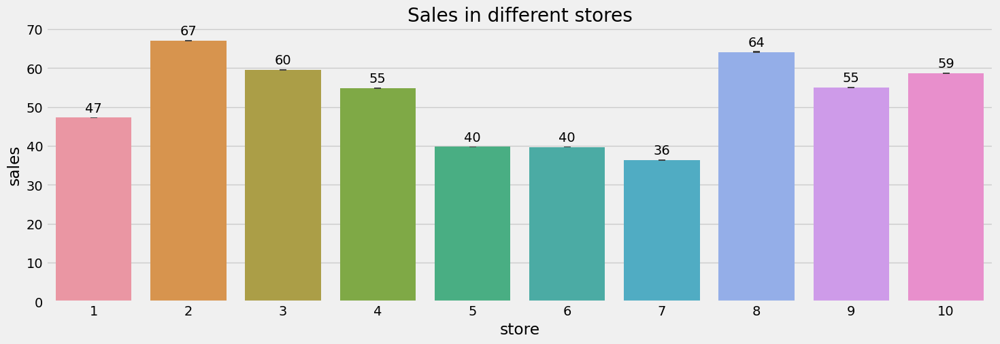

In [17]:
plt.figure(figsize=(16,5))
plt.title("Sales in different stores")
ax = sns.barplot(df['store'], df['sales'])

for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

plt.show()

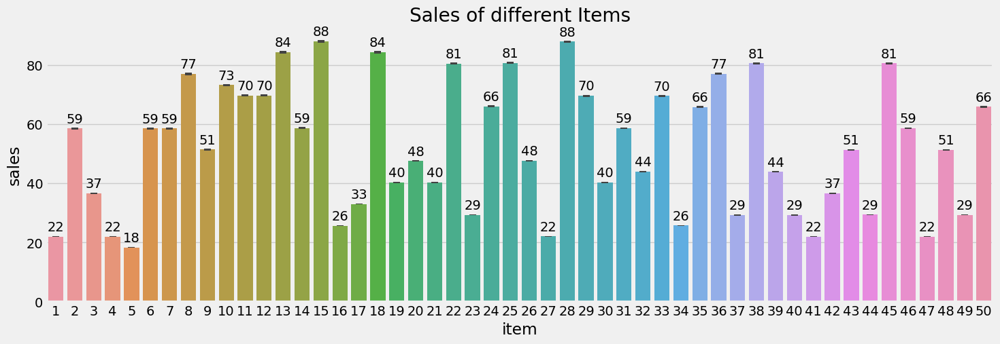

In [18]:
plt.figure(figsize=(16,5))
plt.title("Sales of different Items")
ax = sns.barplot(df['item'],df['sales'])

for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

plt.show()

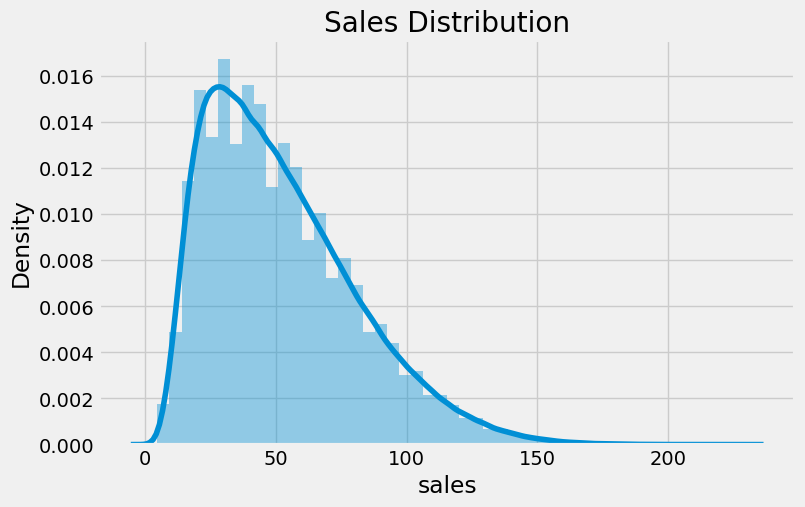

In [19]:
plt.figure(figsize = (8,5))
sns.distplot(df['sales'])
plt.title('Sales Distribution')
plt.show()

**Store 1**

In [20]:
store1_sales = df[df['store'] == 1]
store1_sales

,store,item,sales
date,,,
2013-01-01,1,1,13
2013-01-02,1,1,11
2013-01-03,1,1,14
2013-01-04,1,1,13
2013-01-05,1,1,10
...,...,...,...
2017-12-27,1,50,38
2017-12-28,1,50,52
2017-12-29,1,50,59


In [21]:
store1_sales.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 91300 entries, 2013-01-01 to 2017-12-31
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   store   91300 non-null  int64
 1   item    91300 non-null  int64
 2   sales   91300 non-null  int64
dtypes: int64(3)
memory usage: 2.8 MB


In [22]:
#daily sales of all products 
store1_daily = store1_sales.groupby('date')['sales'].sum().reset_index()
store1_daily

,date,sales
0,2013-01-01,1316
1,2013-01-02,1264
2,2013-01-03,1305
3,2013-01-04,1452
4,2013-01-05,1499
...,...,...
1821,2017-12-27,1837
1822,2017-12-28,1951
1823,2017-12-29,2116
1824,2017-12-30,2304


**Time Resampling**

In [23]:
store1_daily['date'] = pd.to_datetime(store1_daily['date'])
store1_daily.set_index('date', inplace=True)

In [24]:
store1_monthly=store1_daily.resample(rule='MS').mean()
store1_monthly

,sales
date,
2013-01-01,1325.064516
2013-02-01,1475.214286
2013-03-01,1800.870968
2013-04-01,2050.766667
2013-05-01,2234.580645
2013-06-01,2384.366667
2013-07-01,2500.870968
2013-08-01,2249.838710
2013-09-01,2080.266667


<AxesSubplot:xlabel='date'>

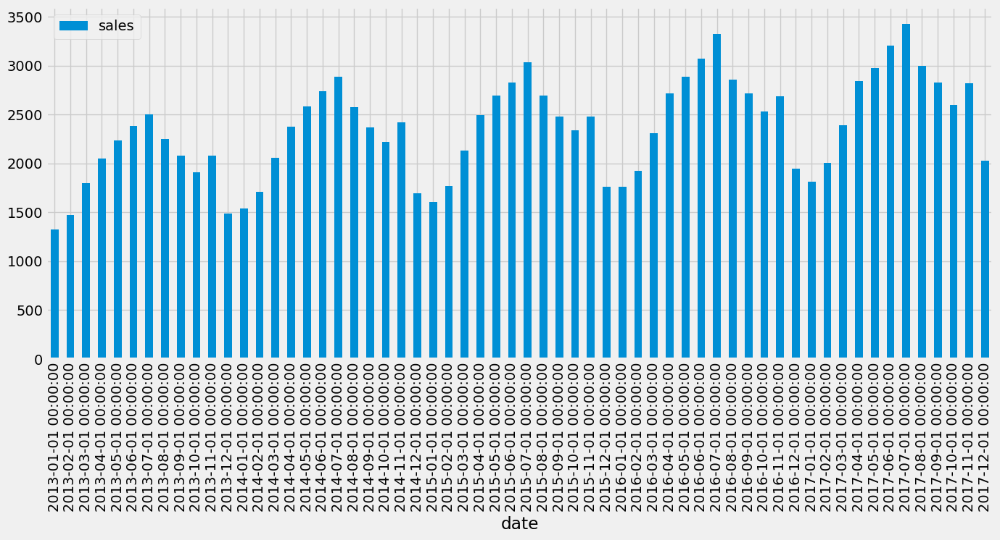

In [25]:
store1_daily.resample(rule='MS').mean().plot(kind='bar',figsize=(15,6))

In [26]:
store1_yearly=store1_daily.resample(rule='AS').mean()
store1_yearly

,sales
date,
2013-01-01,1966.684932
2014-01-01,2265.167123
2015-01-01,2360.849315
2016-01-01,2561.456284
2017-01-01,2662.394521


<AxesSubplot:xlabel='date'>

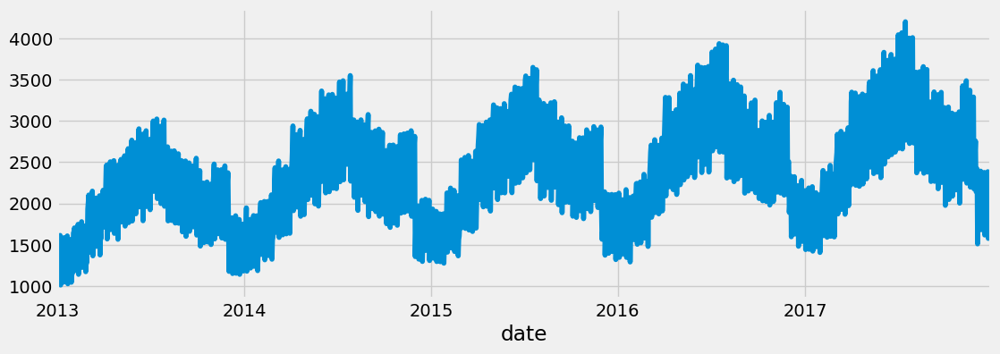

In [27]:
#Daily sales mean of store 1
store1_daily['sales'].plot(figsize=(12,4))

<AxesSubplot:xlabel='date'>

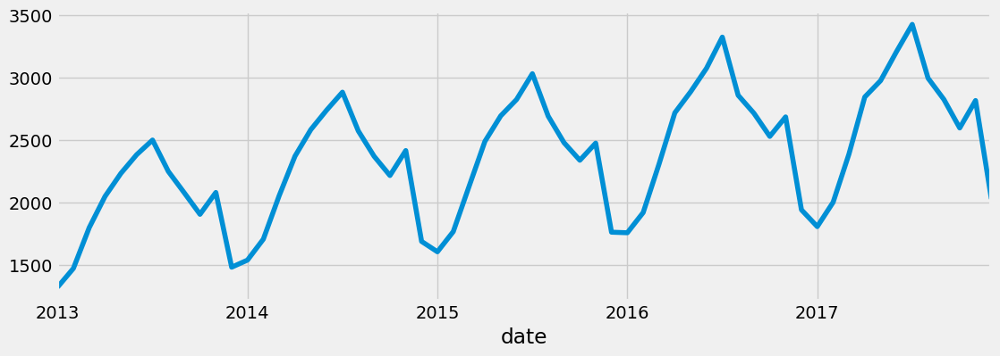

In [28]:
#Monthly sales mean of store 1
store1_monthly['sales'].plot(figsize=(12,4))

<AxesSubplot:xlabel='date'>

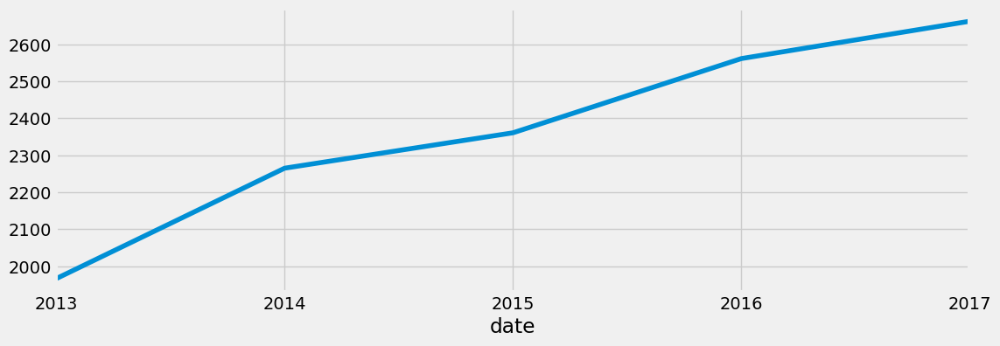

In [29]:
#Yearly sales mean of store 1
store1_yearly['sales'].plot(figsize=(12,4))

We observe an upward trend and seasonality in the data.

<AxesSubplot:xlabel='date'>

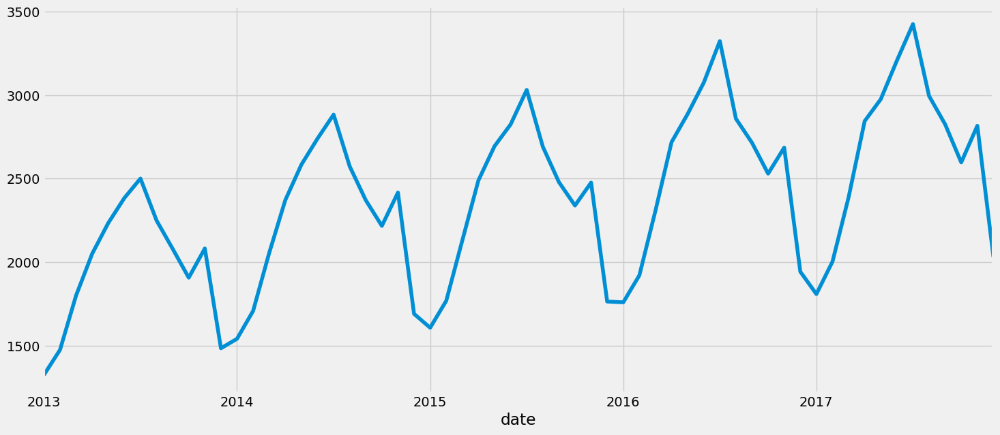

In [30]:
store1_monthly['sales'].plot(figsize=(16,7))

<AxesSubplot:xlabel='date'>

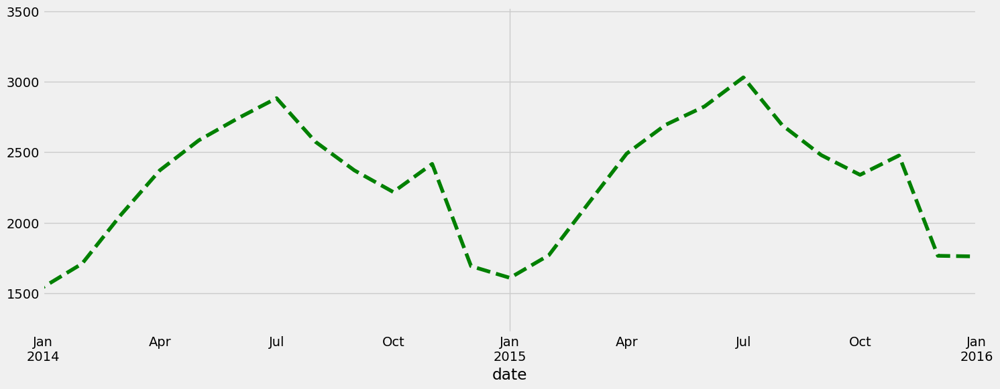

In [31]:
store1_monthly['sales'].plot(xlim=['2014-01-01','2016-01-31'],figsize=(16,6),ls='--',c='green')


There is an upward seasonality trend. July has highest monthly sales.

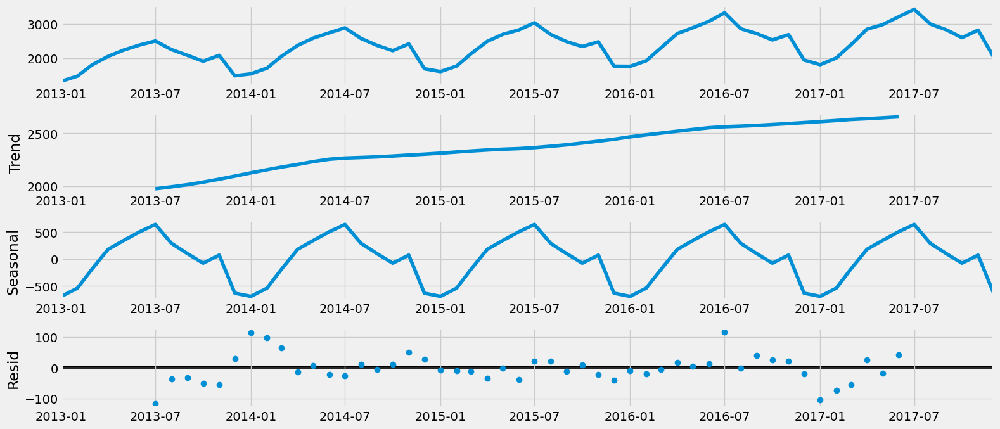

In [32]:
from pylab import rcParams
import statsmodels.api as sm

rcParams['figure.figsize'] = 16, 7

decomposition = sm.tsa.seasonal_decompose(store1_monthly, model='additive')
fig = decomposition.plot()
plt.show()

**Stationarity Checking**


**Dickey Fuller Test**

In [33]:
from statsmodels.tsa.stattools import adfuller

def adf_test(series):
    result = adfuller(series)
    print('ADF Statistics: {}'.format(result[0]))
    print('p-value: {}'.format(result[1]))
    if result[1] <= 0.05:
        print("strong evidence against the null hypothesis, reject the null hypothesis. Data has no unit root and is stationary")
    else:
        print("weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary")

If P-value is greater than 5 per cent, which means we cannot build a model on Non-stationary data so we have to make the time series stationary. To make time-series stationary if it is not, we can do differencing

In [34]:
adf_test(store1_monthly['sales'])

ADF Statistics: -5.165600152001801
p-value: 1.0330971280153451e-05
strong evidence against the null hypothesis, reject the null hypothesis. Data has no unit root and is stationary


**Rolling mean test**

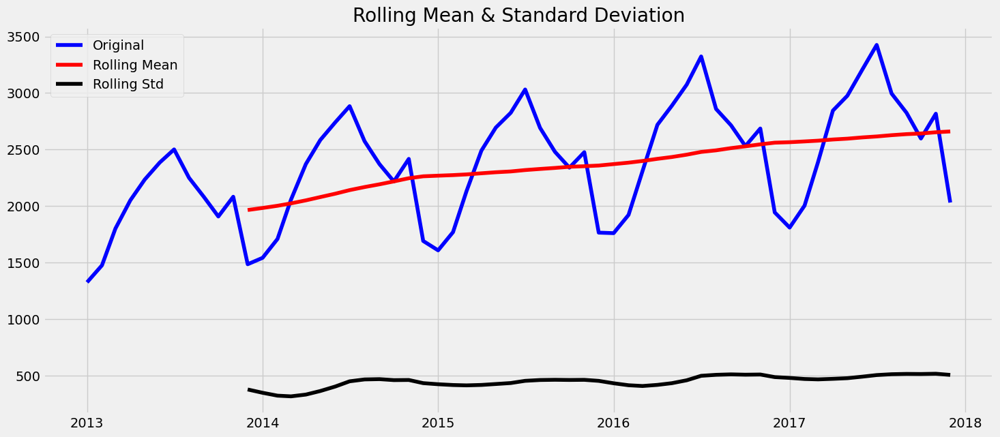

In [35]:
rolling_mean = store1_monthly.rolling(window=12).mean()
rolling_std = store1_monthly.rolling(window=12).std()

plt.plot(store1_monthly, color='blue', label='Original')
plt.plot(rolling_mean, color='red', label='Rolling Mean')
plt.plot(rolling_std, color='black', label='Rolling Std')

plt.legend(loc='best')
plt.title('Rolling Mean & Standard Deviation')
plt.show()

The rolling mean and standard deviation, both are almost horizontal. So time series is stationary.

**ACF and PACF**

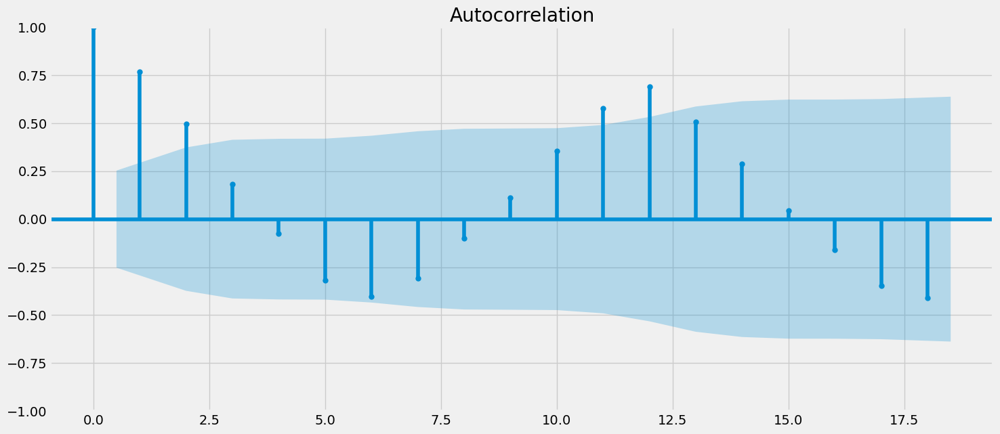

In [36]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
acf = plot_acf(store1_monthly["sales"])

MA (q) = number of lagged forecasts error in the predictions

take q = 14

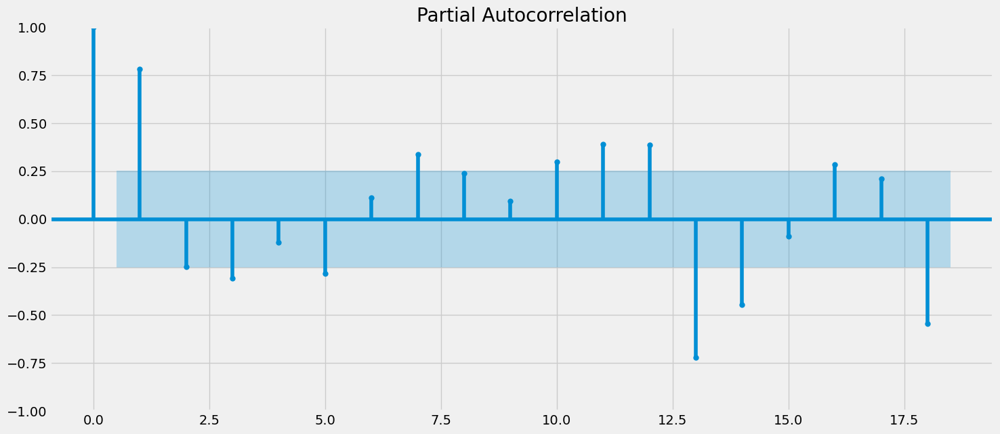

In [37]:
pacf = plot_pacf(store1_monthly["sales"])

AR (p) = number of auto-regressive terms

From PACF plot, p = 11 (no of lags crossing upper and lower band)

**ARIMA Model**

In [38]:
from statsmodels.tsa.arima.model import ARIMA

model=ARIMA(store1_monthly,order=(11,0,14))
model_fit=model.fit()
model_fit.summary()

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                  sales   No. Observations:                   60
Model:               ARIMA(11, 0, 14)   Log Likelihood               -1980.106
Date:                Fri, 09 Jun 2023   AIC                           4014.212
Time:                        18:22:44   BIC                           4070.760
Sample:                    01-01-2013   HQIC                          4036.331
                         - 12-01-2017                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       2361.2726        nan        nan        nan         nan         nan
ar.L1         -0.0089      0.010     -0.897      0.370      -0.028       0.011
ar.L2          0.9926      0.010    103.996      0.000       0.974       1.011
ar.L3         -0.9825      0.002   -397.178      0.000      -0.987      -0.978
ar.L4          0.0340      0.010      3.286      0.001       0.014       0.054
ar.L5          1.0035      0.011     89.406      0.000       0.981       1.025
ar.L6         -1.0578      0.005   -198.154      0.000      -1.068      -1.047
ar.L7          0.0681      0.010      6.698      0.000       0.048       0.088
ar.L8          0.9300      0.010     90.037      0.000       0.910       0.950
ar.L9         -1.0290      0.003   -340.362      0.000      -1.035      -1.023
ar.L10         0.1012      0.009     11.035      0.000       0.083       0.119
ar.L11         0.9488      0.010     98.783      0.000       0.930       0.968
ma.L1          0.1366      0.087      1.562      0.118      -0.035       0.308
ma.L2         -0.2770      0.314     -0.883      0.377      -0.892       0.338
ma.L3          1.4935      0.562      2.656      0.008       0.391       2.596
ma.L4         -0.4627      0.375     -1.235      0.217      -1.197       0.272
ma.L5          0.1710      0.144      1.184      0.236      -0.112       0.454
ma.L6          1.5854      0.063     25.085      0.000       1.462       1.709
ma.L7         -0.8654      0.124     -6.990      0.000      -1.108      -0.623
ma.L8          0.8863      0.154      5.751      0.000       0.584       1.188
ma.L9          0.9591      0.408      2.352      0.019       0.160       1.758
ma.L10        -0.8978      0.436     -2.058      0.040      -1.753      -0.043
ma.L11         1.0436      0.345      3.026      0.002       0.368       1.719
ma.L12         0.5790      0.165      3.505      0.000       0.255       0.903
ma.L13        -0.0553      0.044     -1.252      0.211      -0.142       0.031
ma.L14         0.4773      0.010     46.181      0.000       0.457       0.498
sigma2        87.4234        nan        nan        nan         nan         nan
===================================================================================
Ljung-Box (L1) (Q):                   0.58   Jarque-Bera (JB):                 0.72
Prob(Q):                              0.45   Prob(JB):                         0.70
Heteroskedasticity (H):               1.86   Skew:                             0.16
Prob(H) (two-sided):                  0.17   Kurtosis:                         3.43
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.25e+21. Standard errors may be unstable.
"""

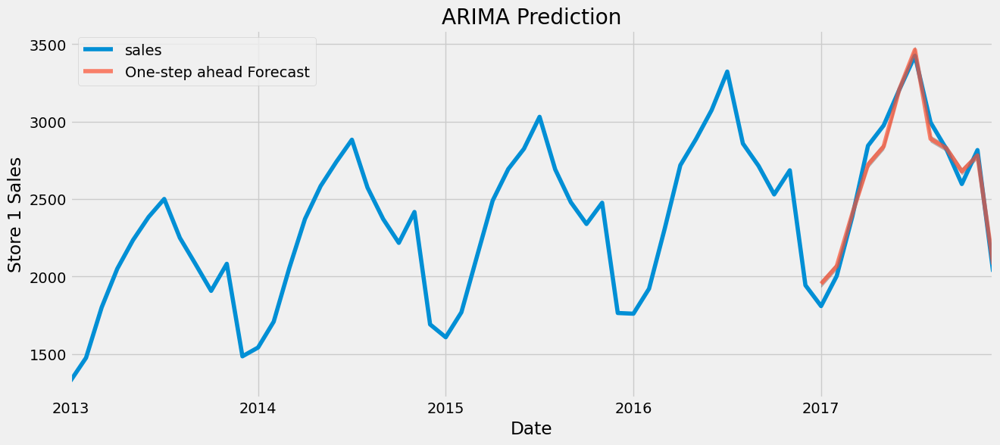

In [39]:
pred = model_fit.get_prediction(start=pd.to_datetime('2017-01-01'), dynamic=False)
pred_ci = pred.conf_int()

ax = store1_monthly['2013':].plot(label='observed')
pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 6))

ax.fill_between(pred_ci.index, pred_ci.iloc[:, 0], pred_ci.iloc[:, 1], color='k', alpha=.2)

plt.title("ARIMA Prediction")
plt.xlabel('Date')
plt.ylabel('Store 1 Sales')
plt.legend()
plt.show()

In [40]:
comp = pd.DataFrame()
comp['Store1 Sales'] = store1_monthly['2017':]
comp['ARIMA_Prediction'] = pred.predicted_mean
comp

,Store1 Sales,ARIMA_Prediction
date,,
2017-01-01,1809.225806,1953.337452
2017-02-01,2003.500000,2066.853920
2017-03-01,2388.290323,2407.550044
2017-04-01,2844.600000,2722.963436
2017-05-01,2975.741935,2840.037790
2017-06-01,3206.266667,3207.873386
2017-07-01,3425.387097,3464.151782
2017-08-01,2995.354839,2889.029940
2017-09-01,2825.300000,2829.383213


In [41]:
#Validating ARIMA Predictions - MSE, RMSE
monthly_forecasted_arima = pred.predicted_mean
monthly_truth = store1_monthly['2017-01-01':]

from sklearn.metrics import mean_squared_error, mean_absolute_error

mse = mean_squared_error(monthly_truth, monthly_forecasted_arima)
rmse = np.sqrt(mse)

print('Mean Squared Error (MSE) of forecasts: {}'.format(round(mse, 2)))
print('Root Mean Squared Error (RMSE) of forecasts: {}'.format(round(rmse, 2)))

Mean Squared Error (MSE) of forecasts: 6776.89
Root Mean Squared Error (RMSE) of forecasts: 82.32


In [42]:
ARIMA_RMSE = round(np.sqrt(mse), 2)
Store1_RMSE = pd.DataFrame([ARIMA_RMSE], columns=['ARIMA_RMSE'],index = ['Store1'])
Store1_RMSE

,ARIMA_RMSE
Store1,82.32


**Seasonal ARIMA Model**

In [43]:
import itertools

p = d = q = range(0, 2)
parameters = list(itertools.product(p, d, q))
seasonal_parameters = [(x[0], x[1], x[2], 12) for x in parameters]

examples = [(1, 1), (1, 2), (2, 3), (2, 4)]

print('Examples of parameter combinations for Seasonal ARIMA...')
for i, example in enumerate(examples):
    print('SARIMAX: {} x {}'.format(parameters[example[0]], seasonal_parameters[example[1]]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


In [44]:
import statsmodels.api as sm
import itertools

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(store1_monthly, order = param,
                                           seasonal_order = param_seasonal,
                                           enforce_stationarity = False,
                                           enforce_invertibility = False)
            results = mod.fit()
            print('SARIMAX{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue

NameError: name 'pdq' is not defined

**Fitting the SARIMA Model using the Optimal parameters**

Seasonal Autoregressive Integrated Moving Average (SARIMA)

In [45]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

model = SARIMAX(store1_monthly, order=(1, 1, 0), seasonal_order=(1, 1, 0, 12))
results = model.fit()
print(results.summary())

                                     SARIMAX Results                                      
Dep. Variable:                              sales   No. Observations:                   60
Model:             SARIMAX(1, 1, 0)x(1, 1, 0, 12)   Log Likelihood                -253.056
Date:                            Fri, 09 Jun 2023   AIC                            512.111
Time:                                    18:22:48   BIC                            517.661
Sample:                                01-01-2013   HQIC                           514.200
                                     - 12-01-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1167      0.127     -0.917      0.359      -0.366       0.133
ar.S.L12      -0.1275      0.176   

**Model diagnostics**

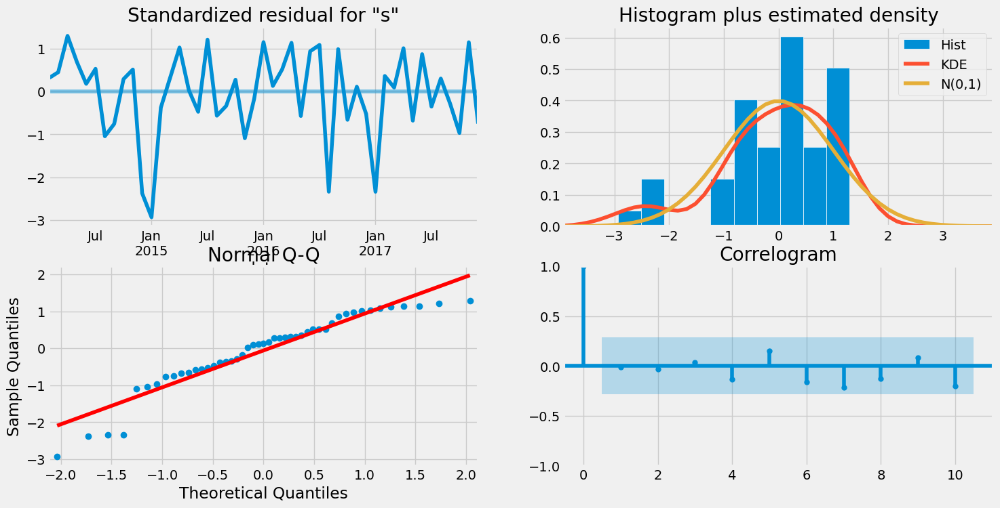

In [46]:
results.plot_diagnostics(figsize=(16,8))
plt.show()

**Prediction using SARIMA Model**

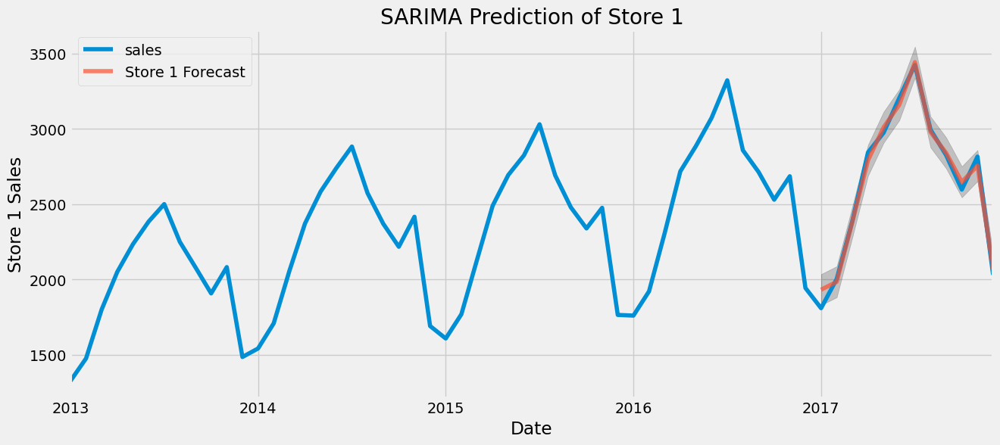

In [47]:
pred = results.get_prediction(start=pd.to_datetime('2017-01-01'), dynamic=False)
pred_ci = pred.conf_int()

ax = store1_monthly['2013':].plot(label='observed')
pred.predicted_mean.plot(ax=ax, label='Store 1 Forecast', alpha=0.7, figsize=(14, 6))

ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=0.2)

plt.title("SARIMA Prediction of Store 1")
ax.set_xlabel('Date')
ax.set_ylabel('Store 1 Sales')
plt.legend()
plt.show()

In [48]:
comp['SARIMA_Prediction']=pred.predicted_mean
comp

,Store1 Sales,ARIMA_Prediction,SARIMA_Prediction
date,,,
2017-01-01,1809.225806,1953.337452,1932.203587
2017-02-01,2003.500000,2066.853920,1984.614559
2017-03-01,2388.290323,2407.550044,2383.556606
2017-04-01,2844.600000,2722.963436,2791.721769
2017-05-01,2975.741935,2840.037790,3011.586155
2017-06-01,3206.266667,3207.873386,3160.620970
2017-07-01,3425.387097,3464.151782,3444.014539
2017-08-01,2995.354839,2889.029940,2979.636785
2017-09-01,2825.300000,2829.383213,2840.419708


**Validating SARIMA Prediction - MSE, RMSE**

In [49]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

monthly_forecasted_sarima = pred.predicted_mean
monthly_truth = store1_monthly['2017-01-01':]

mse = mean_squared_error(monthly_truth, monthly_forecasted_sarima)
rmse = np.sqrt(mse)

print('The Mean Squared Error of the forecasts is {}'.format(round(mse, 2)))
print('The Root Mean Squared Error of the forecasts is {}'.format(round(rmse, 2)))

The Mean Squared Error of the forecasts is 2522.63
The Root Mean Squared Error of the forecasts is 50.23


In [50]:
Store1_RMSE['SARIMA_RMSE'] = round(np.sqrt(mse), 2)
Store1_RMSE

,ARIMA_RMSE,SARIMA_RMSE
Store1,82.32,50.23


**Future Forecasting using SARIMA**

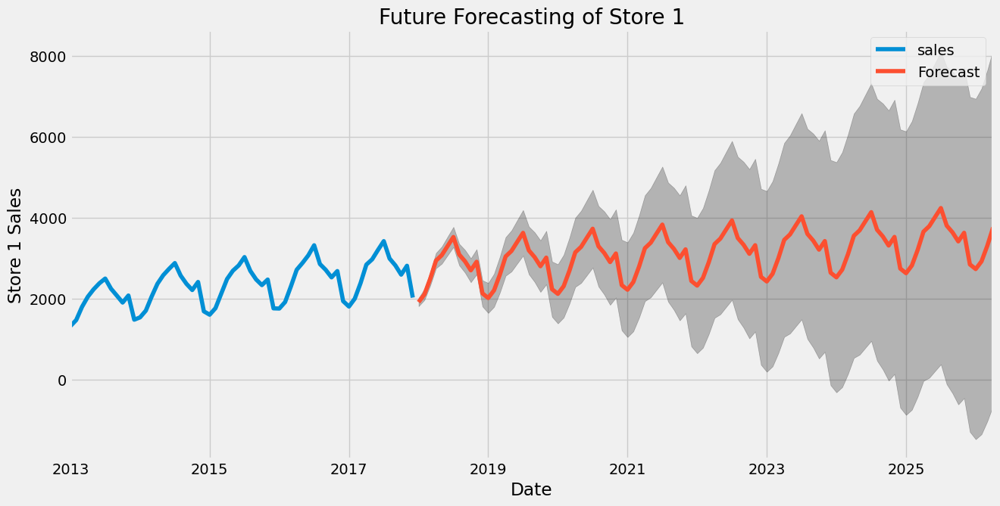

In [51]:
pred_uc = results.get_forecast(steps=100)
pred_ci = pred_uc.conf_int()

ax = store1_monthly.plot(label='observed', figsize=(14, 7))
pred_uc.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1],
                color='k',
                alpha=0.25)

plt.title("Future Forecasting of Store 1")
ax.set_xlabel('Date')
ax.set_ylabel('Store 1 Sales')
plt.legend()
plt.show()

**Comparing sales of all 10 stores**

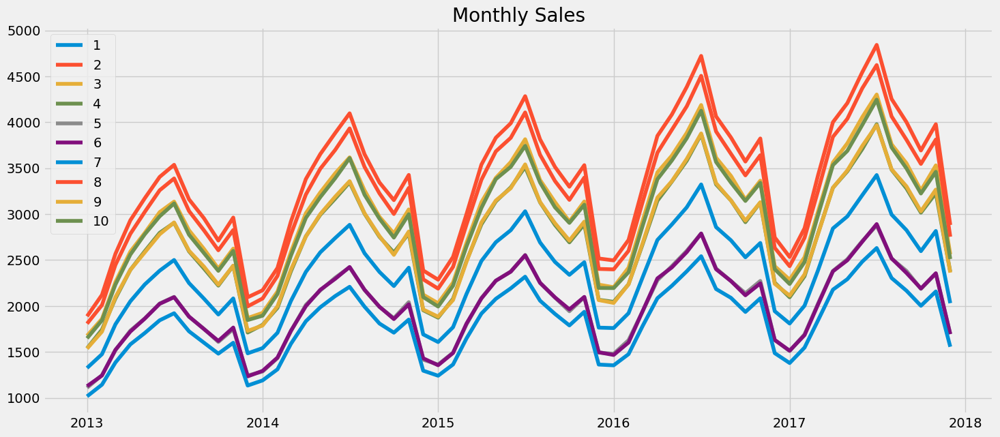

In [52]:
for i in df['store'].unique():
    store_sales = df[df['store'] == i]
    store_daily = store_sales.groupby("date").agg({"sales": "sum"})
    store_monthly = store_daily.resample(rule='MS').mean()
    plt.plot(store_monthly['sales'])

plt.title("Monthly Sales")
plt.legend(df['store'].unique())
plt.show()

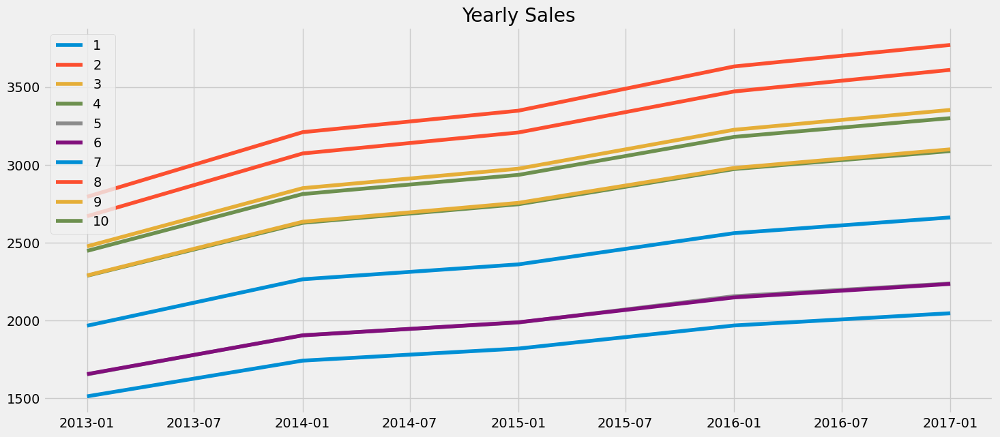

In [53]:
for i in df['store'].unique():
    store_sales = df[df['store'] == i]
    store_daily = store_sales.groupby("date").agg({"sales": "sum"})
    store_yearly = store_daily.resample(rule='AS').mean()
    plt.plot(store_yearly['sales'])

plt.title("Yearly Sales")
plt.legend(df['store'].unique())
plt.show()

**Store 2**

In [54]:
store2_sales = df[df['store'] == 2]
store2_daily = store2_sales.groupby("date").agg({"sales":"sum"})
store2_monthly = store2_daily.resample(rule='MS').mean()
store2_monthly.head()

,sales
date,
2013-01-01,1887.741935
2013-02-01,2120.857143
2013-03-01,2568.032258
2013-04-01,2932.900000
2013-05-01,3172.935484


<AxesSubplot:xlabel='date'>

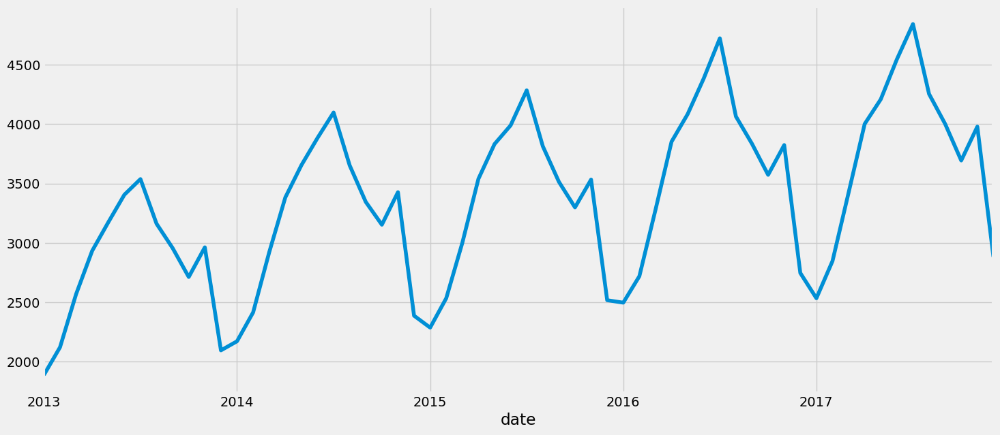

In [55]:
store2_monthly['sales'].plot(figsize=(16,7))

<AxesSubplot:xlabel='date'>

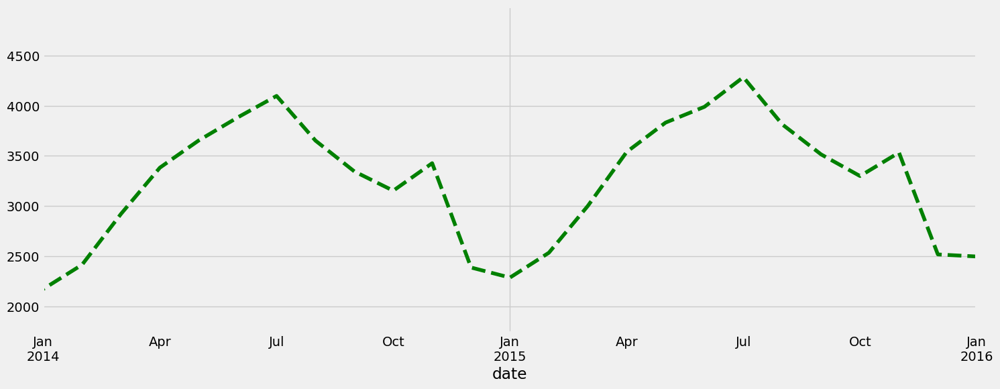

In [56]:
store2_monthly['sales'].plot(xlim=['2014-01-01','2016-01-31'],figsize=(16,6),ls='--',c='green')

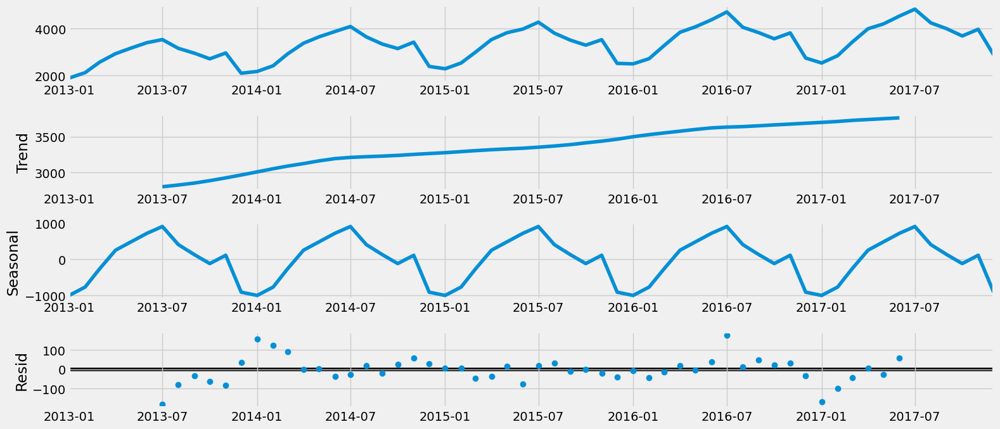

In [57]:
rcParams['figure.figsize'] = 16, 7

decomposition = sm.tsa.seasonal_decompose(store2_monthly, model='additive')
fig = decomposition.plot()
plt.show()

In [58]:
#Stationarity Checking
adf_test(store2_monthly['sales'])

ADF Statistics: -5.012487778568847
p-value: 2.0964255255147935e-05
strong evidence against the null hypothesis, reject the null hypothesis. Data has no unit root and is stationary


Since data is stationary, differencing not needed

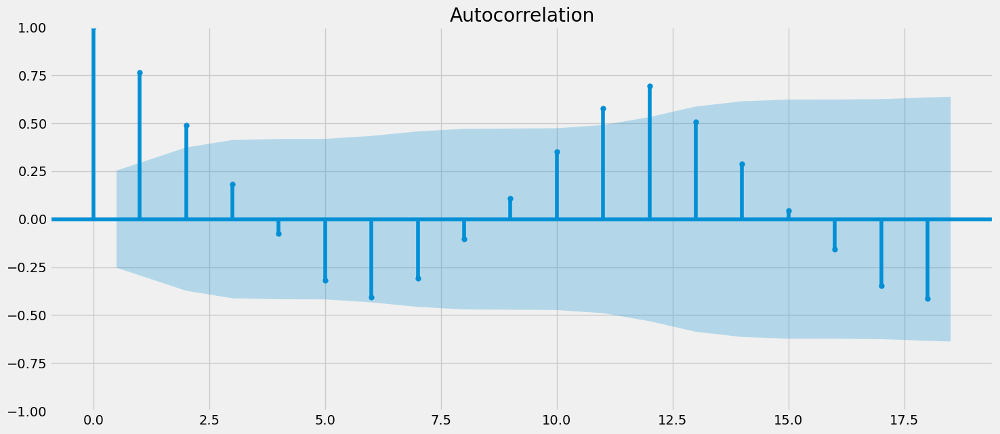

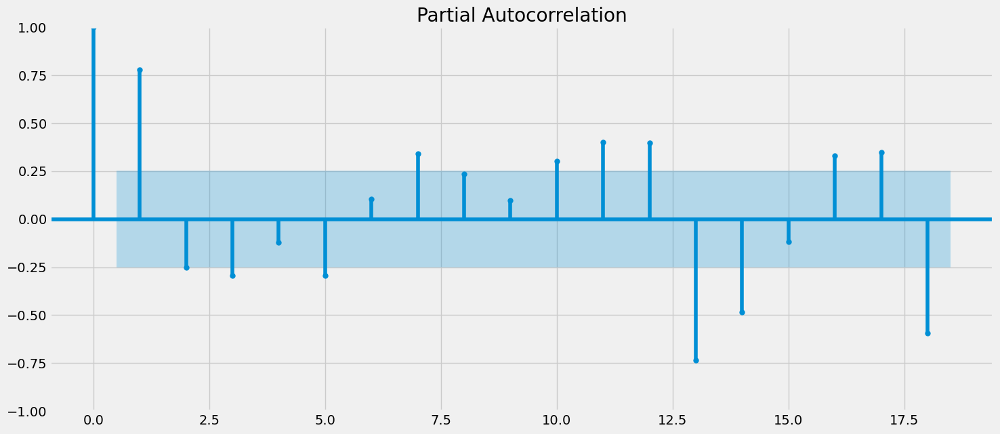

In [59]:
acf = plot_acf(store2_monthly["sales"])
pacf = plot_pacf(store2_monthly["sales"])

In [60]:
import itertools
import statsmodels.api as sm

p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(store2_monthly, order=param,
                                           seasonal_order=param_seasonal,
                                           enforce_stationarity=False,
                                           enforce_invertibility=False)
            results = mod.fit()
            print('SARIMAX{}x{}12 - AIC: {}'.format(param, param_seasonal, results.aic))
        except:
            continue

SARIMAX(0, 0, 0)x(0, 0, 0, 12)12 - AIC: 1130.4048230238648
SARIMAX(0, 0, 0)x(0, 0, 1, 12)12 - AIC: 853.1829785119992
SARIMAX(0, 0, 0)x(0, 1, 0, 12)12 - AIC: 663.8691160423692


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 0, 0)x(0, 1, 1, 12)12 - AIC: 1403.1973886616415
SARIMAX(0, 0, 0)x(1, 0, 0, 12)12 - AIC: 615.6736953269744
SARIMAX(0, 0, 0)x(1, 0, 1, 12)12 - AIC: 593.2983220686248
SARIMAX(0, 0, 0)x(1, 1, 0, 12)12 - AIC: 462.56930668727784


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 0, 0)x(1, 1, 1, 12)12 - AIC: 1105.0424318989158
SARIMAX(0, 0, 1)x(0, 0, 0, 12)12 - AIC: 1073.0319574698299


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 0, 1)x(0, 0, 1, 12)12 - AIC: 788.2066146037142
SARIMAX(0, 0, 1)x(0, 1, 0, 12)12 - AIC: 598.7065519615468


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 0, 1)x(0, 1, 1, 12)12 - AIC: 1452.7450578890298
SARIMAX(0, 0, 1)x(1, 0, 0, 12)12 - AIC: 579.7111624751683


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 0, 1)x(1, 0, 1, 12)12 - AIC: 561.7818825611338
SARIMAX(0, 0, 1)x(1, 1, 0, 12)12 - AIC: 439.45132767452725
SARIMAX(0, 0, 1)x(1, 1, 1, 12)12 - AIC: 1378.3679224071323
SARIMAX(0, 1, 0)x(0, 0, 0, 12)12 - AIC: 874.0649644002665
SARIMAX(0, 1, 0)x(0, 0, 1, 12)12 - AIC: 661.8066975762621
SARIMAX(0, 1, 0)x(0, 1, 0, 12)12 - AIC: 531.7772135264679


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 0)x(0, 1, 1, 12)12 - AIC: 1319.893331880158
SARIMAX(0, 1, 0)x(1, 0, 0, 12)12 - AIC: 539.1139175759857
SARIMAX(0, 1, 0)x(1, 0, 1, 12)12 - AIC: 525.974407858953
SARIMAX(0, 1, 0)x(1, 1, 0, 12)12 - AIC: 399.3437606354975


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 0)x(1, 1, 1, 12)12 - AIC: 1448.1242011224313
SARIMAX(0, 1, 1)x(0, 0, 0, 12)12 - AIC: 859.548461983349
SARIMAX(0, 1, 1)x(0, 0, 1, 12)12 - AIC: 647.7028610280121
SARIMAX(0, 1, 1)x(0, 1, 0, 12)12 - AIC: 522.2512486325087


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 1)x(0, 1, 1, 12)12 - AIC: 1174.7148618955534
SARIMAX(0, 1, 1)x(1, 0, 0, 12)12 - AIC: 539.2572198831153


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 1)x(1, 0, 1, 12)12 - AIC: 518.6259946453795
SARIMAX(0, 1, 1)x(1, 1, 0, 12)12 - AIC: 397.0461263917278


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 1)x(1, 1, 1, 12)12 - AIC: 1174.1876747279423
SARIMAX(1, 0, 0)x(0, 0, 0, 12)12 - AIC: 890.2845723294722
SARIMAX(1, 0, 0)x(0, 0, 1, 12)12 - AIC: 677.7117907525765
SARIMAX(1, 0, 0)x(0, 1, 0, 12)12 - AIC: 542.9669284413716


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 0, 0)x(0, 1, 1, 12)12 - AIC: 1100.5373097871852
SARIMAX(1, 0, 0)x(1, 0, 0, 12)12 - AIC: 537.5521357279807
SARIMAX(1, 0, 0)x(1, 0, 1, 12)12 - AIC: 534.4480720759475
SARIMAX(1, 0, 0)x(1, 1, 0, 12)12 - AIC: 400.6739962855555


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 0, 0)x(1, 1, 1, 12)12 - AIC: 1020.5681590448055
SARIMAX(1, 0, 1)x(0, 0, 0, 12)12 - AIC: 876.3603568147201
SARIMAX(1, 0, 1)x(0, 0, 1, 12)12 - AIC: 664.8223987738111
SARIMAX(1, 0, 1)x(0, 1, 0, 12)12 - AIC: 534.1200555844944


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 0, 1)x(0, 1, 1, 12)12 - AIC: 1359.3927940479984
SARIMAX(1, 0, 1)x(1, 0, 0, 12)12 - AIC: 538.5996302163314
SARIMAX(1, 0, 1)x(1, 0, 1, 12)12 - AIC: 524.1316401811903
SARIMAX(1, 0, 1)x(1, 1, 0, 12)12 - AIC: 399.62844888773685


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 0, 1)x(1, 1, 1, 12)12 - AIC: 1281.6206484732475
SARIMAX(1, 1, 0)x(0, 0, 0, 12)12 - AIC: 873.9595626546578
SARIMAX(1, 1, 0)x(0, 0, 1, 12)12 - AIC: 661.9057346000583
SARIMAX(1, 1, 0)x(0, 1, 0, 12)12 - AIC: 533.4887672800247


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 1, 0)x(0, 1, 1, 12)12 - AIC: 1143.1865374885695
SARIMAX(1, 1, 0)x(1, 0, 0, 12)12 - AIC: 529.2454538474557
SARIMAX(1, 1, 0)x(1, 0, 1, 12)12 - AIC: 525.1580934309657
SARIMAX(1, 1, 0)x(1, 1, 0, 12)12 - AIC: 387.2266439408536


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 1, 0)x(1, 1, 1, 12)12 - AIC: 1179.7638187278512
SARIMAX(1, 1, 1)x(0, 0, 0, 12)12 - AIC: 860.8496391012898
SARIMAX(1, 1, 1)x(0, 0, 1, 12)12 - AIC: 647.514799421101
SARIMAX(1, 1, 1)x(0, 1, 0, 12)12 - AIC: 522.1403712380505


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 1, 1)x(0, 1, 1, 12)12 - AIC: 1339.4464793140326
SARIMAX(1, 1, 1)x(1, 0, 0, 12)12 - AIC: 533.1210447642326


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 1, 1)x(1, 0, 1, 12)12 - AIC: 516.0379465437019
SARIMAX(1, 1, 1)x(1, 1, 0, 12)12 - AIC: 386.86110991379667
SARIMAX(1, 1, 1)x(1, 1, 1, 12)12 - AIC: 1337.53569445574


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [61]:
from statsmodels.tsa.api import SARIMAX

model = SARIMAX(store2_monthly, order=(1, 1, 1), seasonal_order=(1, 1, 0, 12))
results = model.fit()
print(results.summary())

                                      SARIMAX Results                                      
Dep. Variable:                               sales   No. Observations:                   60
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 12)   Log Likelihood                -268.413
Date:                             Fri, 09 Jun 2023   AIC                            544.825
Time:                                     18:23:27   BIC                            552.226
Sample:                                 01-01-2013   HQIC                           547.610
                                      - 12-01-2017                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8287      0.214     -3.874      0.000      -1.248      -0.409
ma.L1          0.9917      

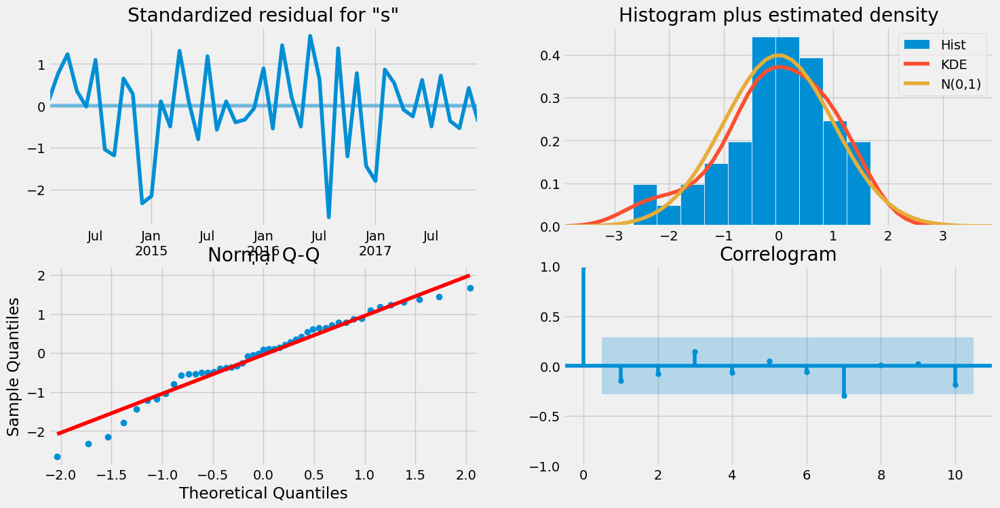

In [62]:
results.plot_diagnostics(figsize=(16,8))
plt.show()

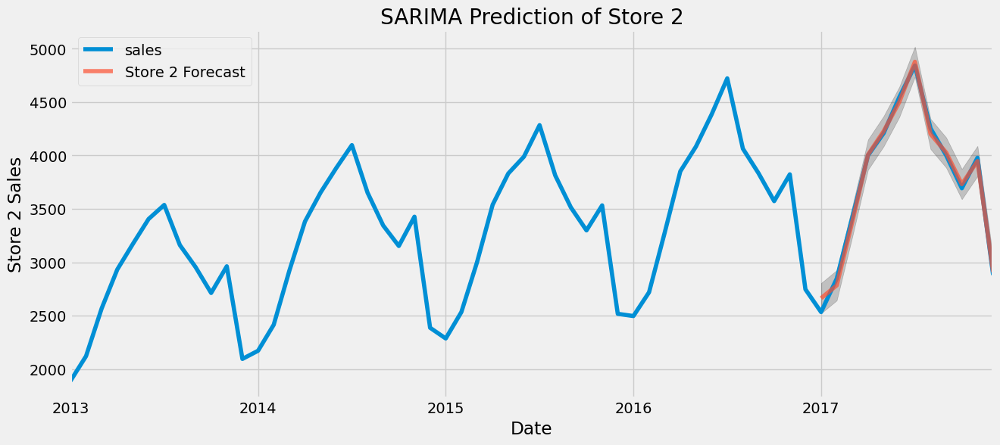

In [63]:
pred2 = results.get_prediction(start=pd.to_datetime('2017-01-01'), dynamic=False)
pred2_ci = pred2.conf_int()

ax = store2_monthly['2013':].plot(label='observed')
pred2.predicted_mean.plot(ax=ax, label='Store 2 Forecast', alpha=.7, figsize=(14, 6))

ax.fill_between(pred2_ci.index, pred2_ci.iloc[:, 0], pred2_ci.iloc[:, 1], color='k', alpha=.2)

plt.title("SARIMA Prediction of Store 2")
ax.set_xlabel('Date')
ax.set_ylabel('Store 2 Sales')
plt.legend()
plt.show()

In [64]:
store2_forecasted_sales = pred2.predicted_mean
store2_true_sales = store2_monthly['2017-01-01':]

from sklearn.metrics import mean_squared_error

mse = mean_squared_error(store2_true_sales, store2_forecasted_sales)
rmse = np.sqrt(mse)

print('The Mean Squared Error of forecasts is {}'.format(round(mse, 2)))
print('The Root Mean Squared Error of forecasts is {}'.format(round(rmse, 2)))

The Mean Squared Error of forecasts is 2702.81
The Root Mean Squared Error of forecasts is 51.99


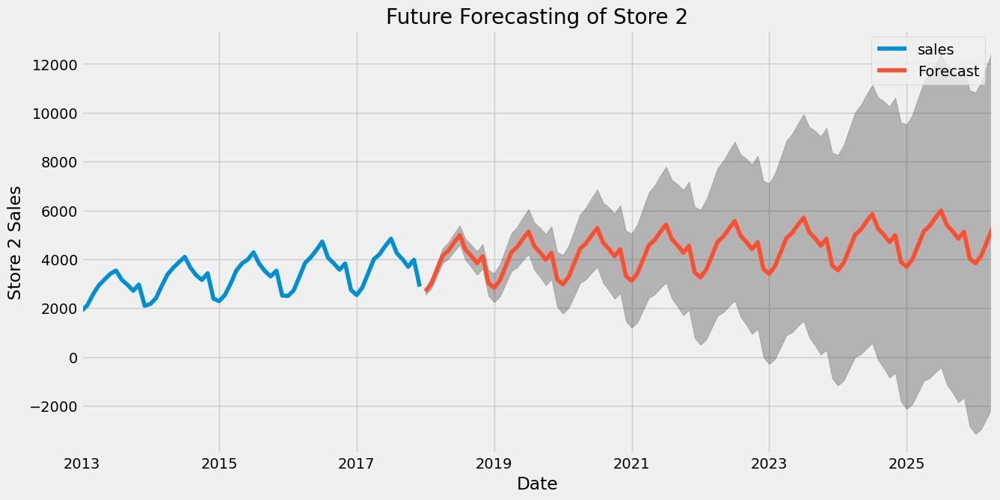

In [65]:
pred2_uc = results.get_forecast(steps=100)
pred2_ci = pred2_uc.conf_int()

ax = store2_monthly.plot(label='observed', figsize=(14, 7))
pred2_uc.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred2_ci.index, pred2_ci.iloc[:, 0], pred2_ci.iloc[:, 1], color='k', alpha=0.25)

plt.title("Future Forecasting of Store 2")
ax.set_xlabel('Date')
ax.set_ylabel('Store 2 Sales')
plt.legend()
plt.show()

**Store 3**

In [66]:
store3_sales = df[df['store'] == 3]
store3_daily = store3_sales.groupby("date").agg({"sales":"sum"})
store3_monthly = store3_daily.resample(rule='MS').mean()
store3_monthly.head()

,sales
date,
2013-01-01,1676.516129
2013-02-01,1860.035714
2013-03-01,2260.290323
2013-04-01,2592.233333
2013-05-01,2795.612903


<AxesSubplot:xlabel='date'>

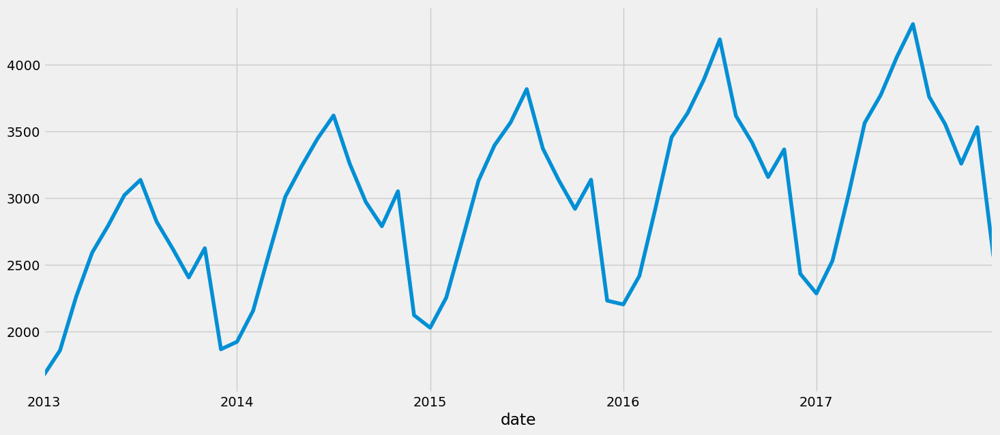

In [67]:
store3_monthly['sales'].plot(figsize=(16,7))

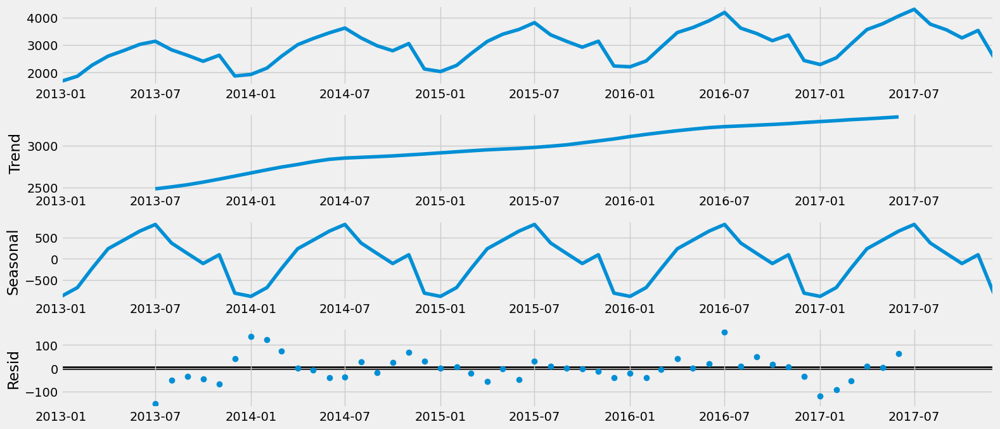

In [68]:
rcParams['figure.figsize'] = 16, 7

decomposition = sm.tsa.seasonal_decompose(store3_monthly, model='additive')
fig = decomposition.plot()
plt.show()

In [69]:
adf_test(store3_monthly['sales'])

ADF Statistics: -5.209288098694478
p-value: 8.416209770663302e-06
strong evidence against the null hypothesis, reject the null hypothesis. Data has no unit root and is stationary


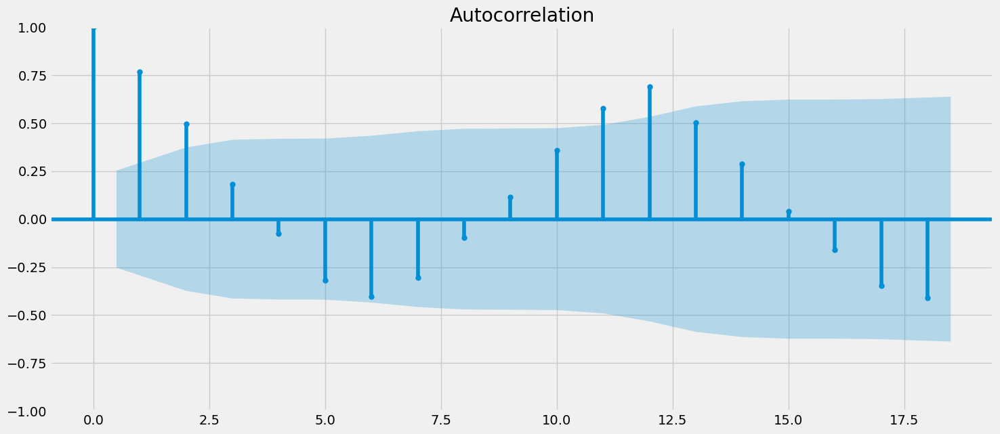

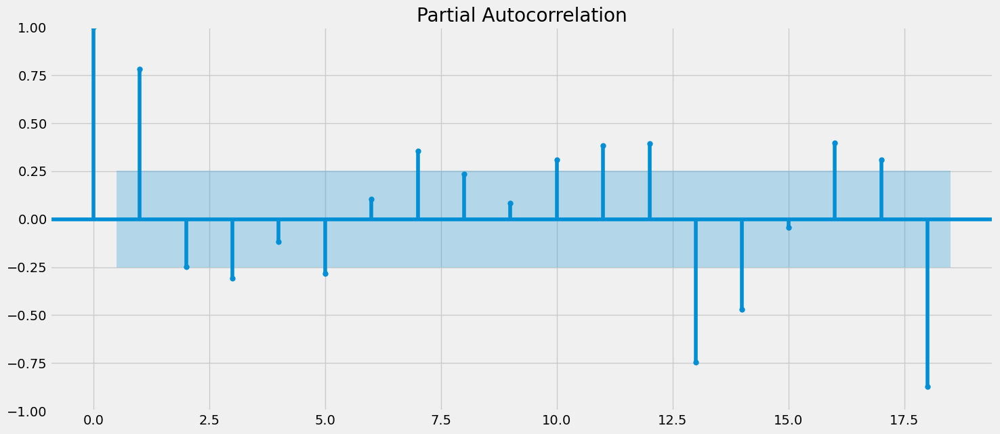

In [70]:
acf = plot_acf(store3_monthly["sales"])
pacf = plot_pacf(store3_monthly["sales"])

In [71]:
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(store3_monthly, order=param, seasonal_order=param_seasonal,
                                           enforce_stationarity=False, enforce_invertibility=False)
            results = mod.fit()
            print('SARIMAX{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue

SARIMAX(0, 0, 0)x(0, 0, 0, 12)12 - AIC:1116.408015191234
SARIMAX(0, 0, 0)x(0, 0, 1, 12)12 - AIC:842.0554670631371
SARIMAX(0, 0, 0)x(0, 1, 0, 12)12 - AIC:653.4898349924689


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 0, 0)x(0, 1, 1, 12)12 - AIC:1462.9449732721653
SARIMAX(0, 0, 0)x(1, 0, 0, 12)12 - AIC:604.2278436347885
SARIMAX(0, 0, 0)x(1, 0, 1, 12)12 - AIC:581.2596687915561
SARIMAX(0, 0, 0)x(1, 1, 0, 12)12 - AIC:452.179991867004
SARIMAX(0, 0, 0)x(1, 1, 1, 12)12 - AIC:428.3262570979223
SARIMAX(0, 0, 1)x(0, 0, 0, 12)12 - AIC:1059.3694286526509


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 0, 1)x(0, 0, 1, 12)12 - AIC:778.9981886103579
SARIMAX(0, 0, 1)x(0, 1, 0, 12)12 - AIC:590.1103575808697


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 0, 1)x(0, 1, 1, 12)12 - AIC:1350.6994947593973
SARIMAX(0, 0, 1)x(1, 0, 0, 12)12 - AIC:564.9449236272147


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 0, 1)x(1, 0, 1, 12)12 - AIC:540.6422739673959
SARIMAX(0, 0, 1)x(1, 1, 0, 12)12 - AIC:426.99654363622085
SARIMAX(0, 0, 1)x(1, 1, 1, 12)12 - AIC:395.5088673826705
SARIMAX(0, 1, 0)x(0, 0, 0, 12)12 - AIC:859.9627483797933
SARIMAX(0, 1, 0)x(0, 0, 1, 12)12 - AIC:650.6184938033922
SARIMAX(0, 1, 0)x(0, 1, 0, 12)12 - AIC:513.739098358928


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 0)x(0, 1, 1, 12)12 - AIC:1392.8217391362273
SARIMAX(0, 1, 0)x(1, 0, 0, 12)12 - AIC:519.5394916550134
SARIMAX(0, 1, 0)x(1, 0, 1, 12)12 - AIC:508.0195297589617
SARIMAX(0, 1, 0)x(1, 1, 0, 12)12 - AIC:383.4706007171029
SARIMAX(0, 1, 0)x(1, 1, 1, 12)12 - AIC:1436.345159732471
SARIMAX(0, 1, 1)x(0, 0, 0, 12)12 - AIC:845.7546979347168
SARIMAX(0, 1, 1)x(0, 0, 1, 12)12 - AIC:637.1002048245796
SARIMAX(0, 1, 1)x(0, 1, 0, 12)12 - AIC:504.9043204564127
SARIMAX(0, 1, 1)x(0, 1, 1, 12)12 - AIC:1395.323383566459
SARIMAX(0, 1, 1)x(1, 0, 0, 12)12 - AIC:519.9770151077292


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 1)x(1, 0, 1, 12)12 - AIC:502.5293997328129
SARIMAX(0, 1, 1)x(1, 1, 0, 12)12 - AIC:381.4579253520299
SARIMAX(0, 1, 1)x(1, 1, 1, 12)12 - AIC:1396.276184446225
SARIMAX(1, 0, 0)x(0, 0, 0, 12)12 - AIC:875.8829513855917
SARIMAX(1, 0, 0)x(0, 0, 1, 12)12 - AIC:666.3747223176405
SARIMAX(1, 0, 0)x(0, 1, 0, 12)12 - AIC:525.3030841056128


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 0, 0)x(0, 1, 1, 12)12 - AIC:1451.8344113624878
SARIMAX(1, 0, 0)x(1, 0, 0, 12)12 - AIC:518.4643928768934
SARIMAX(1, 0, 0)x(1, 0, 1, 12)12 - AIC:517.0224101205458
SARIMAX(1, 0, 0)x(1, 1, 0, 12)12 - AIC:384.8421614967806
SARIMAX(1, 0, 0)x(1, 1, 1, 12)12 - AIC:386.84215949331553
SARIMAX(1, 0, 1)x(0, 0, 0, 12)12 - AIC:862.3643127203412
SARIMAX(1, 0, 1)x(0, 0, 1, 12)12 - AIC:653.912335828435
SARIMAX(1, 0, 1)x(0, 1, 0, 12)12 - AIC:516.0366631202087
SARIMAX(1, 0, 1)x(0, 1, 1, 12)12 - AIC:1458.4028433453482
SARIMAX(1, 0, 1)x(1, 0, 0, 12)12 - AIC:519.5182157900882
SARIMAX(1, 0, 1)x(1, 0, 1, 12)12 - AIC:506.27513822256157
SARIMAX(1, 0, 1)x(1, 1, 0, 12)12 - AIC:383.7117830558896
SARIMAX(1, 0, 1)x(1, 1, 1, 12)12 - AIC:374.5115843500668
SARIMAX(1, 1, 0)x(0, 0, 0, 12)12 - AIC:859.9435757679881
SARIMAX(1, 1, 0)x(0, 0, 1, 12)12 - AIC:650.8787631635388
SARIMAX(1, 1, 0)x(0, 1, 0, 12)12 - AIC:515.3910769309375


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 1, 0)x(0, 1, 1, 12)12 - AIC:1504.0926852972714
SARIMAX(1, 1, 0)x(1, 0, 0, 12)12 - AIC:509.71335521855013


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 1, 0)x(1, 0, 1, 12)12 - AIC:513.3995815083172
SARIMAX(1, 1, 0)x(1, 1, 0, 12)12 - AIC:369.85626830469687


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 1, 0)x(1, 1, 1, 12)12 - AIC:1496.390619651851
SARIMAX(1, 1, 1)x(0, 0, 0, 12)12 - AIC:846.9304128309195
SARIMAX(1, 1, 1)x(0, 0, 1, 12)12 - AIC:636.8091351294373
SARIMAX(1, 1, 1)x(0, 1, 0, 12)12 - AIC:506.8174887933868


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 1, 1)x(0, 1, 1, 12)12 - AIC:1269.0019344698503
SARIMAX(1, 1, 1)x(1, 0, 0, 12)12 - AIC:511.54754810921816
SARIMAX(1, 1, 1)x(1, 0, 1, 12)12 - AIC:498.78733504248424
SARIMAX(1, 1, 1)x(1, 1, 0, 12)12 - AIC:371.77924345146033
SARIMAX(1, 1, 1)x(1, 1, 1, 12)12 - AIC:1032.5910036320581


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [72]:
model=SARIMAX(store3_monthly,order=(1,1,0),seasonal_order=(1,1,0,12))
results=model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              sales   No. Observations:                   60
Model:             SARIMAX(1, 1, 0)x(1, 1, 0, 12)   Log Likelihood                -260.982
Date:                            Fri, 09 Jun 2023   AIC                            527.964
Time:                                    18:23:52   BIC                            533.514
Sample:                                01-01-2013   HQIC                           530.053
                                     - 12-01-2017                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0934      0.116     -0.803      0.422      -0.321       0.134
ar.S.L12      -0.0684      0.201     -0.340      0.734      -0.463       0.326
sigma2      3886.6286    770.326      5.045      0.000    2376.816    5396.441
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                 5.43
Prob(Q):                              0.95   Prob(JB):                         0.07
Heteroskedasticity (H):               0.34   Skew:                            -0.82
Prob(H) (two-sided):                  0.04   Kurtosis:                         3.33
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

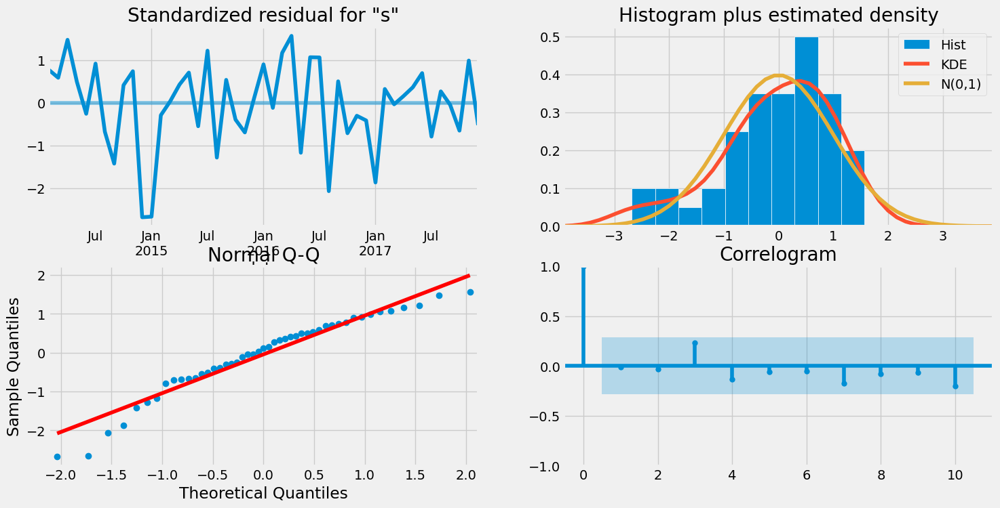

In [73]:
results.plot_diagnostics(figsize=(16,8))
plt.show()

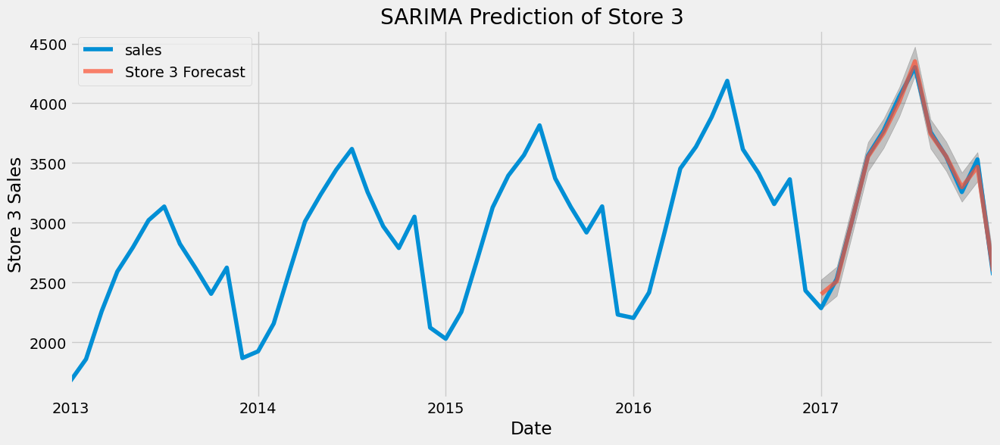

In [74]:
pred3 = results.get_prediction(start=pd.to_datetime('2017-01-01'), dynamic=False)
pred3_ci = pred3.conf_int()

ax = store3_monthly['2013':].plot(label='observed')
pred3.predicted_mean.plot(ax=ax, label='Store 3 Forecast', alpha=0.7, figsize=(14, 6))

ax.fill_between(pred3_ci.index, pred3_ci.iloc[:, 0], pred3_ci.iloc[:, 1], color='k', alpha=0.2)

plt.title("SARIMA Prediction of Store 3")
ax.set_xlabel('Date')
ax.set_ylabel('Store 3 Sales')
plt.legend()
plt.show()

In [75]:
store3_forecasted_sales = pred3.predicted_mean
store3_true_sales = store3_monthly['2017-01-01':]

mse = mean_squared_error(store3_true_sales, store3_forecasted_sales)
print('The Mean Squared Error of forecasts is {}'.format(round(mse, 2)))
print('The Root Mean Squared Error of forecasts is {}'.format(round(np.sqrt(mse), 2)))

The Mean Squared Error of forecasts is 2136.54
The Root Mean Squared Error of forecasts is 46.22


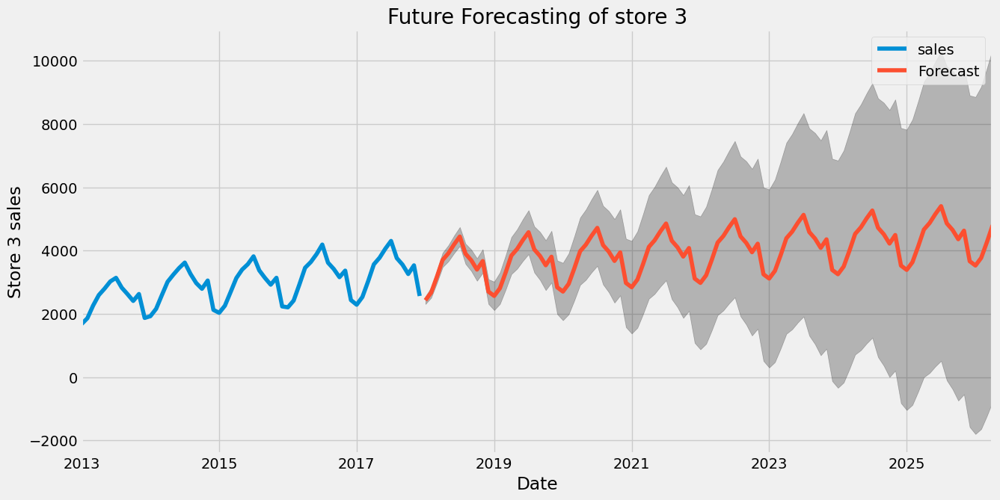

In [76]:
pred3_uc = results.get_forecast(steps=100)
pred3_ci = pred3_uc.conf_int()

ax = store3_monthly.plot(label='observed', figsize=(14, 7))
pred3_uc.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred3_ci.index,
                pred3_ci.iloc[:, 0],
                pred3_ci.iloc[:, 1],
                color='k',
                alpha=0.25)

plt.title("Future Forecasting of store 3")
ax.set_xlabel('Date')
ax.set_ylabel('Store 3 sales')
plt.legend()
plt.show()

**Store 4**

In [77]:
store4_sales = df[df['store'] == 4]
store4_daily = store4_sales.groupby("date").agg({"sales":"sum"})
store4_monthly = store4_daily.resample(rule='MS').mean()

<AxesSubplot:xlabel='date'>

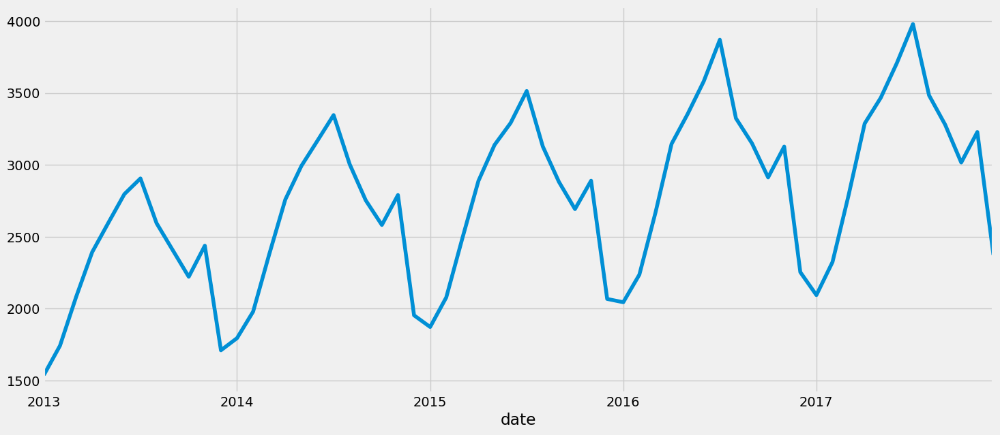

In [78]:
store4_monthly['sales'].plot(figsize=(16,7))

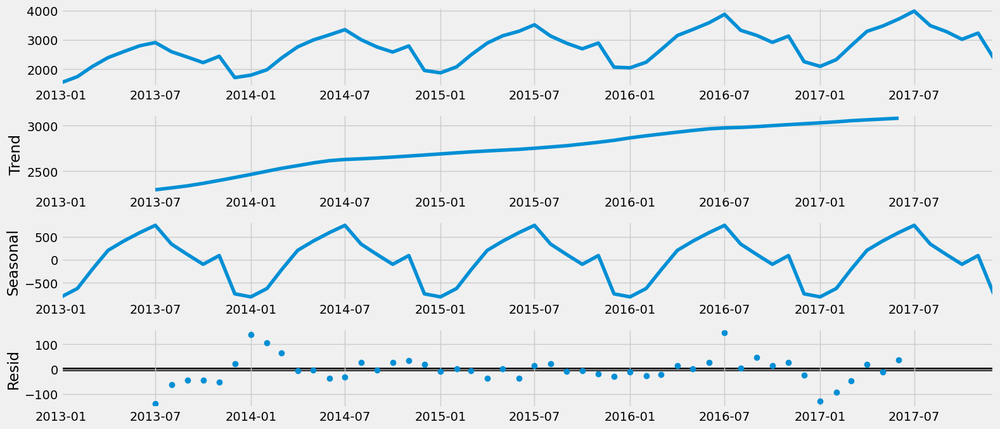

In [79]:
rcParams['figure.figsize'] = 16, 7

decomposition = sm.tsa.seasonal_decompose(store4_monthly, model='additive')
fig = decomposition.plot()
plt.show()

In [80]:
adf_test(store4_monthly['sales'])

ADF Statistics: -5.51180736951361
p-value: 1.964494703766212e-06
strong evidence against the null hypothesis, reject the null hypothesis. Data has no unit root and is stationary


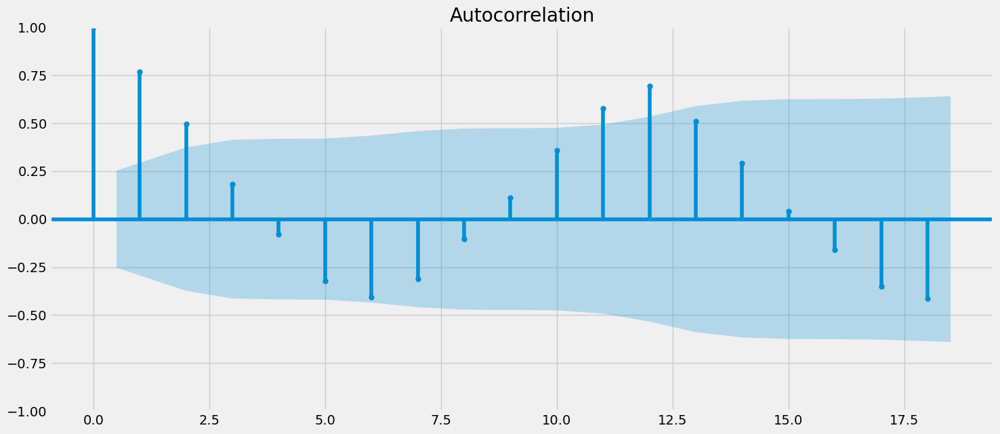

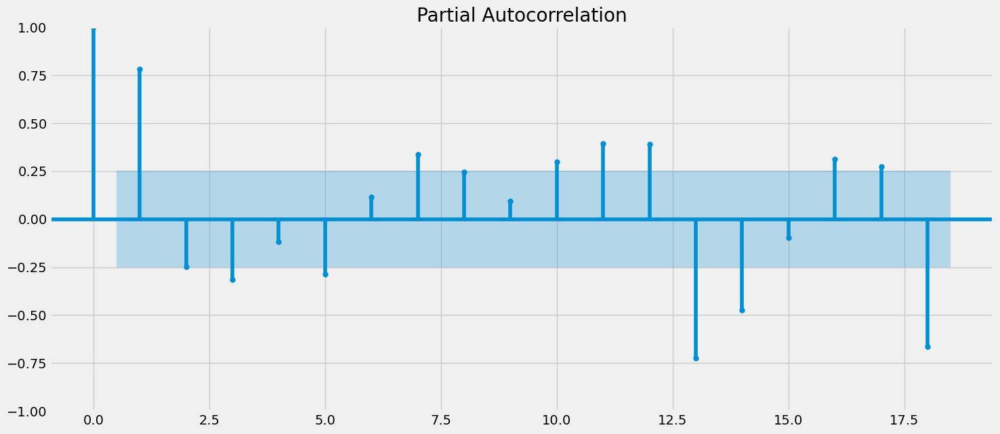

In [81]:
acf = plot_acf(store4_monthly["sales"])
pacf = plot_pacf(store4_monthly["sales"])

In [82]:
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(store4_monthly, order=param, seasonal_order=param_seasonal,
                                           enforce_stationarity=False, enforce_invertibility=False)
            results = mod.fit()
            print('SARIMAX{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue

SARIMAX(0, 0, 0)x(0, 0, 0, 12)12 - AIC:1106.847159277735
SARIMAX(0, 0, 0)x(0, 0, 1, 12)12 - AIC:834.6017538880877
SARIMAX(0, 0, 0)x(0, 1, 0, 12)12 - AIC:644.2158117290752
SARIMAX(0, 0, 0)x(0, 1, 1, 12)12 - AIC:1461.6862962545388
SARIMAX(0, 0, 0)x(1, 0, 0, 12)12 - AIC:593.5378654425425
SARIMAX(0, 0, 0)x(1, 0, 1, 12)12 - AIC:570.9103828684159
SARIMAX(0, 0, 0)x(1, 1, 0, 12)12 - AIC:442.8461020173259


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 0, 0)x(1, 1, 1, 12)12 - AIC:1654.161962469685
SARIMAX(0, 0, 1)x(0, 0, 0, 12)12 - AIC:1022.866355433016


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 0, 1)x(0, 0, 1, 12)12 - AIC:770.9532793983453
SARIMAX(0, 0, 1)x(0, 1, 0, 12)12 - AIC:580.6385225646991


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 0, 1)x(0, 1, 1, 12)12 - AIC:1705.2302316346493
SARIMAX(0, 0, 1)x(1, 0, 0, 12)12 - AIC:558.149163883274


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 0, 1)x(1, 0, 1, 12)12 - AIC:539.9865574944375
SARIMAX(0, 0, 1)x(1, 1, 0, 12)12 - AIC:420.72981453151004


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 0, 1)x(1, 1, 1, 12)12 - AIC:1354.352146738797
SARIMAX(0, 1, 0)x(0, 0, 0, 12)12 - AIC:849.9740386612613
SARIMAX(0, 1, 0)x(0, 0, 1, 12)12 - AIC:642.4453457017113
SARIMAX(0, 1, 0)x(0, 1, 0, 12)12 - AIC:504.9375029715202


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 0)x(0, 1, 1, 12)12 - AIC:1354.979738392452
SARIMAX(0, 1, 0)x(1, 0, 0, 12)12 - AIC:512.0275434100455
SARIMAX(0, 1, 0)x(1, 0, 1, 12)12 - AIC:501.47907001565335
SARIMAX(0, 1, 0)x(1, 1, 0, 12)12 - AIC:378.41253110382115
SARIMAX(0, 1, 0)x(1, 1, 1, 12)12 - AIC:1355.5997003459483
SARIMAX(0, 1, 1)x(0, 0, 0, 12)12 - AIC:836.0521440471219
SARIMAX(0, 1, 1)x(0, 0, 1, 12)12 - AIC:628.6914141622716
SARIMAX(0, 1, 1)x(0, 1, 0, 12)12 - AIC:495.62970791136183


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 1)x(0, 1, 1, 12)12 - AIC:1278.7277529493256


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 1)x(1, 0, 0, 12)12 - AIC:512.0656791241163


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 1)x(1, 0, 1, 12)12 - AIC:494.56292047652477
SARIMAX(0, 1, 1)x(1, 1, 0, 12)12 - AIC:376.33616450993986


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 1)x(1, 1, 1, 12)12 - AIC:1106.2798500794265
SARIMAX(1, 0, 0)x(0, 0, 0, 12)12 - AIC:865.827942438098
SARIMAX(1, 0, 0)x(0, 0, 1, 12)12 - AIC:657.8939134237266
SARIMAX(1, 0, 0)x(0, 1, 0, 12)12 - AIC:515.6386043238865


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 0, 0)x(0, 1, 1, 12)12 - AIC:1259.3771135100096
SARIMAX(1, 0, 0)x(1, 0, 0, 12)12 - AIC:510.5513768320824
SARIMAX(1, 0, 0)x(1, 0, 1, 12)12 - AIC:509.9164669345969
SARIMAX(1, 0, 0)x(1, 1, 0, 12)12 - AIC:379.8495866210983


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 0, 0)x(1, 1, 1, 12)12 - AIC:1290.7275984809132
SARIMAX(1, 0, 1)x(0, 0, 0, 12)12 - AIC:852.3371381450918


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 0, 1)x(0, 0, 1, 12)12 - AIC:645.3955479504242
SARIMAX(1, 0, 1)x(0, 1, 0, 12)12 - AIC:507.4540181953409


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 0, 1)x(0, 1, 1, 12)12 - AIC:1206.5474118511088
SARIMAX(1, 0, 1)x(1, 0, 0, 12)12 - AIC:511.3205387870504


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 0, 1)x(1, 0, 1, 12)12 - AIC:504.9665772268652
SARIMAX(1, 0, 1)x(1, 1, 0, 12)12 - AIC:378.2972652668697


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 0, 1)x(1, 1, 1, 12)12 - AIC:872.5558773654388
SARIMAX(1, 1, 0)x(0, 0, 0, 12)12 - AIC:849.8686734519663
SARIMAX(1, 1, 0)x(0, 0, 1, 12)12 - AIC:642.3843285894449
SARIMAX(1, 1, 0)x(0, 1, 0, 12)12 - AIC:506.6363272887348


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 1, 0)x(0, 1, 1, 12)12 - AIC:1264.1028135287904
SARIMAX(1, 1, 0)x(1, 0, 0, 12)12 - AIC:501.97655041098625


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 1, 0)x(1, 0, 1, 12)12 - AIC:505.10658224283475
SARIMAX(1, 1, 0)x(1, 1, 0, 12)12 - AIC:366.7763061057958


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 1, 0)x(1, 1, 1, 12)12 - AIC:1307.4190253460315
SARIMAX(1, 1, 1)x(0, 0, 0, 12)12 - AIC:837.1833911058916
SARIMAX(1, 1, 1)x(0, 0, 1, 12)12 - AIC:630.4687232874526
SARIMAX(1, 1, 1)x(0, 1, 0, 12)12 - AIC:497.611128385546


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 1, 1)x(0, 1, 1, 12)12 - AIC:1262.814103973175
SARIMAX(1, 1, 1)x(1, 0, 0, 12)12 - AIC:503.8242006387198


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 1, 1)x(1, 0, 1, 12)12 - AIC:492.0017007929084
SARIMAX(1, 1, 1)x(1, 1, 0, 12)12 - AIC:368.2795401843291
SARIMAX(1, 1, 1)x(1, 1, 1, 12)12 - AIC:1250.5719488730078


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [83]:
model=SARIMAX(store4_monthly,order=(1,1,0),seasonal_order=(1,1,0,12))
results=model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              sales   No. Observations:                   60
Model:             SARIMAX(1, 1, 0)x(1, 1, 0, 12)   Log Likelihood                -256.199
Date:                            Fri, 09 Jun 2023   AIC                            518.399
Time:                                    18:24:21   BIC                            523.949
Sample:                                01-01-2013   HQIC                           520.487
                                     - 12-01-2017                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0824      0.134     -0.617      0.537      -0.344       0.179
ar.S.L12      -0.0956      0.216     -0.442      0.659      -0.520       0.328
sigma2      3165.7669    512.162      6.181      0.000    2161.947    4169.586
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                14.57
Prob(Q):                              0.96   Prob(JB):                         0.00
Heteroskedasticity (H):               0.52   Skew:                            -1.13
Prob(H) (two-sided):                  0.20   Kurtosis:                         4.52
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

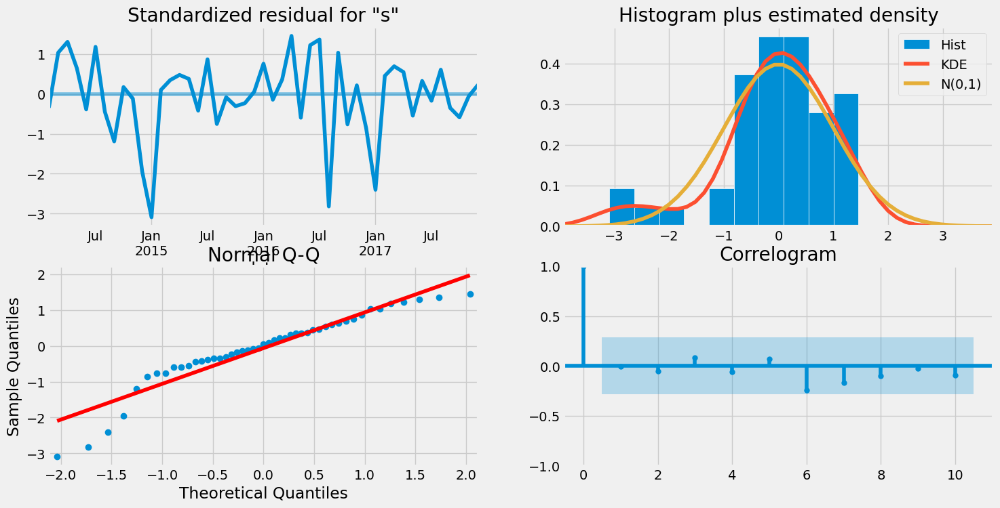

In [84]:
results.plot_diagnostics(figsize=(16,8))
plt.show()

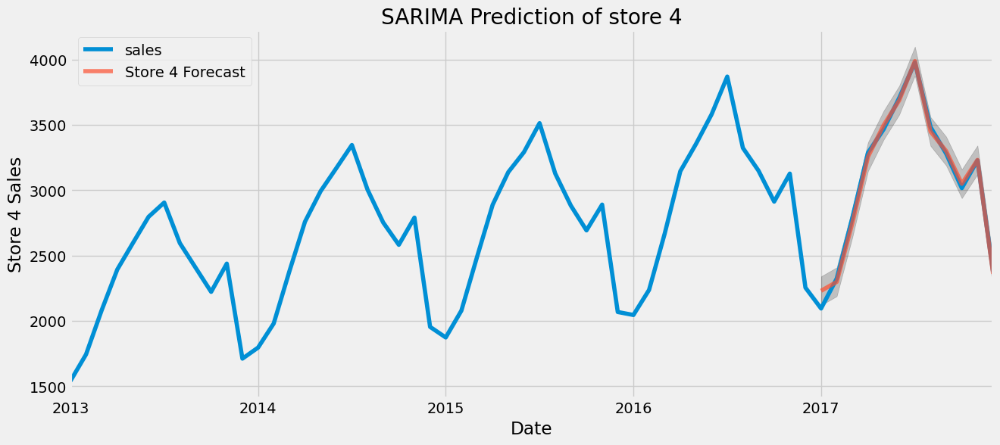

In [85]:
pred4 = results.get_prediction(start=pd.to_datetime('2017-01-01'), dynamic=False)
pred4_ci = pred4.conf_int()

ax = store4_monthly['2013':].plot(label='observed')
pred4.predicted_mean.plot(ax=ax, label='Store 4 Forecast', alpha=.7, figsize=(14, 6))

ax.fill_between(pred4_ci.index, pred4_ci.iloc[:, 0], pred4_ci.iloc[:, 1], color='k', alpha=.2)

plt.title("SARIMA Prediction of store 4")
ax.set_xlabel('Date')
ax.set_ylabel('Store 4 Sales')
plt.legend()
plt.show()

In [86]:
store4_forecasted_sales = pred4.predicted_mean
store4_true_sales = store4_monthly['2017-01-01':]

mse = mean_squared_error(store4_true_sales, store4_forecasted_sales)
print('The Mean Squared Error of forecasts is {}'.format(round(mse, 2)))
print('The Root Mean Squared Error of forecasts is {}'.format(round(np.sqrt(mse), 2)))

The Mean Squared Error of forecasts is 2135.51
The Root Mean Squared Error of forecasts is 46.21


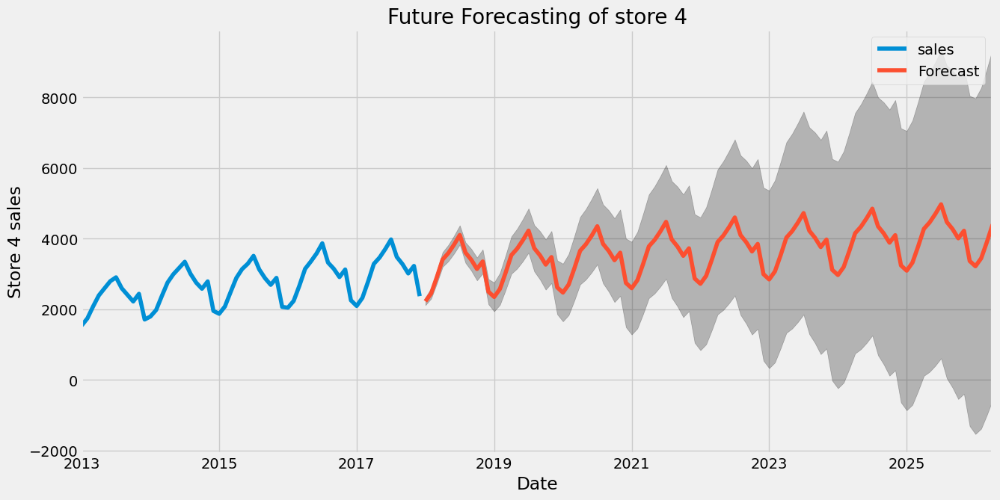

In [87]:
pred4_uc = results.get_forecast(steps=100)
pred4_ci = pred4_uc.conf_int()

ax = store4_monthly.plot(label='observed', figsize=(14, 7))
pred4_uc.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred4_ci.index, pred4_ci.iloc[:, 0], pred4_ci.iloc[:, 1], color='k', alpha=0.25)

plt.title("Future Forecasting of store 4")
ax.set_xlabel('Date')
ax.set_ylabel('Store 4 sales')
plt.legend()
plt.show()

**Store 5**

In [88]:
store5_sales = df[df['store'] == 5]
store5_daily = store5_sales.groupby("date").agg({"sales":"sum"})
store5_monthly = store5_daily.resample(rule='MS').mean()

<AxesSubplot:xlabel='date'>

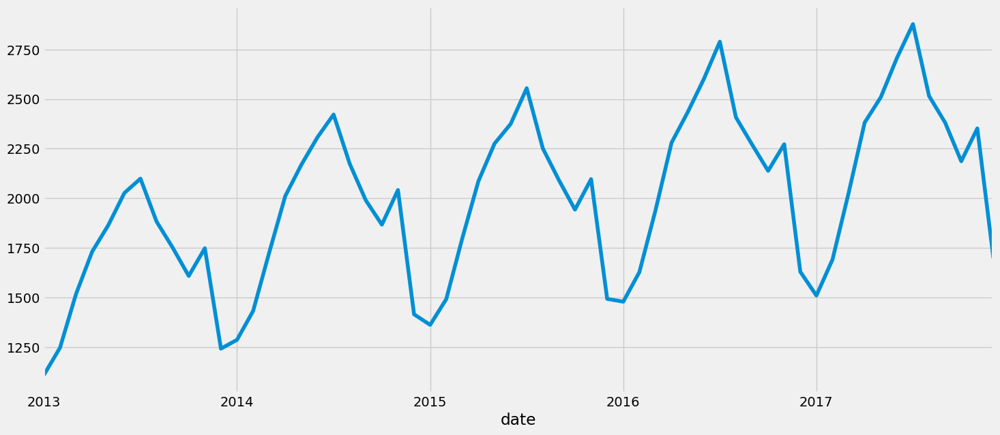

In [89]:
store5_monthly['sales'].plot(figsize=(16,7))

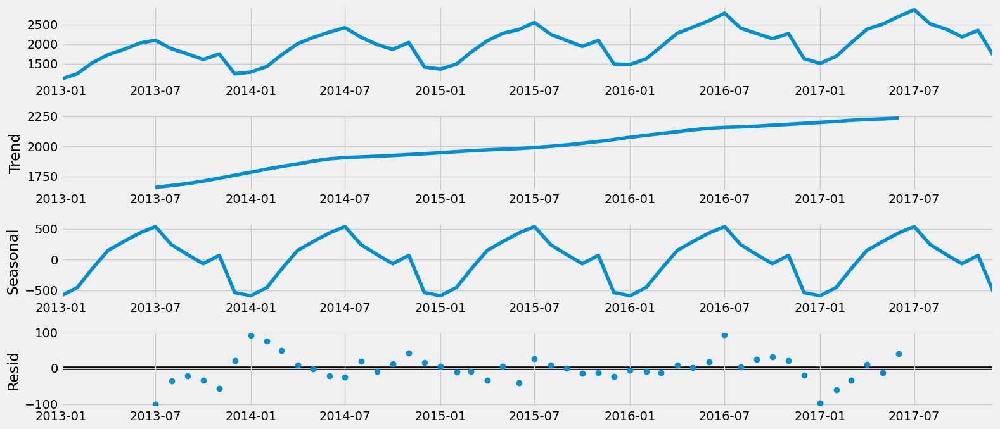

In [90]:
rcParams['figure.figsize'] = 16, 7

decomposition = sm.tsa.seasonal_decompose(store5_monthly, model='additive')
fig = decomposition.plot()
plt.show()

In [91]:
adf_test(store5_monthly['sales'])

ADF Statistics: -5.148333432383084
p-value: 1.1198644934133437e-05
strong evidence against the null hypothesis, reject the null hypothesis. Data has no unit root and is stationary


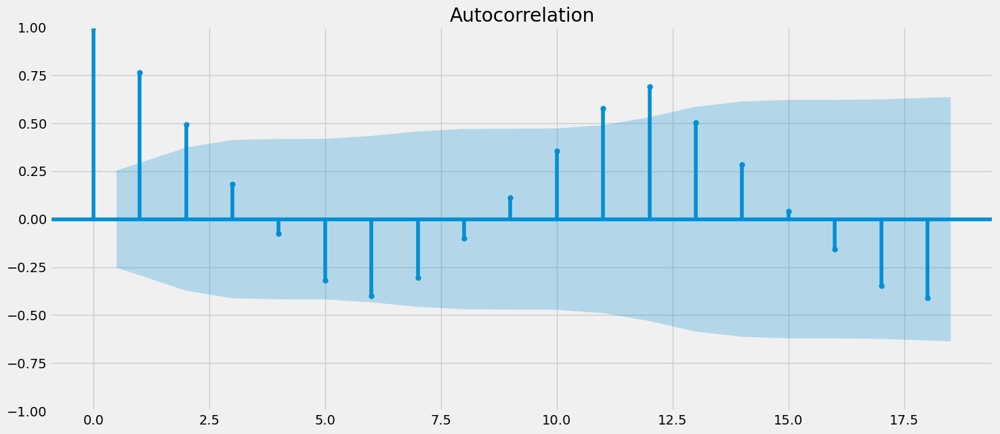

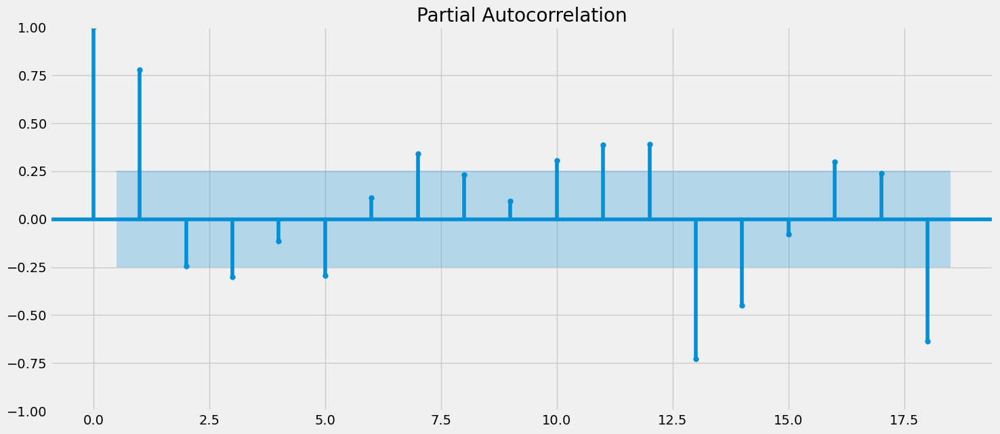

In [92]:
acf = plot_acf(store5_monthly["sales"])
pacf = plot_pacf(store5_monthly["sales"])

In [93]:
p = d = q = range(0,2)
pdq = list(itertools.product(p,d,q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p,d,q))]

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(store5_monthly, order=param,
                                           seasonal_order=param_seasonal,
                                           enforce_stationarity=False,
                                           enforce_invertibility=False)
            results = mod.fit()
            print('SARIMAX{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue

SARIMAX(0, 0, 0)x(0, 0, 0, 12)12 - AIC:1068.825101645112
SARIMAX(0, 0, 0)x(0, 0, 1, 12)12 - AIC:806.0185984760088
SARIMAX(0, 0, 0)x(0, 1, 0, 12)12 - AIC:615.7587981237571


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 0, 0)x(0, 1, 1, 12)12 - AIC:1461.127896629798
SARIMAX(0, 0, 0)x(1, 0, 0, 12)12 - AIC:567.5396617102488
SARIMAX(0, 0, 0)x(1, 0, 1, 12)12 - AIC:541.1762095122097
SARIMAX(0, 0, 0)x(1, 1, 0, 12)12 - AIC:424.93188370995824


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 0, 0)x(1, 1, 1, 12)12 - AIC:1197.2263211226702
SARIMAX(0, 0, 1)x(0, 0, 0, 12)12 - AIC:985.8035860215957
SARIMAX(0, 0, 1)x(0, 0, 1, 12)12 - AIC:741.7675386483381
SARIMAX(0, 0, 1)x(0, 1, 0, 12)12 - AIC:556.474765314278


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 0, 1)x(0, 1, 1, 12)12 - AIC:1393.8164775631053


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 0, 1)x(1, 0, 0, 12)12 - AIC:571.1723008102384
SARIMAX(0, 0, 1)x(1, 0, 1, 12)12 - AIC:506.7084326754751
SARIMAX(0, 0, 1)x(1, 1, 0, 12)12 - AIC:402.17345898945837
SARIMAX(0, 0, 1)x(1, 1, 1, 12)12 - AIC:1353.3855793866464
SARIMAX(0, 1, 0)x(0, 0, 0, 12)12 - AIC:813.6707078832849
SARIMAX(0, 1, 0)x(0, 0, 1, 12)12 - AIC:614.9502045393664
SARIMAX(0, 1, 0)x(0, 1, 0, 12)12 - AIC:481.52977491288414
SARIMAX(0, 1, 0)x(0, 1, 1, 12)12 - AIC:1389.0740018997878
SARIMAX(0, 1, 0)x(1, 0, 0, 12)12 - AIC:486.64713160779223
SARIMAX(0, 1, 0)x(1, 0, 1, 12)12 - AIC:476.82092550871516
SARIMAX(0, 1, 0)x(1, 1, 0, 12)12 - AIC:359.1393834978371


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 0)x(1, 1, 1, 12)12 - AIC:1499.9831543559771
SARIMAX(0, 1, 1)x(0, 0, 0, 12)12 - AIC:800.1921591647653
SARIMAX(0, 1, 1)x(0, 0, 1, 12)12 - AIC:601.9374577032456
SARIMAX(0, 1, 1)x(0, 1, 0, 12)12 - AIC:473.6867211647774


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 1)x(0, 1, 1, 12)12 - AIC:1279.505692361272
SARIMAX(0, 1, 1)x(1, 0, 0, 12)12 - AIC:487.58329233247616


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 1)x(1, 0, 1, 12)12 - AIC:471.88459053525474
SARIMAX(0, 1, 1)x(1, 1, 0, 12)12 - AIC:358.09936887616277


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 1)x(1, 1, 1, 12)12 - AIC:1278.7149946691243
SARIMAX(1, 0, 0)x(0, 0, 0, 12)12 - AIC:828.8419487942765
SARIMAX(1, 0, 0)x(0, 0, 1, 12)12 - AIC:629.8573443095687
SARIMAX(1, 0, 0)x(0, 1, 0, 12)12 - AIC:491.59961328942427


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 0, 0)x(0, 1, 1, 12)12 - AIC:1384.9581686019408
SARIMAX(1, 0, 0)x(1, 0, 0, 12)12 - AIC:485.30817600382954
SARIMAX(1, 0, 0)x(1, 0, 1, 12)12 - AIC:484.2791461023654
SARIMAX(1, 0, 0)x(1, 1, 0, 12)12 - AIC:360.307975947627


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 0, 0)x(1, 1, 1, 12)12 - AIC:1312.0636416772988
SARIMAX(1, 0, 1)x(0, 0, 0, 12)12 - AIC:816.0389355039179
SARIMAX(1, 0, 1)x(0, 0, 1, 12)12 - AIC:618.092072632487
SARIMAX(1, 0, 1)x(0, 1, 0, 12)12 - AIC:484.00661211309847


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 0, 1)x(0, 1, 1, 12)12 - AIC:1311.008159329731
SARIMAX(1, 0, 1)x(1, 0, 0, 12)12 - AIC:486.8680603267266
SARIMAX(1, 0, 1)x(1, 0, 1, 12)12 - AIC:475.1763349089377
SARIMAX(1, 0, 1)x(1, 1, 0, 12)12 - AIC:360.0002370864274


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 0, 1)x(1, 1, 1, 12)12 - AIC:1237.9977354728178
SARIMAX(1, 1, 0)x(0, 0, 0, 12)12 - AIC:813.597923200549
SARIMAX(1, 1, 0)x(0, 0, 1, 12)12 - AIC:615.1079801099444
SARIMAX(1, 1, 0)x(0, 1, 0, 12)12 - AIC:483.40640799918833


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 1, 0)x(0, 1, 1, 12)12 - AIC:1636.3748058419476
SARIMAX(1, 1, 0)x(1, 0, 0, 12)12 - AIC:478.4453010034422
SARIMAX(1, 1, 0)x(1, 0, 1, 12)12 - AIC:475.7213822486527
SARIMAX(1, 1, 0)x(1, 1, 0, 12)12 - AIC:347.8779714247595


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 1, 0)x(1, 1, 1, 12)12 - AIC:1635.5250693082464
SARIMAX(1, 1, 1)x(0, 0, 0, 12)12 - AIC:801.4106174927797
SARIMAX(1, 1, 1)x(0, 0, 1, 12)12 - AIC:603.7755383945279
SARIMAX(1, 1, 1)x(0, 1, 0, 12)12 - AIC:474.9965176459759


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 1, 1)x(0, 1, 1, 12)12 - AIC:1589.2593533321171


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 1, 1)x(1, 0, 0, 12)12 - AIC:480.440421097868
SARIMAX(1, 1, 1)x(1, 0, 1, 12)12 - AIC:468.191560899448
SARIMAX(1, 1, 1)x(1, 1, 0, 12)12 - AIC:349.7999554533213
SARIMAX(1, 1, 1)x(1, 1, 1, 12)12 - AIC:1588.4934179180136


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [94]:
model=SARIMAX(store5_monthly,order=(1,1,0),seasonal_order=(1,1,0,12))
results=model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              sales   No. Observations:                   60
Model:             SARIMAX(1, 1, 0)x(1, 1, 0, 12)   Log Likelihood                -244.315
Date:                            Fri, 09 Jun 2023   AIC                            494.630
Time:                                    18:24:46   BIC                            500.180
Sample:                                01-01-2013   HQIC                           496.719
                                     - 12-01-2017                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0678      0.125     -0.541      0.589      -0.314       0.178
ar.S.L12      -0.0922      0.220     -0.419      0.675      -0.523       0.339
sigma2      1910.9572    369.162      5.176      0.000    1187.413    2634.502
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                 5.20
Prob(Q):                              0.95   Prob(JB):                         0.07
Heteroskedasticity (H):               0.54   Skew:                            -0.80
Prob(H) (two-sided):                  0.22   Kurtosis:                         3.33
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

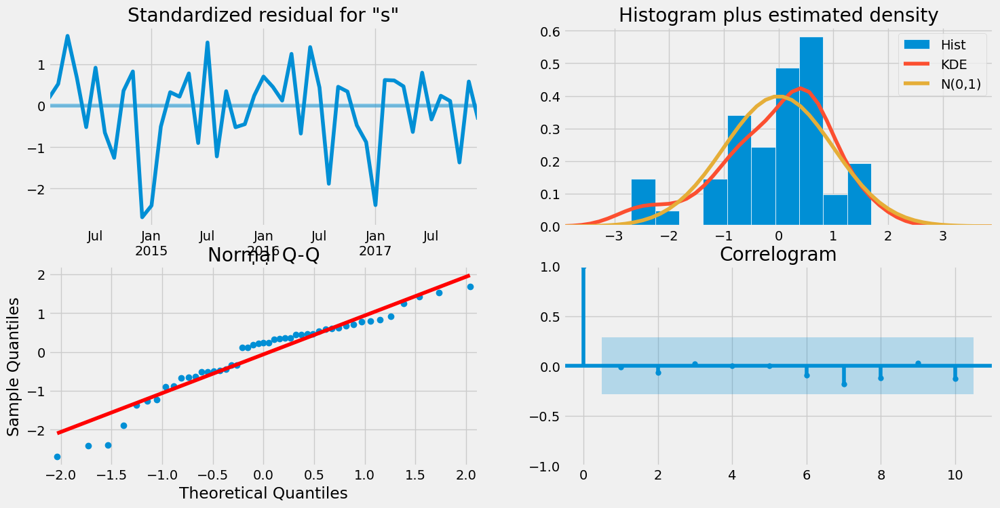

In [95]:
results.plot_diagnostics(figsize=(16,8))
plt.show()

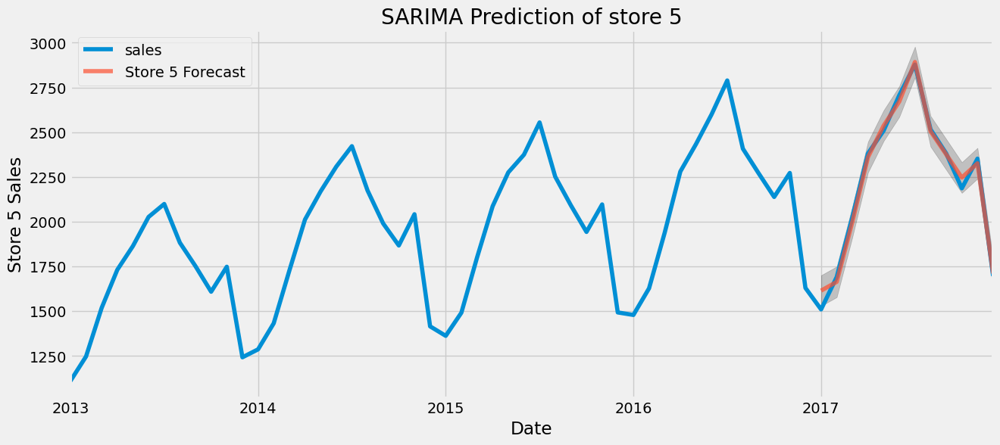

In [96]:
pred5 = results.get_prediction(start=pd.to_datetime('2017-01-01'), dynamic=False)
pred5_ci = pred5.conf_int()

ax = store5_monthly['2013':].plot(label='observed')
pred5.predicted_mean.plot(ax=ax, label='Store 5 Forecast', alpha=.7, figsize=(14, 6))

ax.fill_between(pred5_ci.index, pred5_ci.iloc[:, 0], pred5_ci.iloc[:, 1], color='k', alpha=.2)

plt.title("SARIMA Prediction of store 5")
ax.set_xlabel('Date')
ax.set_ylabel('Store 5 Sales')
plt.legend()
plt.show()

In [97]:
store5_forecasted_sales = pred5.predicted_mean
store5_true_sales = store5_monthly['2017-01-01':]

mse = mean_squared_error(store5_true_sales, store5_forecasted_sales)
print('The Mean Squared Error of forecasts is {}'.format(round(mse, 2)))
print('The Root Mean Squared Error of forecasts is {}'.format(round(np.sqrt(mse), 2)))

The Mean Squared Error of forecasts is 1638.28
The Root Mean Squared Error of forecasts is 40.48


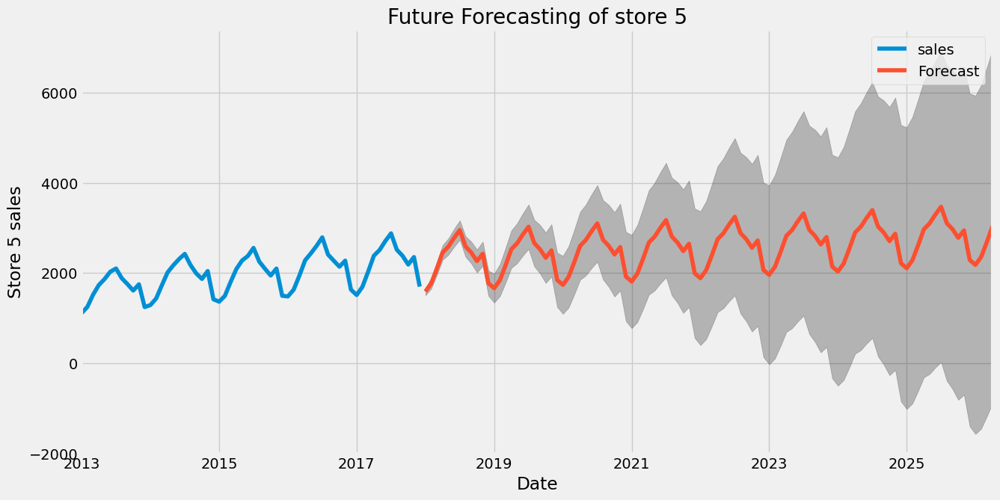

In [98]:
pred5_uc = results.get_forecast(steps=100)
pred5_ci = pred5_uc.conf_int()

ax = store5_monthly.plot(label='observed', figsize=(14, 7))
pred5_uc.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred5_ci.index,
                pred5_ci.iloc[:, 0],
                pred5_ci.iloc[:, 1],
                color='k',
                alpha=0.25)

plt.title("Future Forecasting of store 5")
ax.set_xlabel('Date')
ax.set_ylabel('Store 5 sales')
plt.legend()
plt.show()

**Store 6**

In [99]:
store6_sales = df[df['store'] == 6]
store6_daily = store6_sales.groupby("date").agg({"sales":"sum"})
store6_monthly = store6_daily.resample(rule='MS').mean()

<AxesSubplot:xlabel='date'>

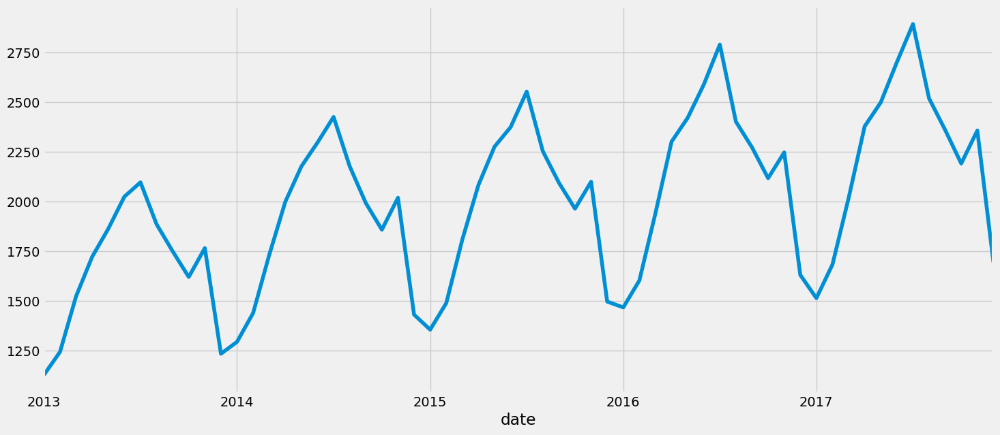

In [100]:
store6_monthly['sales'].plot(figsize=(16,7))

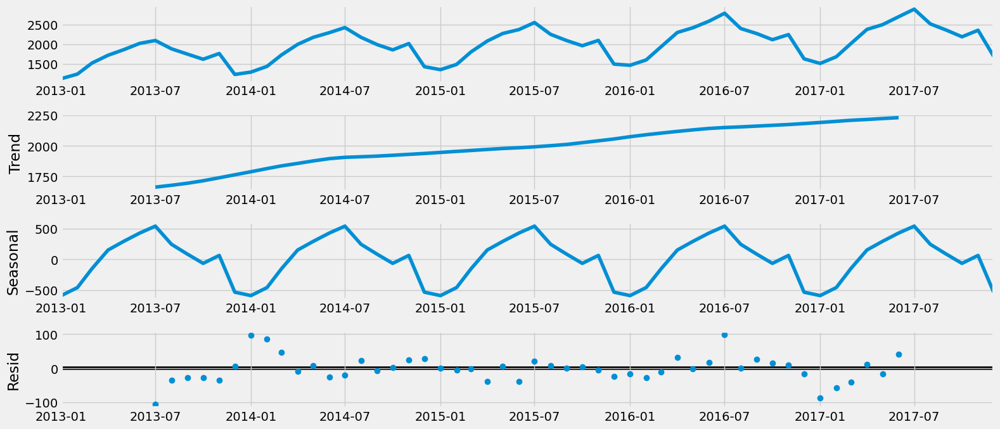

In [101]:
rcParams['figure.figsize'] = 16, 7

decomposition = sm.tsa.seasonal_decompose(store6_monthly, model='additive')
fig = decomposition.plot()
plt.show()

In [102]:
adf_test(store6_monthly['sales'])

ADF Statistics: -5.50111083328477
p-value: 2.070311628958977e-06
strong evidence against the null hypothesis, reject the null hypothesis. Data has no unit root and is stationary


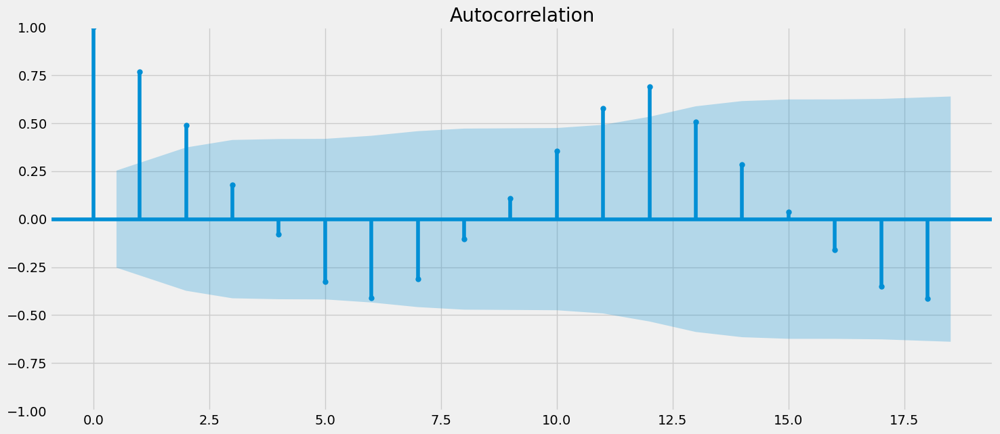

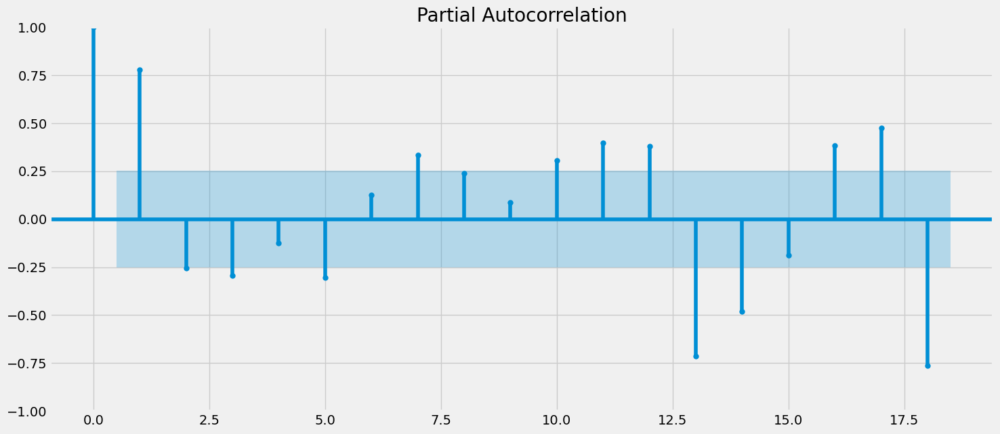

In [103]:
acf = plot_acf(store6_monthly["sales"])
pacf = plot_pacf(store6_monthly["sales"])

In [104]:
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(store6_monthly, order=param,
                                           seasonal_order=param_seasonal,
                                           enforce_stationarity=False,
                                           enforce_invertibility=False)
            results = mod.fit()
            print('SARIMAX{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue

SARIMAX(0, 0, 0)x(0, 0, 0, 12)12 - AIC:1068.688026233496
SARIMAX(0, 0, 0)x(0, 0, 1, 12)12 - AIC:805.9803642501877
SARIMAX(0, 0, 0)x(0, 1, 0, 12)12 - AIC:614.3793419364433


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 0, 0)x(0, 1, 1, 12)12 - AIC:1443.1562063771705
SARIMAX(0, 0, 0)x(1, 0, 0, 12)12 - AIC:563.1695829430407
SARIMAX(0, 0, 0)x(1, 0, 1, 12)12 - AIC:540.3035924463974
SARIMAX(0, 0, 0)x(1, 1, 0, 12)12 - AIC:418.6993771839646
SARIMAX(0, 0, 0)x(1, 1, 1, 12)12 - AIC:395.39825399466844
SARIMAX(0, 0, 1)x(0, 0, 0, 12)12 - AIC:985.659373710387
SARIMAX(0, 0, 1)x(0, 0, 1, 12)12 - AIC:741.5760477218531
SARIMAX(0, 0, 1)x(0, 1, 0, 12)12 - AIC:551.860748297829


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 0, 1)x(0, 1, 1, 12)12 - AIC:1456.8683337481261
SARIMAX(0, 0, 1)x(1, 0, 0, 12)12 - AIC:530.1188365632242
SARIMAX(0, 0, 1)x(1, 0, 1, 12)12 - AIC:507.7028550707742
SARIMAX(0, 0, 1)x(1, 1, 0, 12)12 - AIC:396.6507495139655
SARIMAX(0, 0, 1)x(1, 1, 1, 12)12 - AIC:366.9986591466579
SARIMAX(0, 1, 0)x(0, 0, 0, 12)12 - AIC:813.4388132859677
SARIMAX(0, 1, 0)x(0, 0, 1, 12)12 - AIC:614.2430874972132
SARIMAX(0, 1, 0)x(0, 1, 0, 12)12 - AIC:481.1946809482322


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 0)x(0, 1, 1, 12)12 - AIC:1555.3133046582411
SARIMAX(0, 1, 0)x(1, 0, 0, 12)12 - AIC:486.53868357557764
SARIMAX(0, 1, 0)x(1, 0, 1, 12)12 - AIC:477.76028155138084
SARIMAX(0, 1, 0)x(1, 1, 0, 12)12 - AIC:359.7607863503345
SARIMAX(0, 1, 0)x(1, 1, 1, 12)12 - AIC:352.46954248249983
SARIMAX(0, 1, 1)x(0, 0, 0, 12)12 - AIC:799.7545718959551
SARIMAX(0, 1, 1)x(0, 0, 1, 12)12 - AIC:601.0799642110595
SARIMAX(0, 1, 1)x(0, 1, 0, 12)12 - AIC:472.24810792570554


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 1)x(0, 1, 1, 12)12 - AIC:1551.9648313715336
SARIMAX(0, 1, 1)x(1, 0, 0, 12)12 - AIC:484.3281842003103
SARIMAX(0, 1, 1)x(1, 0, 1, 12)12 - AIC:464.9623610766266
SARIMAX(0, 1, 1)x(1, 1, 0, 12)12 - AIC:356.96203732981314
SARIMAX(0, 1, 1)x(1, 1, 1, 12)12 - AIC:337.92702655030155
SARIMAX(1, 0, 0)x(0, 0, 0, 12)12 - AIC:828.5259233653574
SARIMAX(1, 0, 0)x(0, 0, 1, 12)12 - AIC:629.140693902681
SARIMAX(1, 0, 0)x(0, 1, 0, 12)12 - AIC:491.69140606802523


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 0, 0)x(0, 1, 1, 12)12 - AIC:1440.4332143698994
SARIMAX(1, 0, 0)x(1, 0, 0, 12)12 - AIC:485.0857296311379
SARIMAX(1, 0, 0)x(1, 0, 1, 12)12 - AIC:485.5882931672543
SARIMAX(1, 0, 0)x(1, 1, 0, 12)12 - AIC:360.7708417833521
SARIMAX(1, 0, 0)x(1, 1, 1, 12)12 - AIC:362.77047547912724
SARIMAX(1, 0, 1)x(0, 0, 0, 12)12 - AIC:815.6637367127976
SARIMAX(1, 0, 1)x(0, 0, 1, 12)12 - AIC:617.2054369688542
SARIMAX(1, 0, 1)x(0, 1, 0, 12)12 - AIC:482.42246119269015


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 0, 1)x(0, 1, 1, 12)12 - AIC:1545.503738510427
SARIMAX(1, 0, 1)x(1, 0, 0, 12)12 - AIC:484.0847845130489
SARIMAX(1, 0, 1)x(1, 0, 1, 12)12 - AIC:473.8013379858952
SARIMAX(1, 0, 1)x(1, 1, 0, 12)12 - AIC:357.01981772432197
SARIMAX(1, 0, 1)x(1, 1, 1, 12)12 - AIC:348.2589775240385
SARIMAX(1, 1, 0)x(0, 0, 0, 12)12 - AIC:813.2253309170321
SARIMAX(1, 1, 0)x(0, 0, 1, 12)12 - AIC:614.1698065755726
SARIMAX(1, 1, 0)x(0, 1, 0, 12)12 - AIC:481.79033724810876


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 1, 0)x(0, 1, 1, 12)12 - AIC:1481.3824679122195
SARIMAX(1, 1, 0)x(1, 0, 0, 12)12 - AIC:474.4805498366374


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 1, 0)x(1, 0, 1, 12)12 - AIC:477.51699603966347
SARIMAX(1, 1, 0)x(1, 1, 0, 12)12 - AIC:344.7403472761679
SARIMAX(1, 1, 0)x(1, 1, 1, 12)12 - AIC:346.34325066096164
SARIMAX(1, 1, 1)x(0, 0, 0, 12)12 - AIC:801.0084804123809
SARIMAX(1, 1, 1)x(0, 0, 1, 12)12 - AIC:602.9207834386442
SARIMAX(1, 1, 1)x(0, 1, 0, 12)12 - AIC:474.20542849270345


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 1, 1)x(0, 1, 1, 12)12 - AIC:1614.5702882750857
SARIMAX(1, 1, 1)x(1, 0, 0, 12)12 - AIC:476.33056254618066


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 1, 1)x(1, 0, 1, 12)12 - AIC:466.6235688792296
SARIMAX(1, 1, 1)x(1, 1, 0, 12)12 - AIC:345.9331042113319
SARIMAX(1, 1, 1)x(1, 1, 1, 12)12 - AIC:336.1823621963839


In [105]:
model=SARIMAX(store6_monthly,order=(1,1,0),seasonal_order=(1,1,0,12))
results=model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              sales   No. Observations:                   60
Model:             SARIMAX(1, 1, 0)x(1, 1, 0, 12)   Log Likelihood                -243.797
Date:                            Fri, 09 Jun 2023   AIC                            493.595
Time:                                    18:25:11   BIC                            499.145
Sample:                                01-01-2013   HQIC                           495.683
                                     - 12-01-2017                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1729      0.158     -1.095      0.274      -0.483       0.137
ar.S.L12       0.0327      0.185      0.177      0.859      -0.330       0.395
sigma2      1874.3245    339.380      5.523      0.000    1209.153    2539.496
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                 7.01
Prob(Q):                              0.93   Prob(JB):                         0.03
Heteroskedasticity (H):               0.35   Skew:                            -0.72
Prob(H) (two-sided):                  0.04   Kurtosis:                         4.23
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

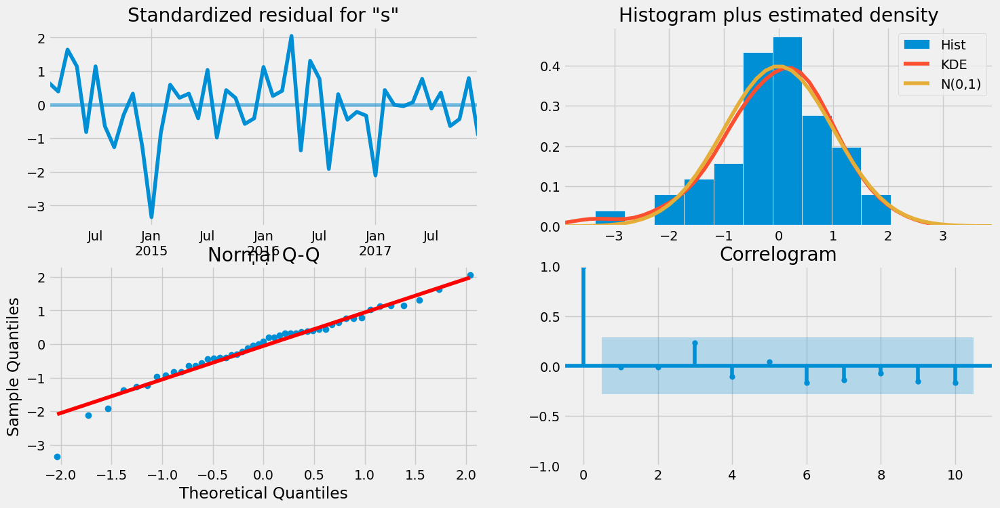

In [106]:
results.plot_diagnostics(figsize=(16,8))
plt.show()

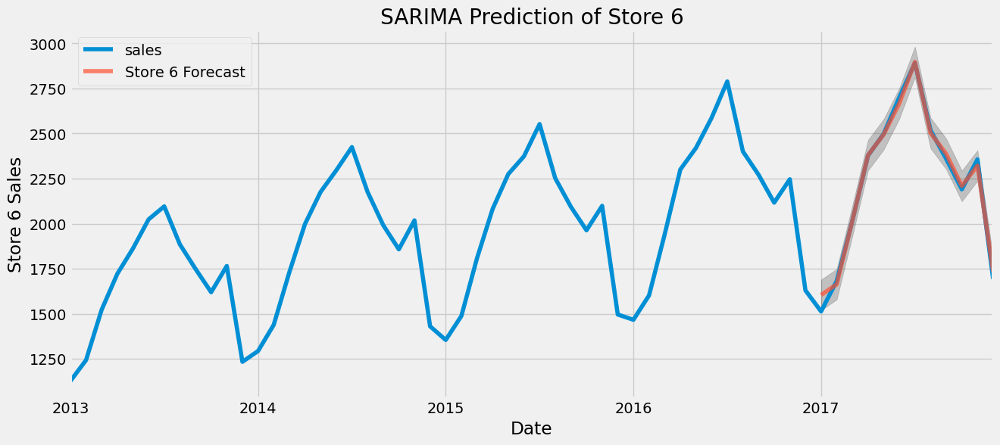

In [107]:
pred6 = results.get_prediction(start=pd.to_datetime('2017-01-01'), dynamic=False)
pred6_ci = pred6.conf_int()

ax = store6_monthly['2013':].plot(label='observed')
pred6.predicted_mean.plot(ax=ax, label='Store 6 Forecast', alpha=0.7, figsize=(14, 6))

ax.fill_between(pred6_ci.index,
                pred6_ci.iloc[:, 0],
                pred6_ci.iloc[:, 1], color='k', alpha=0.2)

plt.title("SARIMA Prediction of Store 6")
ax.set_xlabel('Date')
ax.set_ylabel('Store 6 Sales')
plt.legend()
plt.show()

In [108]:
store6_forecasted_sales = pred6.predicted_mean
store6_true_sales = store6_monthly['2017-01-01':]

mse = mean_squared_error(store6_true_sales,store6_forecasted_sales)
print('The Mean Squared Error of forecasts is {}'.format(round(mse, 2)))
print('The Root Mean Squared Error of forecasts is {}'.format(round(np.sqrt(mse), 2)))

The Mean Squared Error of forecasts is 1161.73
The Root Mean Squared Error of forecasts is 34.08


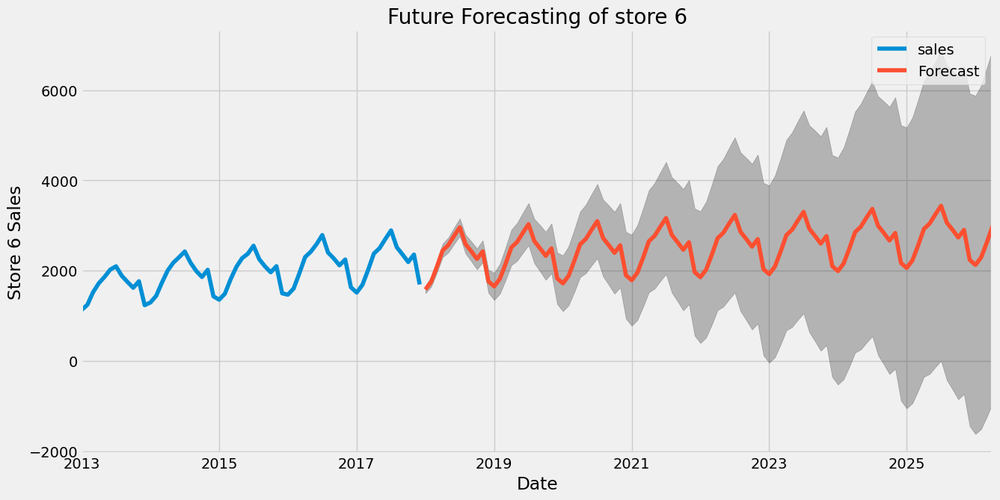

In [109]:
pred6_uc = results.get_forecast(steps=100)
pred6_ci = pred6_uc.conf_int()

ax = store6_monthly.plot(label='observed', figsize=(14, 7))
pred6_uc.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred6_ci.index,
                pred6_ci.iloc[:, 0],
                pred6_ci.iloc[:, 1],
                color='k',
                alpha=0.25)

plt.title("Future Forecasting of store 6")
ax.set_xlabel('Date')
ax.set_ylabel('Store 6 Sales')
plt.legend()
plt.show()

**Store 7**

In [110]:
store7_sales = df[df['store'] == 7]
store7_daily = store7_sales.groupby("date").agg({"sales":"sum"})
store7_monthly = store7_daily.resample(rule='MS').mean()

<AxesSubplot:xlabel='date'>

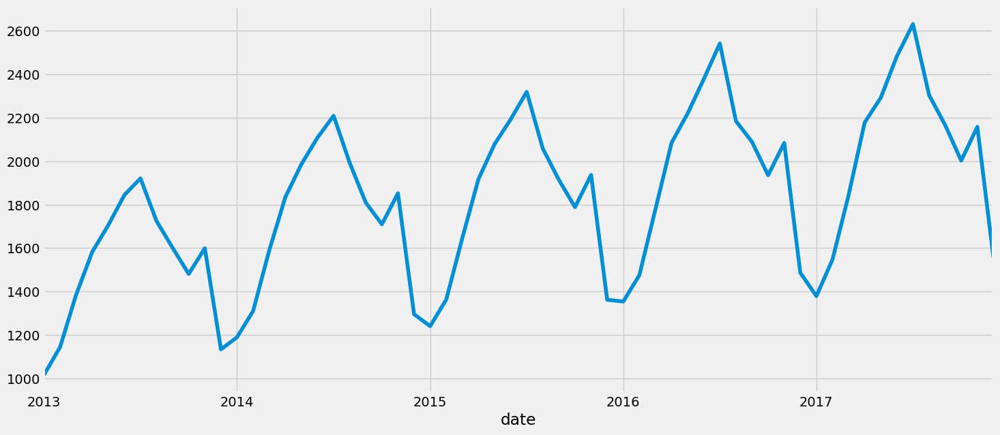

In [111]:
store7_monthly['sales'].plot(figsize=(16,7))

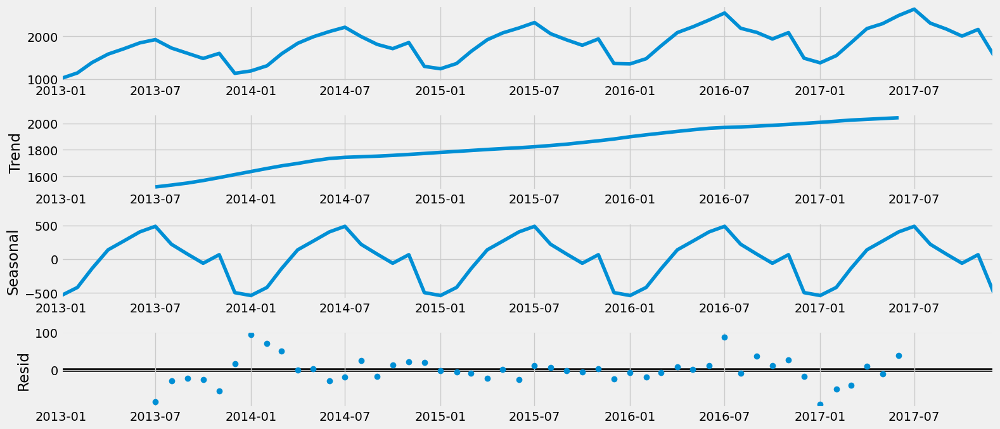

In [112]:
rcParams['figure.figsize'] = 16, 7

decomposition = sm.tsa.seasonal_decompose(store7_monthly, model='additive')
fig = decomposition.plot()
plt.show()

In [113]:
adf_test(store7_monthly['sales'])

ADF Statistics: -5.5767937189954955
p-value: 1.4261058275741226e-06
strong evidence against the null hypothesis, reject the null hypothesis. Data has no unit root and is stationary


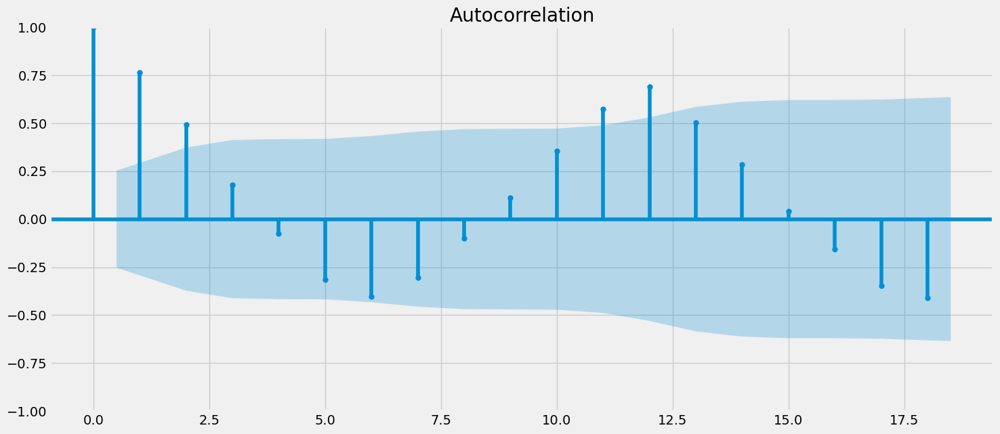

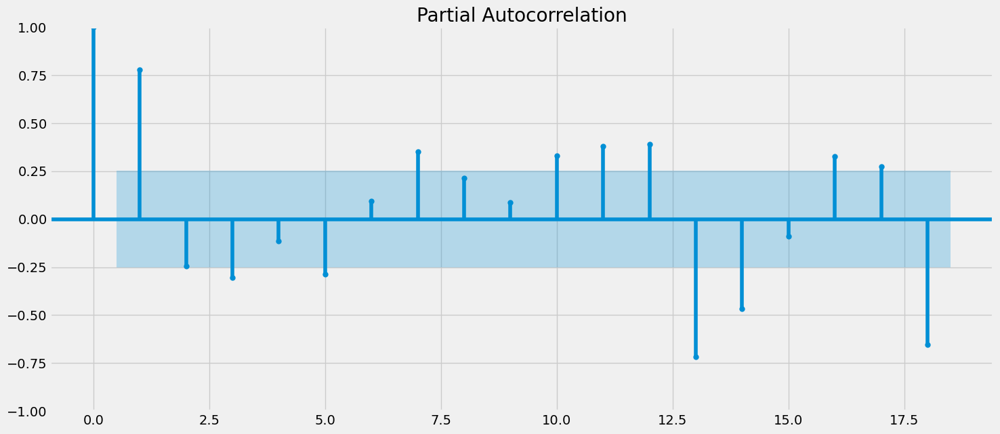

In [114]:
acf = plot_acf(store7_monthly["sales"])
pacf = plot_pacf(store7_monthly["sales"])

In [115]:
# Define the SARIMA model parameters
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

# Find the optimal model parameters with the lowest AIC
best_aic = float('inf')
best_params = None
best_seasonal_params = None

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(store7_monthly, order=param,
                                           seasonal_order=param_seasonal,
                                           enforce_stationarity=False,
                                           enforce_invertibility=False)
            results = mod.fit()
            if results.aic < best_aic:
                best_aic = results.aic
                best_params = param
                best_seasonal_params = param_seasonal
            print('SARIMAX{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue

SARIMAX(0, 0, 0)x(0, 0, 0, 12)12 - AIC:1058.2477535909243
SARIMAX(0, 0, 0)x(0, 0, 1, 12)12 - AIC:798.5132035043619
SARIMAX(0, 0, 0)x(0, 1, 0, 12)12 - AIC:606.3490562585255


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 0, 0)x(0, 1, 1, 12)12 - AIC:1390.427239908643
SARIMAX(0, 0, 0)x(1, 0, 0, 12)12 - AIC:555.3619496672654
SARIMAX(0, 0, 0)x(1, 0, 1, 12)12 - AIC:530.3334111720676
SARIMAX(0, 0, 0)x(1, 1, 0, 12)12 - AIC:412.69518436317685
SARIMAX(0, 0, 0)x(1, 1, 1, 12)12 - AIC:389.05066534021216
SARIMAX(0, 0, 1)x(0, 0, 0, 12)12 - AIC:975.462583737542


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 0, 1)x(0, 0, 1, 12)12 - AIC:782.9043138425553
SARIMAX(0, 0, 1)x(0, 1, 0, 12)12 - AIC:548.8912482034198


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 0, 1)x(0, 1, 1, 12)12 - AIC:1453.42774265265


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 0, 1)x(1, 0, 0, 12)12 - AIC:559.3847650750486


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 0, 1)x(1, 0, 1, 12)12 - AIC:508.53958241419866
SARIMAX(0, 0, 1)x(1, 1, 0, 12)12 - AIC:394.9952509065476
SARIMAX(0, 0, 1)x(1, 1, 1, 12)12 - AIC:364.95123564529666
SARIMAX(0, 1, 0)x(0, 0, 0, 12)12 - AIC:803.3957356886018


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 0)x(0, 0, 1, 12)12 - AIC:644.3352595469859
SARIMAX(0, 1, 0)x(0, 1, 0, 12)12 - AIC:472.81041996639874


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 0)x(0, 1, 1, 12)12 - AIC:1313.3082203816145
SARIMAX(0, 1, 0)x(1, 0, 0, 12)12 - AIC:477.4139199071655
SARIMAX(0, 1, 0)x(1, 0, 1, 12)12 - AIC:467.60884910545593
SARIMAX(0, 1, 0)x(1, 1, 0, 12)12 - AIC:353.2812829446149


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 0)x(1, 1, 1, 12)12 - AIC:1515.76337635002
SARIMAX(0, 1, 1)x(0, 0, 0, 12)12 - AIC:790.2095093528943


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 1)x(0, 0, 1, 12)12 - AIC:631.3507147292524
SARIMAX(0, 1, 1)x(0, 1, 0, 12)12 - AIC:463.8515744815072


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 1)x(0, 1, 1, 12)12 - AIC:1136.1671706174454
SARIMAX(0, 1, 1)x(1, 0, 0, 12)12 - AIC:476.301640256611


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 1)x(1, 0, 1, 12)12 - AIC:460.7082308986091
SARIMAX(0, 1, 1)x(1, 1, 0, 12)12 - AIC:349.6717600848574


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 1)x(1, 1, 1, 12)12 - AIC:1132.6907612979594
SARIMAX(1, 0, 0)x(0, 0, 0, 12)12 - AIC:818.3973941201033
SARIMAX(1, 0, 0)x(0, 0, 1, 12)12 - AIC:621.2709782019369
SARIMAX(1, 0, 0)x(0, 1, 0, 12)12 - AIC:482.58104615425015


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 0, 0)x(0, 1, 1, 12)12 - AIC:1606.0305144819022
SARIMAX(1, 0, 0)x(1, 0, 0, 12)12 - AIC:475.57245149212173
SARIMAX(1, 0, 0)x(1, 0, 1, 12)12 - AIC:474.67290508348754
SARIMAX(1, 0, 0)x(1, 1, 0, 12)12 - AIC:354.4811494236301
SARIMAX(1, 0, 0)x(1, 1, 1, 12)12 - AIC:356.48114942327067
SARIMAX(1, 0, 1)x(0, 0, 0, 12)12 - AIC:805.8205135085725
SARIMAX(1, 0, 1)x(0, 0, 1, 12)12 - AIC:609.7232485053121
SARIMAX(1, 0, 1)x(0, 1, 0, 12)12 - AIC:474.6070802151925


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 0, 1)x(0, 1, 1, 12)12 - AIC:1438.3811610136418
SARIMAX(1, 0, 1)x(1, 0, 0, 12)12 - AIC:475.5869558655557
SARIMAX(1, 0, 1)x(1, 0, 1, 12)12 - AIC:464.905289602035
SARIMAX(1, 0, 1)x(1, 1, 0, 12)12 - AIC:350.83637893005
SARIMAX(1, 0, 1)x(1, 1, 1, 12)12 - AIC:343.0566713026808
SARIMAX(1, 1, 0)x(0, 0, 0, 12)12 - AIC:803.4008975720799


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 1, 0)x(0, 0, 1, 12)12 - AIC:644.7864592752732
SARIMAX(1, 1, 0)x(0, 1, 0, 12)12 - AIC:473.8662868400109


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 1, 0)x(0, 1, 1, 12)12 - AIC:1165.0014183045266
SARIMAX(1, 1, 0)x(1, 0, 0, 12)12 - AIC:466.69098007941864


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 1, 0)x(1, 0, 1, 12)12 - AIC:469.79060745452404
SARIMAX(1, 1, 0)x(1, 1, 0, 12)12 - AIC:338.09374485294916


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 1, 0)x(1, 1, 1, 12)12 - AIC:1169.1669495589445
SARIMAX(1, 1, 1)x(0, 0, 0, 12)12 - AIC:791.4532540551884


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 1, 1)x(0, 0, 1, 12)12 - AIC:631.7901911902129
SARIMAX(1, 1, 1)x(0, 1, 0, 12)12 - AIC:465.8286578410822


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 1, 1)x(0, 1, 1, 12)12 - AIC:1274.6563992087395
SARIMAX(1, 1, 1)x(1, 0, 0, 12)12 - AIC:468.687437037815


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 1, 1)x(1, 0, 1, 12)12 - AIC:464.28124299088773
SARIMAX(1, 1, 1)x(1, 1, 0, 12)12 - AIC:340.07501601550405
SARIMAX(1, 1, 1)x(1, 1, 1, 12)12 - AIC:1275.3350083024693


In [116]:
model=SARIMAX(store7_monthly,order=(1,1,0),seasonal_order=(1,1,0,12))
results=model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              sales   No. Observations:                   60
Model:             SARIMAX(1, 1, 0)x(1, 1, 0, 12)   Log Likelihood                -239.551
Date:                            Fri, 09 Jun 2023   AIC                            485.101
Time:                                    18:25:36   BIC                            490.652
Sample:                                01-01-2013   HQIC                           487.190
                                     - 12-01-2017                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1399      0.132     -1.059      0.290      -0.399       0.119
ar.S.L12      -0.0257      0.173     -0.149      0.882      -0.364       0.313
sigma2      1563.9226    286.865      5.452      0.000    1001.677    2126.168
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                14.16
Prob(Q):                              0.96   Prob(JB):                         0.00
Heteroskedasticity (H):               0.52   Skew:                            -1.20
Prob(H) (two-sided):                  0.20   Kurtosis:                         4.22
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

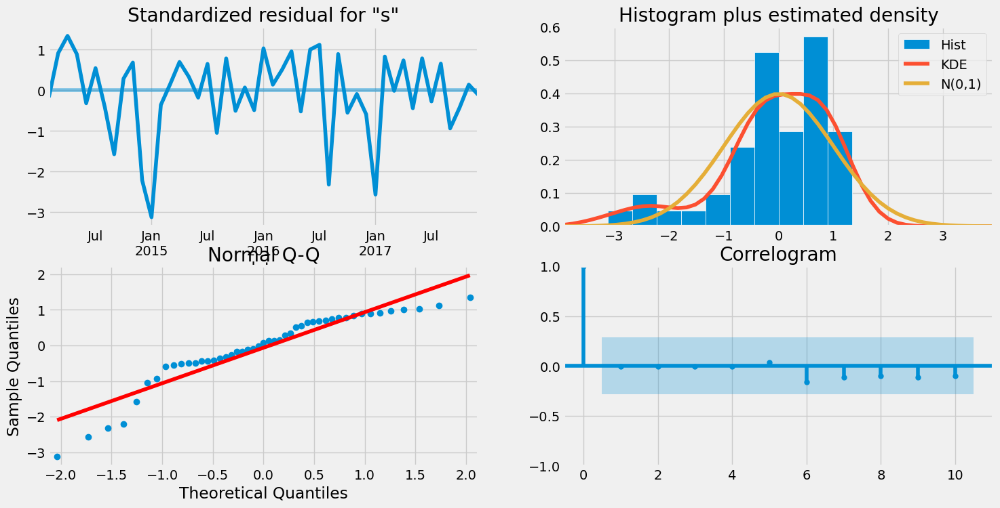

In [117]:
results.plot_diagnostics(figsize=(16,8))
plt.show()

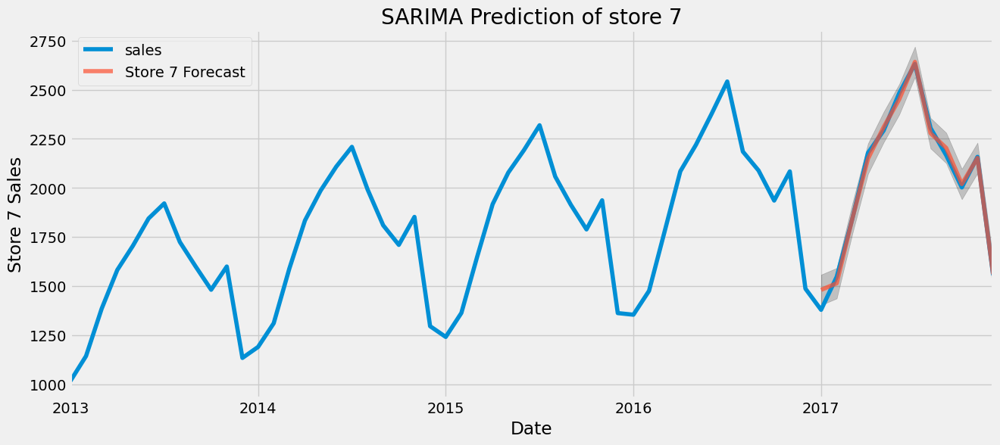

In [118]:
pred7 = results.get_prediction(start=pd.to_datetime('2017-01-01'), dynamic=False)
pred7_ci = pred7.conf_int()

# Plot the in-sample prediction
ax = store7_monthly['2013':].plot(label='observed')
pred7.predicted_mean.plot(ax=ax, label='Store 7 Forecast', alpha=0.7, figsize=(14, 6))

ax.fill_between(pred7_ci.index,
                pred7_ci.iloc[:, 0],
                pred7_ci.iloc[:, 1], color='k', alpha=0.2)

plt.title("SARIMA Prediction of store 7")
ax.set_xlabel('Date')
ax.set_ylabel('Store 7 Sales')
plt.legend()
plt.show()

In [119]:
store7_forecasted_sales = pred7.predicted_mean
store7_true_sales = store7_monthly['2017-01-01':]

print('The Mean Squared Error of the forecasts is {}'.format(round(mse, 2)))
print('The Root Mean Squared Error of the forecasts is {}'.format(round(np.sqrt(mse), 2)))

The Mean Squared Error of the forecasts is 1161.73
The Root Mean Squared Error of the forecasts is 34.08


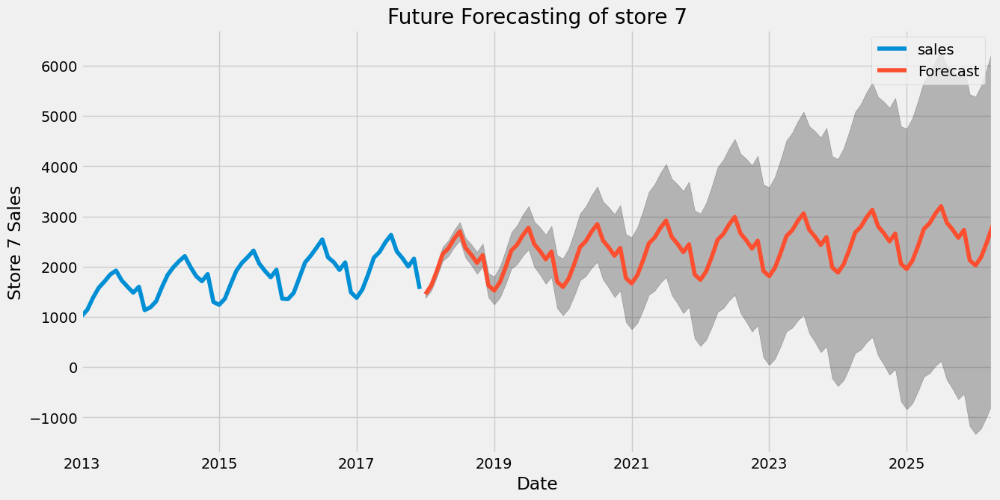

In [120]:
pred7_uc = results.get_forecast(steps=100)
pred7_ci = pred7_uc.conf_int()

ax = store7_monthly.plot(label='observed', figsize=(14, 7))
pred7_uc.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred7_ci.index,
                pred7_ci.iloc[:, 0],
                pred7_ci.iloc[:, 1],
                color='k',
                alpha=0.25)

plt.title("Future Forecasting of store 7")
ax.set_xlabel('Date')
ax.set_ylabel('Store 7 Sales')
plt.legend()
plt.show()

**Store 8**

In [121]:
store8_sales = df[df['store'] == 8]
store8_daily = store8_sales.groupby("date").agg({"sales":"sum"})
store8_monthly = store8_daily.resample(rule='MS').mean()

<AxesSubplot:xlabel='date'>

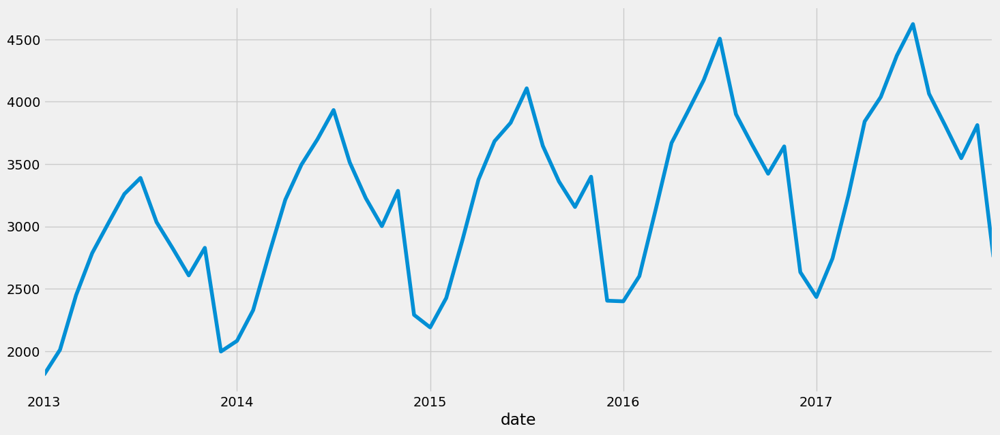

In [122]:
store8_monthly['sales'].plot(figsize=(16,7))

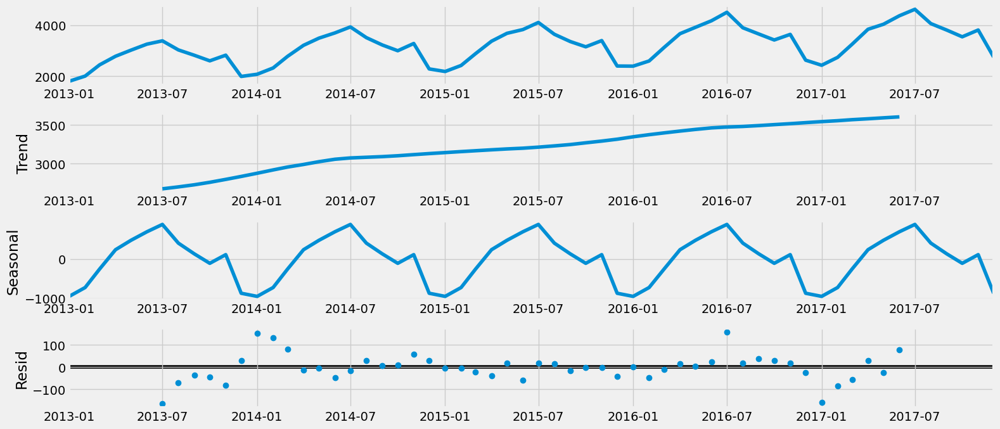

In [123]:
rcParams['figure.figsize'] = 16, 7

decomposition = sm.tsa.seasonal_decompose(store8_monthly, model='additive')
fig = decomposition.plot()
plt.show()

In [124]:
adf_test(store8_monthly['sales'])

ADF Statistics: -5.323105157184495
p-value: 4.90340214740851e-06
strong evidence against the null hypothesis, reject the null hypothesis. Data has no unit root and is stationary


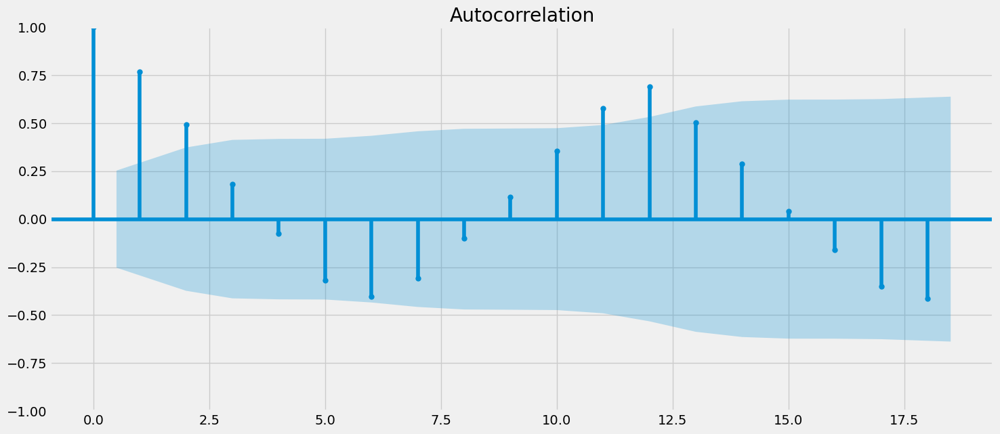

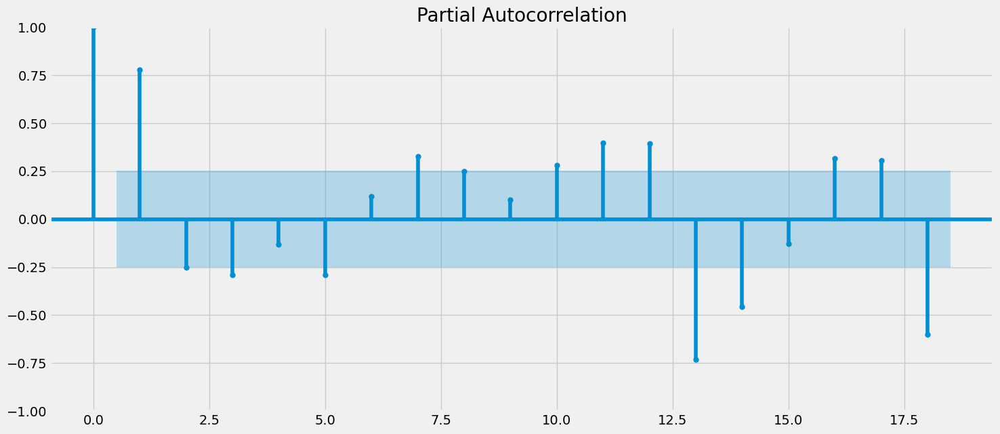

In [125]:
acf = plot_acf(store8_monthly["sales"])
pacf = plot_pacf(store8_monthly["sales"])

In [126]:
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(store8_monthly, order=param,
                                           seasonal_order=param_seasonal,
                                           enforce_stationarity=False,
                                           enforce_invertibility=False)
            results = mod.fit()
            print('SARIMAX{}x{}12 - AIC: {}'.format(param, param_seasonal, results.aic))
        except:
            continue

SARIMAX(0, 0, 0)x(0, 0, 0, 12)12 - AIC: 1125.2020165448444
SARIMAX(0, 0, 0)x(0, 0, 1, 12)12 - AIC: 849.1135622281996
SARIMAX(0, 0, 0)x(0, 1, 0, 12)12 - AIC: 659.943618620823


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 0, 0)x(0, 1, 1, 12)12 - AIC: 1542.6043287967748
SARIMAX(0, 0, 0)x(1, 0, 0, 12)12 - AIC: 610.5873694439392
SARIMAX(0, 0, 0)x(1, 0, 1, 12)12 - AIC: 589.5169857254565
SARIMAX(0, 0, 0)x(1, 1, 0, 12)12 - AIC: 455.2972874520305
SARIMAX(0, 0, 0)x(1, 1, 1, 12)12 - AIC: 432.1807678455728
SARIMAX(0, 0, 1)x(0, 0, 0, 12)12 - AIC: 1040.299570646703


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 0, 1)x(0, 0, 1, 12)12 - AIC: 786.5421023925642
SARIMAX(0, 0, 1)x(0, 1, 0, 12)12 - AIC: 600.9013610652883


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 0, 1)x(0, 1, 1, 12)12 - AIC: 1399.1336637515383
SARIMAX(0, 0, 1)x(1, 0, 0, 12)12 - AIC: 580.9931103192994
SARIMAX(0, 0, 1)x(1, 0, 1, 12)12 - AIC: 555.4465812760188
SARIMAX(0, 0, 1)x(1, 1, 0, 12)12 - AIC: 436.67262951725405
SARIMAX(0, 0, 1)x(1, 1, 1, 12)12 - AIC: 406.27409867694905
SARIMAX(0, 1, 0)x(0, 0, 0, 12)12 - AIC: 868.7001163845349


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 0)x(0, 0, 1, 12)12 - AIC: 696.1508730085857
SARIMAX(0, 1, 0)x(0, 1, 0, 12)12 - AIC: 527.3673467975431


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 0)x(0, 1, 1, 12)12 - AIC: 1074.734607767064
SARIMAX(0, 1, 0)x(1, 0, 0, 12)12 - AIC: 534.9900969164222
SARIMAX(0, 1, 0)x(1, 0, 1, 12)12 - AIC: 523.1182700508386
SARIMAX(0, 1, 0)x(1, 1, 0, 12)12 - AIC: 394.7471398754111


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 0)x(1, 1, 1, 12)12 - AIC: 1451.2853199136728
SARIMAX(0, 1, 1)x(0, 0, 0, 12)12 - AIC: 854.2061480145992


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 1)x(0, 0, 1, 12)12 - AIC: 681.6600975180456
SARIMAX(0, 1, 1)x(0, 1, 0, 12)12 - AIC: 517.4013946309016


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 1)x(0, 1, 1, 12)12 - AIC: 1358.6320975684405
SARIMAX(0, 1, 1)x(1, 0, 0, 12)12 - AIC: 533.1497300236138
SARIMAX(0, 1, 1)x(1, 0, 1, 12)12 - AIC: 509.4420237540232
SARIMAX(0, 1, 1)x(1, 1, 0, 12)12 - AIC: 390.64883132523596


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 1)x(1, 1, 1, 12)12 - AIC: 1355.992791380485
SARIMAX(1, 0, 0)x(0, 0, 0, 12)12 - AIC: 884.7789211579568
SARIMAX(1, 0, 0)x(0, 0, 1, 12)12 - AIC: 673.4786188419413
SARIMAX(1, 0, 0)x(0, 1, 0, 12)12 - AIC: 538.7840346464948


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 0, 0)x(0, 1, 1, 12)12 - AIC: 1412.333108577056
SARIMAX(1, 0, 0)x(1, 0, 0, 12)12 - AIC: 533.3791078349312
SARIMAX(1, 0, 0)x(1, 0, 1, 12)12 - AIC: 531.7140510205666
SARIMAX(1, 0, 0)x(1, 1, 0, 12)12 - AIC: 396.030945268511
SARIMAX(1, 0, 0)x(1, 1, 1, 12)12 - AIC: 397.8543313545834
SARIMAX(1, 0, 1)x(0, 0, 0, 12)12 - AIC: 870.9850234511766
SARIMAX(1, 0, 1)x(0, 0, 1, 12)12 - AIC: 660.752354167474
SARIMAX(1, 0, 1)x(0, 1, 0, 12)12 - AIC: 528.5228482923952
SARIMAX(1, 0, 1)x(0, 1, 1, 12)12 - AIC: 1491.636511737434
SARIMAX(1, 0, 1)x(1, 0, 0, 12)12 - AIC: 532.6682914707458
SARIMAX(1, 0, 1)x(1, 0, 1, 12)12 - AIC: 519.1405816833532
SARIMAX(1, 0, 1)x(1, 1, 0, 12)12 - AIC: 393.4835125614706


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 0, 1)x(1, 1, 1, 12)12 - AIC: 378.33070595649923
SARIMAX(1, 1, 0)x(0, 0, 0, 12)12 - AIC: 868.5810491745502


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 1, 0)x(0, 0, 1, 12)12 - AIC: 695.9623526605272
SARIMAX(1, 1, 0)x(0, 1, 0, 12)12 - AIC: 527.9160615447705


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 1, 0)x(0, 1, 1, 12)12 - AIC: 1447.8413356039541
SARIMAX(1, 1, 0)x(1, 0, 0, 12)12 - AIC: 522.4023028635141
SARIMAX(1, 1, 0)x(1, 0, 1, 12)12 - AIC: 519.2325867383229
SARIMAX(1, 1, 0)x(1, 1, 0, 12)12 - AIC: 378.9304385350394


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 1, 0)x(1, 1, 1, 12)12 - AIC: 1444.6320897994062
SARIMAX(1, 1, 1)x(0, 0, 0, 12)12 - AIC: 855.490801644341


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 1, 1)x(0, 0, 1, 12)12 - AIC: 683.5212559747713
SARIMAX(1, 1, 1)x(0, 1, 0, 12)12 - AIC: 519.375807409429


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 1, 1)x(0, 1, 1, 12)12 - AIC: 1462.7546774282162
SARIMAX(1, 1, 1)x(1, 0, 0, 12)12 - AIC: 528.6628067912552
SARIMAX(1, 1, 1)x(1, 0, 1, 12)12 - AIC: 510.67369079603156
SARIMAX(1, 1, 1)x(1, 1, 0, 12)12 - AIC: 380.518641372397
SARIMAX(1, 1, 1)x(1, 1, 1, 12)12 - AIC: 1463.8709577465459


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [127]:
model=SARIMAX(store8_monthly,order=(1,1,0),seasonal_order=(1,1,0,12))
results=model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              sales   No. Observations:                   60
Model:             SARIMAX(1, 1, 0)x(1, 1, 0, 12)   Log Likelihood                -267.102
Date:                            Fri, 09 Jun 2023   AIC                            540.204
Time:                                    18:26:02   BIC                            545.754
Sample:                                01-01-2013   HQIC                           542.293
                                     - 12-01-2017                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1746      0.129     -1.358      0.174      -0.427       0.077
ar.S.L12      -0.1351      0.191     -0.709      0.478      -0.509       0.238
sigma2      5013.5199   1038.989      4.825      0.000    2977.139    7049.901
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                 7.85
Prob(Q):                              0.93   Prob(JB):                         0.02
Heteroskedasticity (H):               0.52   Skew:                            -0.91
Prob(H) (two-sided):                  0.20   Kurtosis:                         3.83
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

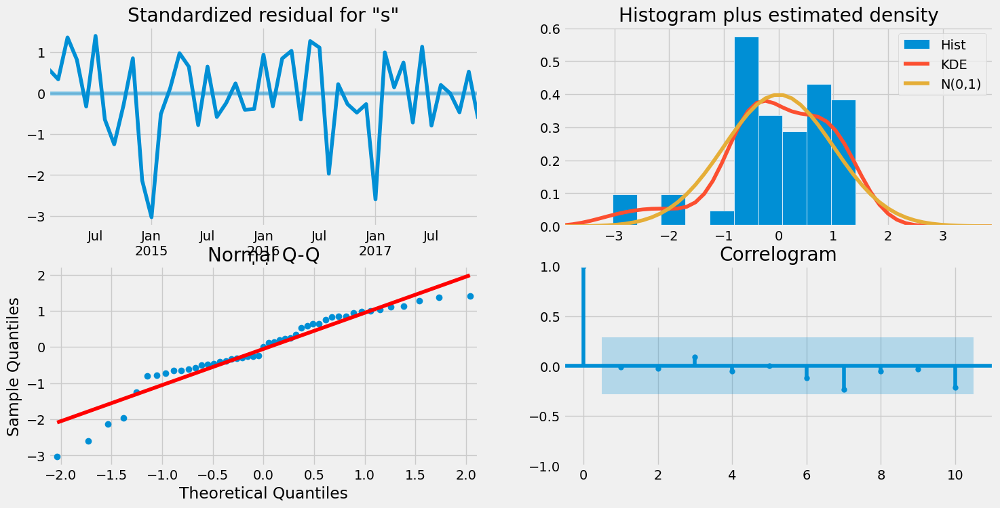

In [128]:
results.plot_diagnostics(figsize=(16,8))
plt.show()

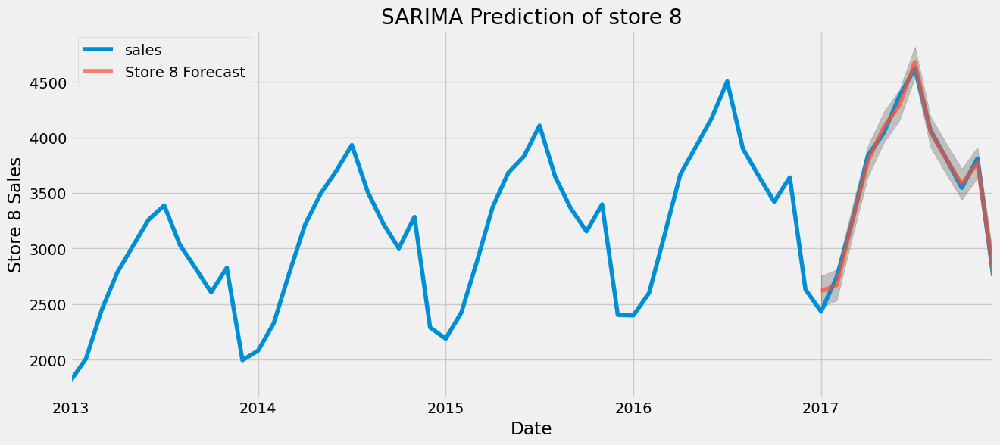

In [129]:
pred8 = results.get_prediction(start=pd.to_datetime('2017-01-01'), dynamic=False)
pred8_ci = pred8.conf_int()

ax = store8_monthly['2013':].plot(label='observed')
pred8.predicted_mean.plot(ax=ax, label='Store 8 Forecast', alpha=.7, figsize=(14, 6))

ax.fill_between(pred8_ci.index,
                pred8_ci.iloc[:, 0],
                pred8_ci.iloc[:, 1], color='k', alpha=.2)

plt.title("SARIMA Prediction of store 8")
ax.set_xlabel('Date')
ax.set_ylabel('Store 8 Sales')
plt.legend()
plt.show()

In [130]:
store8_forecasted_sales = pred8.predicted_mean
store8_true_sales = store8_monthly['2017-01-01':]

mse = mean_squared_error(store8_true_sales, store8_forecasted_sales)
rmse = np.sqrt(mse)

print('The Mean Squared Error of forecasts is {}'.format(round(mse, 2)))
print('The Root Mean Squared Error of forecasts is {}'.format(round(rmse, 2)))

The Mean Squared Error of forecasts is 4884.36
The Root Mean Squared Error of forecasts is 69.89


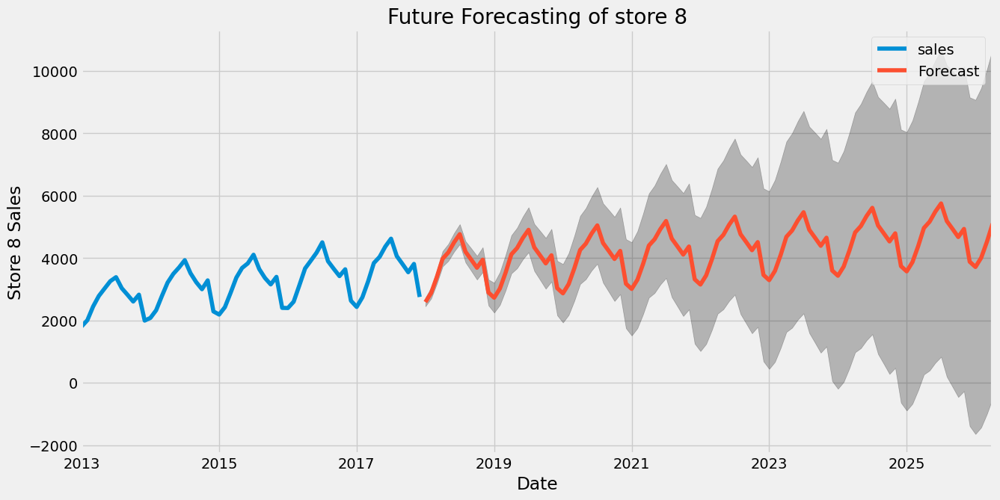

In [131]:
pred8_uc = results.get_forecast(steps=100)
pred8_ci = pred8_uc.conf_int()

ax = store8_monthly.plot(label='observed', figsize=(14, 7))
pred8_uc.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred8_ci.index,
                pred8_ci.iloc[:, 0],
                pred8_ci.iloc[:, 1],
                color='k',
                alpha=0.25)

plt.title("Future Forecasting of store 8")
ax.set_xlabel('Date')
ax.set_ylabel('Store 8 Sales')
plt.legend()
plt.show()

**Store 9**

In [132]:
store9_sales = df[df['store'] == 9]
store9_daily = store9_sales.groupby("date").agg({"sales":"sum"})
store9_monthly = store9_daily.resample(rule='MS').mean()

<AxesSubplot:xlabel='date'>

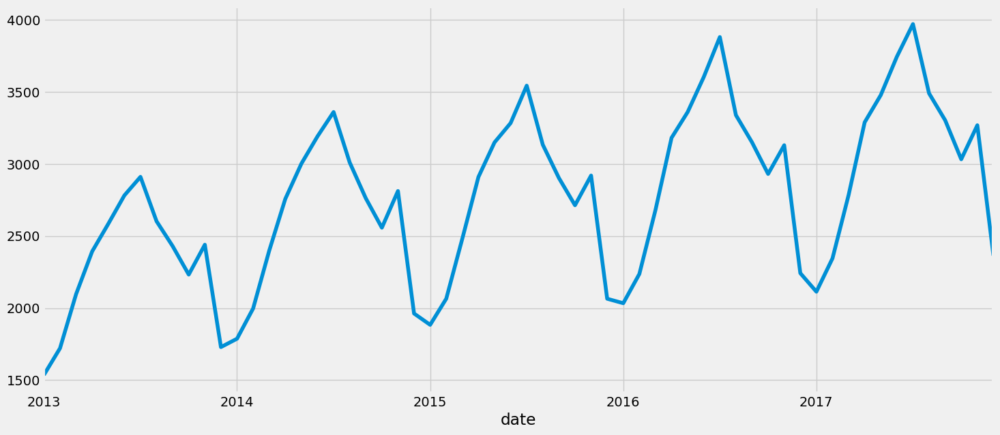

In [133]:
store9_monthly['sales'].plot(figsize=(16,7))

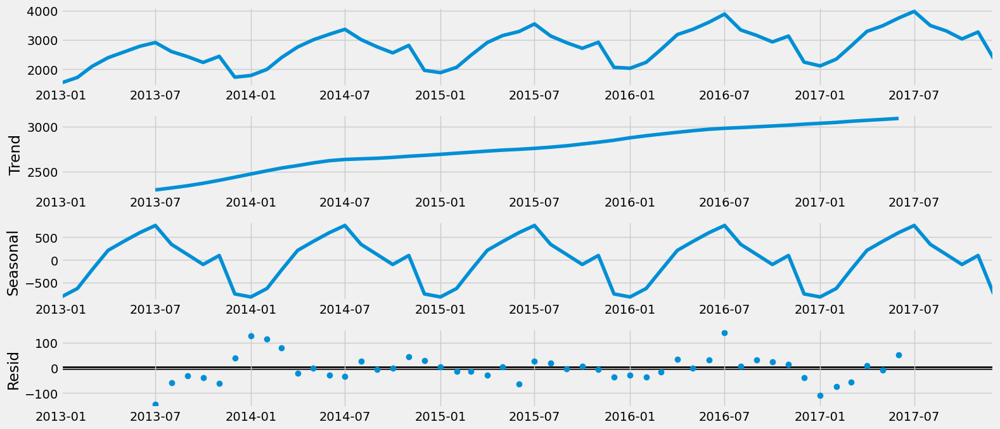

In [134]:
rcParams['figure.figsize'] = 16, 7

decomposition = sm.tsa.seasonal_decompose(store9_monthly, model='additive')
fig = decomposition.plot()
plt.show()

In [135]:
adf_test(store9_monthly['sales'])

ADF Statistics: -5.528049640483719
p-value: 1.8138148623980684e-06
strong evidence against the null hypothesis, reject the null hypothesis. Data has no unit root and is stationary


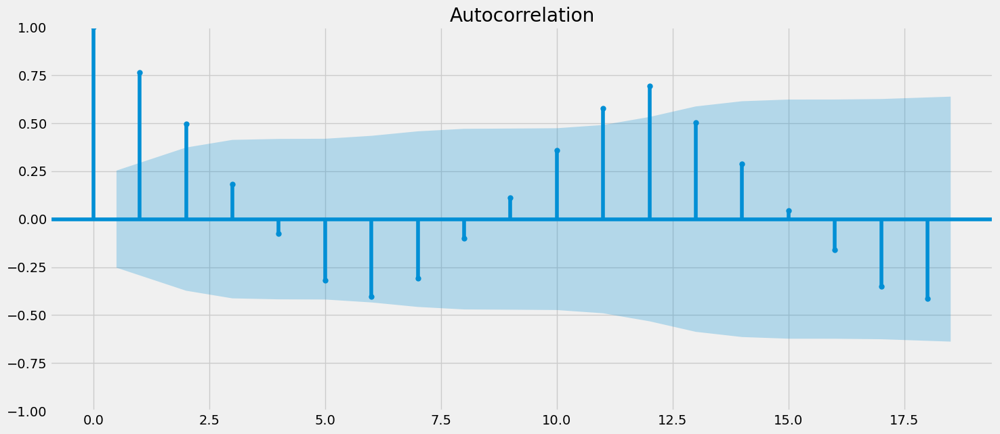

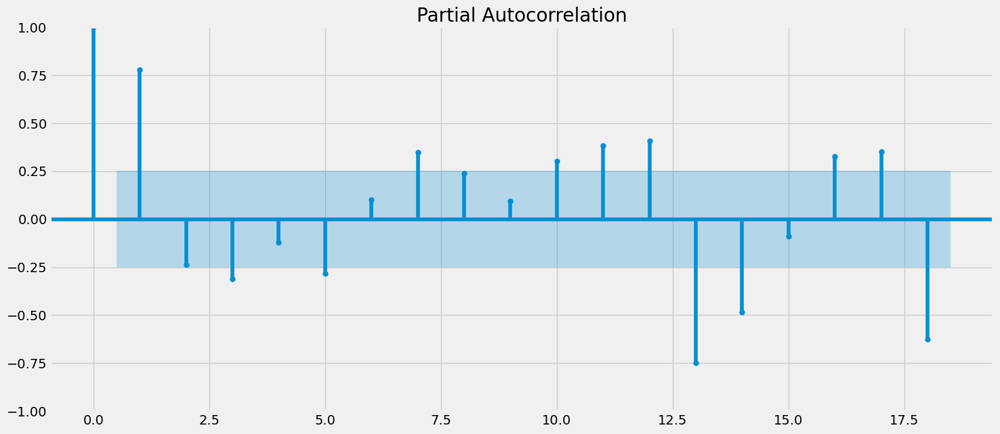

In [136]:
acf = plot_acf(store9_monthly["sales"])
pacf = plot_pacf(store9_monthly["sales"])

In [137]:
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

best_aic = float('inf')
best_params = None

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(store9_monthly, order=param,
                                           seasonal_order=param_seasonal,
                                           enforce_stationarity=False,
                                           enforce_invertibility=False)
            results = mod.fit()
            if results.aic < best_aic:
                best_aic = results.aic
                best_params = (param, param_seasonal)
            print('SARIMAX{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue

SARIMAX(0, 0, 0)x(0, 0, 0, 12)12 - AIC:1107.188313695573
SARIMAX(0, 0, 0)x(0, 0, 1, 12)12 - AIC:834.8906624314617
SARIMAX(0, 0, 0)x(0, 1, 0, 12)12 - AIC:645.4733515487987


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 0, 0)x(0, 1, 1, 12)12 - AIC:1325.618924376353
SARIMAX(0, 0, 0)x(1, 0, 0, 12)12 - AIC:595.1343485833986
SARIMAX(0, 0, 0)x(1, 0, 1, 12)12 - AIC:572.5309438036936
SARIMAX(0, 0, 0)x(1, 1, 0, 12)12 - AIC:442.7441895566942
SARIMAX(0, 0, 0)x(1, 1, 1, 12)12 - AIC:1373.915234605787
SARIMAX(0, 0, 1)x(0, 0, 0, 12)12 - AIC:1023.3095297229858


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 0, 1)x(0, 0, 1, 12)12 - AIC:770.7658144985517
SARIMAX(0, 0, 1)x(0, 1, 0, 12)12 - AIC:579.5449749416923


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 0, 1)x(0, 1, 1, 12)12 - AIC:1369.8279250881023
SARIMAX(0, 0, 1)x(1, 0, 0, 12)12 - AIC:556.6110195953593
SARIMAX(0, 0, 1)x(1, 0, 1, 12)12 - AIC:533.7033985232764
SARIMAX(0, 0, 1)x(1, 1, 0, 12)12 - AIC:415.3892102685536


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 0, 1)x(1, 1, 1, 12)12 - AIC:1435.4632976316966
SARIMAX(0, 1, 0)x(0, 0, 0, 12)12 - AIC:851.6217819704743
SARIMAX(0, 1, 0)x(0, 0, 1, 12)12 - AIC:643.8008089387563
SARIMAX(0, 1, 0)x(0, 1, 0, 12)12 - AIC:504.00286622547264


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 0)x(0, 1, 1, 12)12 - AIC:1213.6220429891014
SARIMAX(0, 1, 0)x(1, 0, 0, 12)12 - AIC:509.7471131444464
SARIMAX(0, 1, 0)x(1, 0, 1, 12)12 - AIC:500.2104136960509
SARIMAX(0, 1, 0)x(1, 1, 0, 12)12 - AIC:378.5313133083529


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 0)x(1, 1, 1, 12)12 - AIC:1196.9595032687075
SARIMAX(0, 1, 1)x(0, 0, 0, 12)12 - AIC:837.7148747389431


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 1)x(0, 0, 1, 12)12 - AIC:632.3018126233399
SARIMAX(0, 1, 1)x(0, 1, 0, 12)12 - AIC:495.65644427776516


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 1)x(0, 1, 1, 12)12 - AIC:1513.486400392093
SARIMAX(0, 1, 1)x(1, 0, 0, 12)12 - AIC:510.3976646915617


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 1)x(1, 0, 1, 12)12 - AIC:494.2200348136808
SARIMAX(0, 1, 1)x(1, 1, 0, 12)12 - AIC:377.4543265446426


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 1)x(1, 1, 1, 12)12 - AIC:1584.1243020598188
SARIMAX(1, 0, 0)x(0, 0, 0, 12)12 - AIC:867.4338430191625


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 0, 0)x(0, 0, 1, 12)12 - AIC:699.306264306035
SARIMAX(1, 0, 0)x(0, 1, 0, 12)12 - AIC:514.8442084972075
SARIMAX(1, 0, 0)x(0, 1, 1, 12)12 - AIC:1435.2217042037805
SARIMAX(1, 0, 0)x(1, 0, 0, 12)12 - AIC:508.479601720261
SARIMAX(1, 0, 0)x(1, 0, 1, 12)12 - AIC:508.5051390639873
SARIMAX(1, 0, 0)x(1, 1, 0, 12)12 - AIC:379.78784360059507
SARIMAX(1, 0, 0)x(1, 1, 1, 12)12 - AIC:1389.0250686283975
SARIMAX(1, 0, 1)x(0, 0, 0, 12)12 - AIC:854.1986093275228
SARIMAX(1, 0, 1)x(0, 0, 1, 12)12 - AIC:647.1377360322705
SARIMAX(1, 0, 1)x(0, 1, 0, 12)12 - AIC:506.4474843864489
SARIMAX(1, 0, 1)x(0, 1, 1, 12)12 - AIC:1372.6355594866682
SARIMAX(1, 0, 1)x(1, 0, 0, 12)12 - AIC:509.666785861568


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 0, 1)x(1, 0, 1, 12)12 - AIC:498.8639475927095
SARIMAX(1, 0, 1)x(1, 1, 0, 12)12 - AIC:378.1400917361674


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 0, 1)x(1, 1, 1, 12)12 - AIC:1328.4732935909851
SARIMAX(1, 1, 0)x(0, 0, 0, 12)12 - AIC:851.8114609204948
SARIMAX(1, 1, 0)x(0, 0, 1, 12)12 - AIC:644.1600834855758
SARIMAX(1, 1, 0)x(0, 1, 0, 12)12 - AIC:505.8284730910162


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 1, 0)x(0, 1, 1, 12)12 - AIC:883.0090996626046
SARIMAX(1, 1, 0)x(1, 0, 0, 12)12 - AIC:500.7697919422521
SARIMAX(1, 1, 0)x(1, 0, 1, 12)12 - AIC:499.94595400919627
SARIMAX(1, 1, 0)x(1, 1, 0, 12)12 - AIC:365.95687594250404


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 1, 0)x(1, 1, 1, 12)12 - AIC:1253.3047460995908
SARIMAX(1, 1, 1)x(0, 0, 0, 12)12 - AIC:838.9241429140177
SARIMAX(1, 1, 1)x(0, 0, 1, 12)12 - AIC:632.1829523555945
SARIMAX(1, 1, 1)x(0, 1, 0, 12)12 - AIC:495.46474555731675


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 1, 1)x(0, 1, 1, 12)12 - AIC:1198.8062291383442
SARIMAX(1, 1, 1)x(1, 0, 0, 12)12 - AIC:504.2455372664822
SARIMAX(1, 1, 1)x(1, 0, 1, 12)12 - AIC:491.73998005971384
SARIMAX(1, 1, 1)x(1, 1, 0, 12)12 - AIC:370.8396203261515
SARIMAX(1, 1, 1)x(1, 1, 1, 12)12 - AIC:1269.5469368975985


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [138]:
model=SARIMAX(store9_monthly,order=(1,1,0),seasonal_order=(1,1,0,12))
results=model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              sales   No. Observations:                   60
Model:             SARIMAX(1, 1, 0)x(1, 1, 0, 12)   Log Likelihood                -255.955
Date:                            Fri, 09 Jun 2023   AIC                            517.910
Time:                                    18:26:33   BIC                            523.461
Sample:                                01-01-2013   HQIC                           519.999
                                     - 12-01-2017                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0598      0.125     -0.480      0.631      -0.304       0.185
ar.S.L12       0.0168      0.181      0.093      0.926      -0.338       0.372
sigma2      3146.4116    620.579      5.070      0.000    1930.100    4362.724
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                 3.33
Prob(Q):                              0.95   Prob(JB):                         0.19
Heteroskedasticity (H):               0.37   Skew:                            -0.64
Prob(H) (two-sided):                  0.05   Kurtosis:                         3.21
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

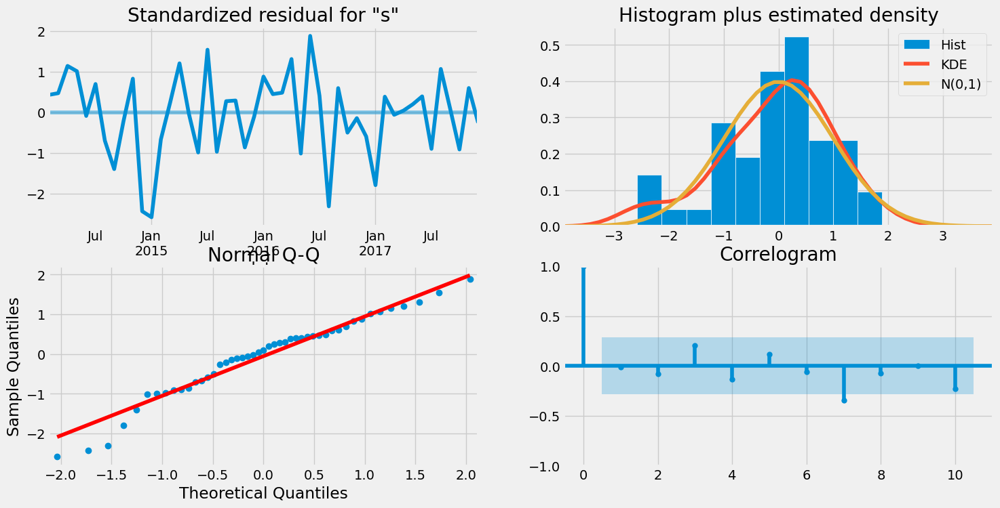

In [139]:
results.plot_diagnostics(figsize=(16,8))
plt.show()

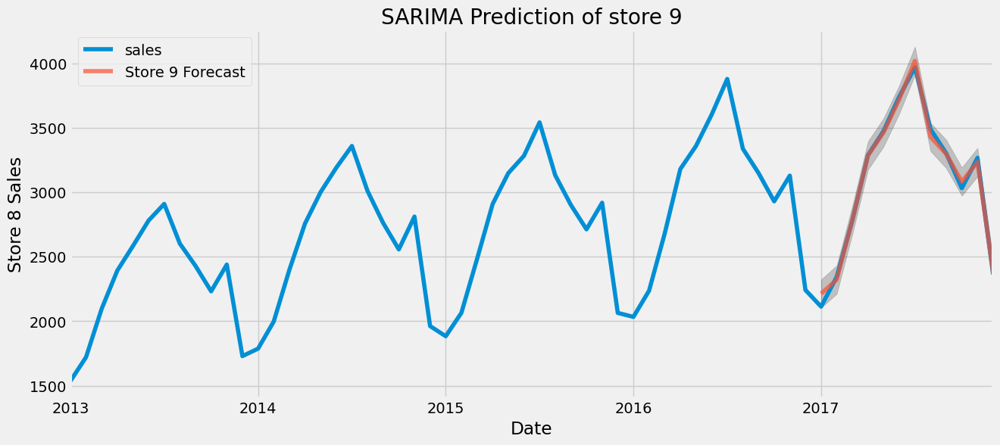

In [140]:
pred9 = results.get_prediction(start=pd.to_datetime('2017-01-01'), dynamic=False)
pred9_ci = pred9.conf_int()

ax = store9_monthly['2013':].plot(label='observed')
pred9.predicted_mean.plot(ax=ax, label='Store 9 Forecast', alpha=.7, figsize=(14, 6))

ax.fill_between(pred9_ci.index,
                pred9_ci.iloc[:, 0],
                pred9_ci.iloc[:, 1], color='k', alpha=.2)

plt.title("SARIMA Prediction of store 9")
ax.set_xlabel('Date')
ax.set_ylabel('Store 8 Sales')
plt.legend()
plt.show()

In [141]:
store9_forecasted_sales = pred9.predicted_mean
store9_true_sales = store9_monthly['2017-01-01':]

mse = mean_squared_error(store9_true_sales, store9_forecasted_sales)
rmse = np.sqrt(mse)

print('The Mean Squared Error of forecasts is {}'.format(round(mse, 2)))
print('The Root Mean Squared Error of forecasts is {}'.format(round(rmse, 2)))

The Mean Squared Error of forecasts is 1776.45
The Root Mean Squared Error of forecasts is 42.15


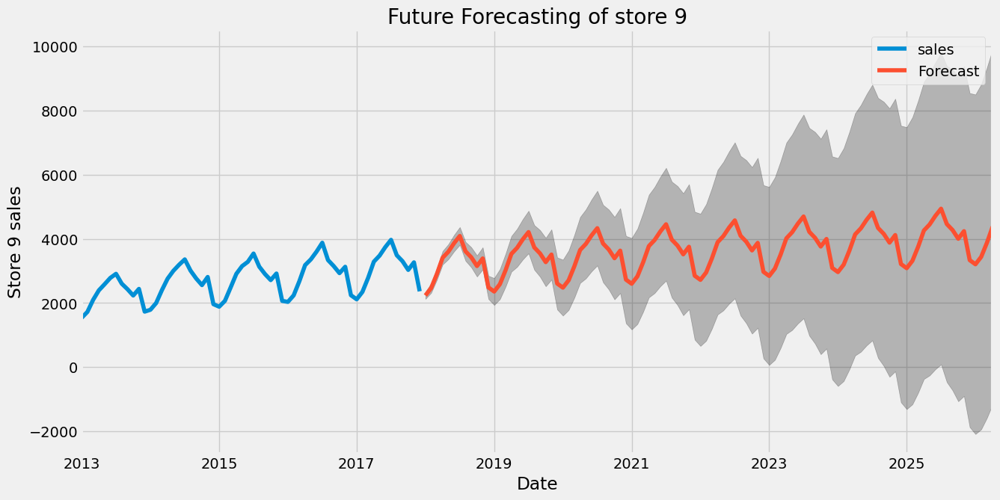

In [142]:
pred9_uc = results.get_forecast(steps=100)
pred9_ci = pred9_uc.conf_int()

ax = store9_monthly.plot(label='observed', figsize=(14, 7))
pred9_uc.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred9_ci.index, pred9_ci.iloc[:, 0], pred9_ci.iloc[:, 1], color='k', alpha=.25)

plt.title("Future Forecasting of store 9")
ax.set_xlabel('Date')
ax.set_ylabel('Store 9 sales')
plt.legend()
plt.show()

**Store 10**

In [143]:
store10_sales = df[df['store'] == 10]
store10_daily = store10_sales.groupby("date").agg({"sales":"sum"})
store10_monthly = store10_daily.resample(rule='MS').mean()

<AxesSubplot:xlabel='date'>

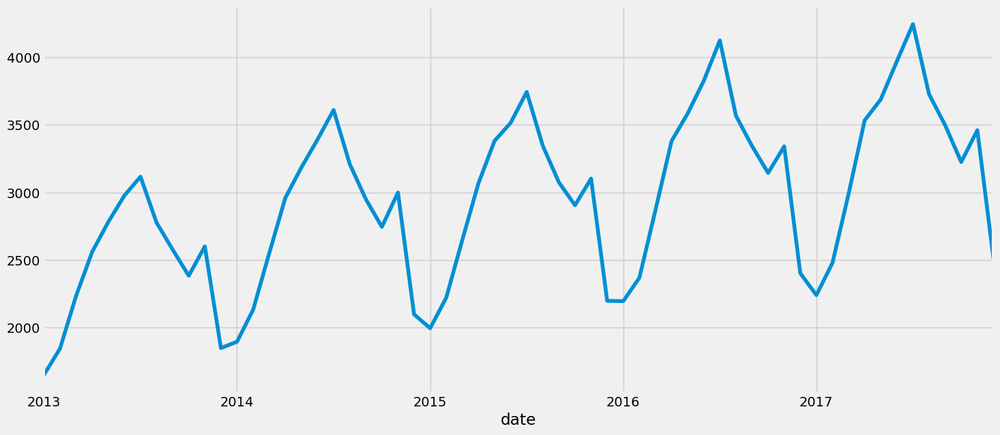

In [144]:
store10_monthly['sales'].plot(figsize=(16,7))

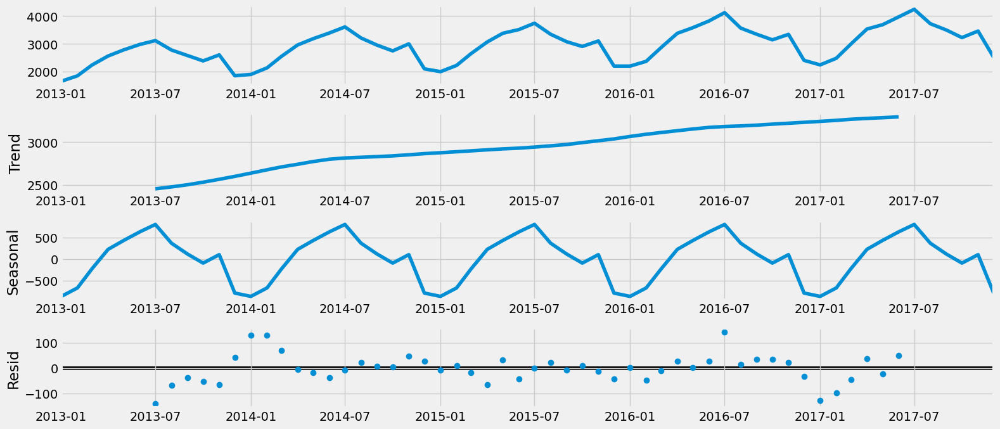

In [145]:
rcParams['figure.figsize'] = 16, 7

decomposition = sm.tsa.seasonal_decompose(store10_monthly, model='additive')
fig = decomposition.plot()
plt.show()

In [146]:
adf_test(store10_monthly['sales'])

ADF Statistics: -5.275953872662051
p-value: 6.139882175356997e-06
strong evidence against the null hypothesis, reject the null hypothesis. Data has no unit root and is stationary


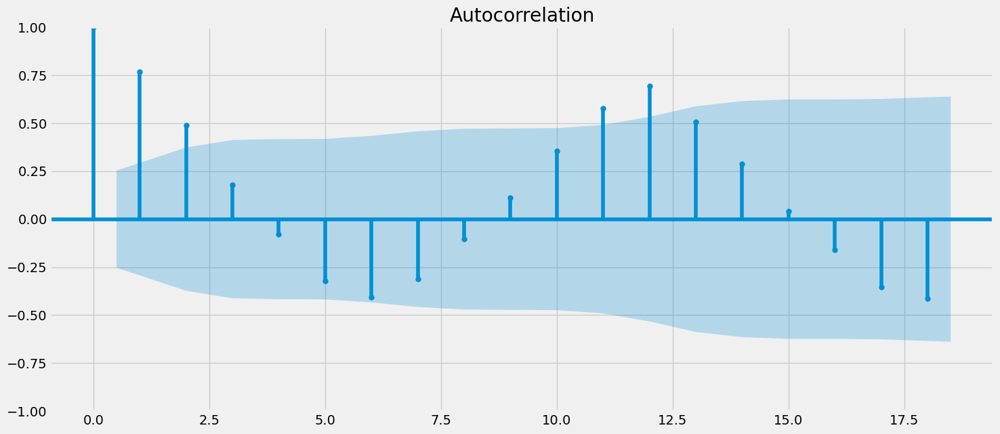

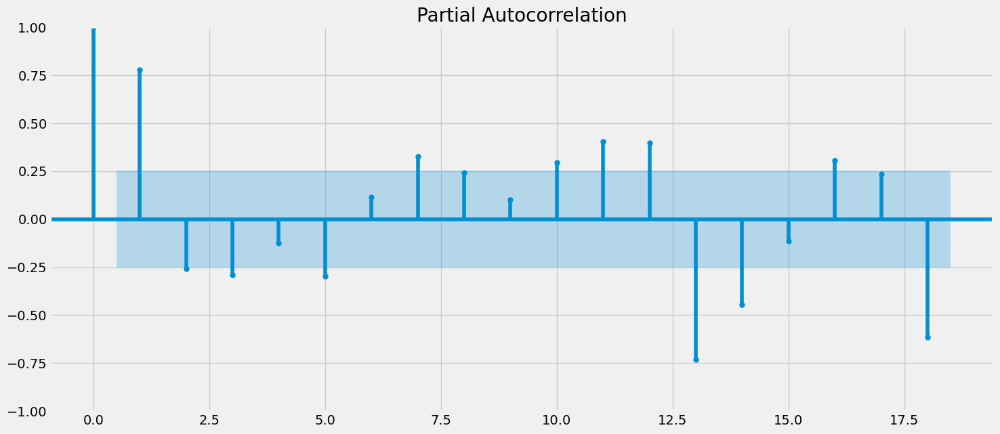

In [147]:
acf = plot_acf(store10_monthly["sales"])
pacf = plot_pacf(store10_monthly["sales"])

In [148]:
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(store10_monthly, order=param,
                                           seasonal_order=param_seasonal,
                                           enforce_stationarity=False,
                                           enforce_invertibility=False)
            results = mod.fit()
            print('SARIMAX{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue

SARIMAX(0, 0, 0)x(0, 0, 0, 12)12 - AIC:1114.7641982430741
SARIMAX(0, 0, 0)x(0, 0, 1, 12)12 - AIC:840.7377987229729
SARIMAX(0, 0, 0)x(0, 1, 0, 12)12 - AIC:651.192392362934
SARIMAX(0, 0, 0)x(0, 1, 1, 12)12 - AIC:1518.4545751693436
SARIMAX(0, 0, 0)x(1, 0, 0, 12)12 - AIC:602.8290591260387
SARIMAX(0, 0, 0)x(1, 0, 1, 12)12 - AIC:579.6564279236602
SARIMAX(0, 0, 0)x(1, 1, 0, 12)12 - AIC:451.17013656879533
SARIMAX(0, 0, 0)x(1, 1, 1, 12)12 - AIC:967.6763309008014
SARIMAX(0, 0, 1)x(0, 0, 0, 12)12 - AIC:1030.1014607996094
SARIMAX(0, 0, 1)x(0, 0, 1, 12)12 - AIC:776.3010355816201
SARIMAX(0, 0, 1)x(0, 1, 0, 12)12 - AIC:588.158300659977


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 0, 1)x(0, 1, 1, 12)12 - AIC:1435.775774806842
SARIMAX(0, 0, 1)x(1, 0, 0, 12)12 - AIC:568.3456859703454


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 0, 1)x(1, 0, 1, 12)12 - AIC:540.9604040291366
SARIMAX(0, 0, 1)x(1, 1, 0, 12)12 - AIC:430.81770981358585


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 0, 1)x(1, 1, 1, 12)12 - AIC:1243.4653753127257
SARIMAX(0, 1, 0)x(0, 0, 0, 12)12 - AIC:858.5331731560832
SARIMAX(0, 1, 0)x(0, 0, 1, 12)12 - AIC:649.8594832940719
SARIMAX(0, 1, 0)x(0, 1, 0, 12)12 - AIC:521.1566024598732


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 0)x(0, 1, 1, 12)12 - AIC:1311.8559601153588
SARIMAX(0, 1, 0)x(1, 0, 0, 12)12 - AIC:529.0540997028202
SARIMAX(0, 1, 0)x(1, 0, 1, 12)12 - AIC:513.311775402798
SARIMAX(0, 1, 0)x(1, 1, 0, 12)12 - AIC:392.6475686602592


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 0)x(1, 1, 1, 12)12 - AIC:1432.0648432174316
SARIMAX(0, 1, 1)x(0, 0, 0, 12)12 - AIC:844.1580881289512
SARIMAX(0, 1, 1)x(0, 0, 1, 12)12 - AIC:636.3153258450998
SARIMAX(0, 1, 1)x(0, 1, 0, 12)12 - AIC:511.1112363014413


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 1)x(0, 1, 1, 12)12 - AIC:1336.6072886167583
SARIMAX(0, 1, 1)x(1, 0, 0, 12)12 - AIC:527.2141743058471
SARIMAX(0, 1, 1)x(1, 0, 1, 12)12 - AIC:500.78417431387703
SARIMAX(0, 1, 1)x(1, 1, 0, 12)12 - AIC:388.61235390674324


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(0, 1, 1)x(1, 1, 1, 12)12 - AIC:1337.8861997794452
SARIMAX(1, 0, 0)x(0, 0, 0, 12)12 - AIC:874.4616304368375
SARIMAX(1, 0, 0)x(0, 0, 1, 12)12 - AIC:665.6143849877075
SARIMAX(1, 0, 0)x(0, 1, 0, 12)12 - AIC:532.4159015798324


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 0, 0)x(0, 1, 1, 12)12 - AIC:1739.6026148128255
SARIMAX(1, 0, 0)x(1, 0, 0, 12)12 - AIC:527.3725042903269
SARIMAX(1, 0, 0)x(1, 0, 1, 12)12 - AIC:521.6545331071812
SARIMAX(1, 0, 0)x(1, 1, 0, 12)12 - AIC:394.0143300476419


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 0, 0)x(1, 1, 1, 12)12 - AIC:1546.1636111218786
SARIMAX(1, 0, 1)x(0, 0, 0, 12)12 - AIC:860.700505000346
SARIMAX(1, 0, 1)x(0, 0, 1, 12)12 - AIC:653.0098105062184
SARIMAX(1, 0, 1)x(0, 1, 0, 12)12 - AIC:522.2266490656666
SARIMAX(1, 0, 1)x(0, 1, 1, 12)12 - AIC:1479.18444445148
SARIMAX(1, 0, 1)x(1, 0, 0, 12)12 - AIC:526.7771637324306


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 0, 1)x(1, 0, 1, 12)12 - AIC:520.0616793864065
SARIMAX(1, 0, 1)x(1, 1, 0, 12)12 - AIC:391.5653571071441


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 0, 1)x(1, 1, 1, 12)12 - AIC:927.358879704958
SARIMAX(1, 1, 0)x(0, 0, 0, 12)12 - AIC:858.2686181037035
SARIMAX(1, 1, 0)x(0, 0, 1, 12)12 - AIC:649.9673541074523
SARIMAX(1, 1, 0)x(0, 1, 0, 12)12 - AIC:521.8645136244379
SARIMAX(1, 1, 0)x(0, 1, 1, 12)12 - AIC:1449.4189760352483
SARIMAX(1, 1, 0)x(1, 0, 0, 12)12 - AIC:517.3264177932499
SARIMAX(1, 1, 0)x(1, 0, 1, 12)12 - AIC:511.55958251994264
SARIMAX(1, 1, 0)x(1, 1, 0, 12)12 - AIC:379.3566863464062
SARIMAX(1, 1, 0)x(1, 1, 1, 12)12 - AIC:1450.635244922832
SARIMAX(1, 1, 1)x(0, 0, 0, 12)12 - AIC:845.4425646820805
SARIMAX(1, 1, 1)x(0, 0, 1, 12)12 - AIC:638.2200721341433
SARIMAX(1, 1, 1)x(0, 1, 0, 12)12 - AIC:513.1098775444973


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 1, 1)x(0, 1, 1, 12)12 - AIC:1436.8869010874603
SARIMAX(1, 1, 1)x(1, 0, 0, 12)12 - AIC:518.7126832962067


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMAX(1, 1, 1)x(1, 0, 1, 12)12 - AIC:502.7378788581681
SARIMAX(1, 1, 1)x(1, 1, 0, 12)12 - AIC:379.3175529349398
SARIMAX(1, 1, 1)x(1, 1, 1, 12)12 - AIC:1438.126049664426


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [149]:
model=SARIMAX(store10_monthly,order=(1,1,1),seasonal_order=(1,1,0,12))
results=model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                               sales   No. Observations:                   60
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 12)   Log Likelihood                -263.107
Date:                             Fri, 09 Jun 2023   AIC                            534.213
Time:                                     18:26:59   BIC                            541.614
Sample:                                 01-01-2013   HQIC                           536.998
                                      - 12-01-2017                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0251      1.289      0.020      0.984      -2.502       2.552
ma.L1         -0.1814      1.276     -0.142      0.887      -2.682       2.319
ar.S.L12      -0.2503      0.196     -1.279      0.201      -0.634       0.133
sigma2      4174.9352    983.354      4.246      0.000    2247.597    6102.273
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                 3.12
Prob(Q):                              0.94   Prob(JB):                         0.21
Heteroskedasticity (H):               0.51   Skew:                            -0.63
Prob(H) (two-sided):                  0.19   Kurtosis:                         3.07
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

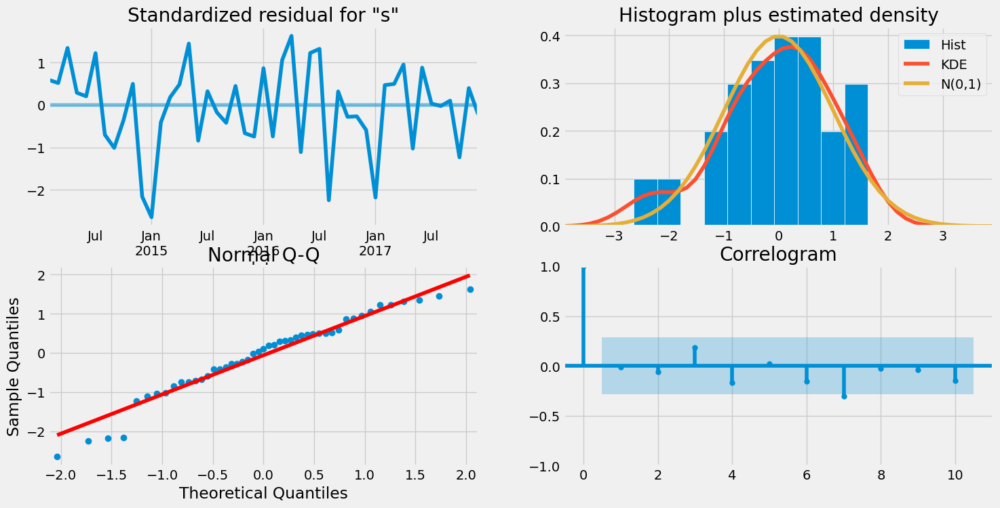

In [150]:
results.plot_diagnostics(figsize=(16,8))
plt.show()

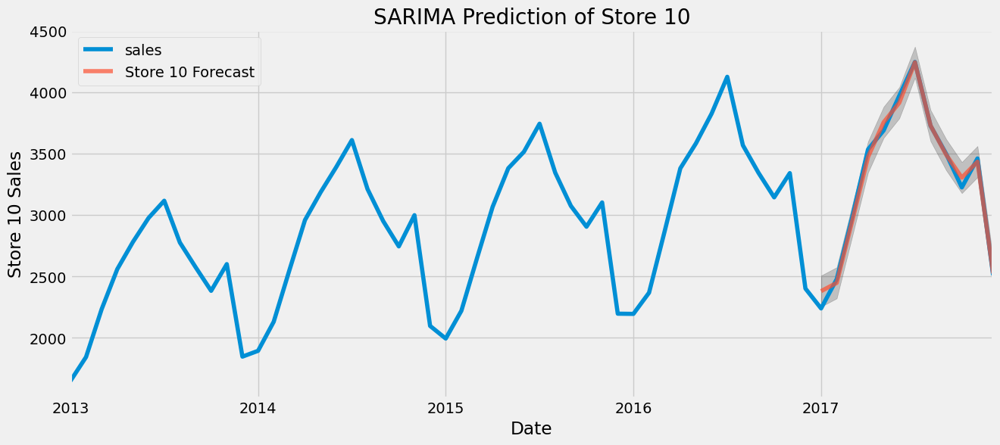

In [151]:
pred10 = results.get_prediction(start=pd.to_datetime('2017-01-01'), dynamic=False)
pred10_ci = pred10.conf_int()

ax = store10_monthly['2013':].plot(label='observed')
pred10.predicted_mean.plot(ax=ax, label='Store 10 Forecast', alpha=.7, figsize=(14, 6))

ax.fill_between(pred10_ci.index, 
                pred10_ci.iloc[:, 0],
                pred10_ci.iloc[:, 1], color='k', alpha=.2)

plt.title("SARIMA Prediction of Store 10")
ax.set_xlabel('Date')
ax.set_ylabel('Store 10 Sales')
plt.legend()
plt.show()

In [152]:
store10_forecasted_sales = pred10.predicted_mean
store10_true_sales = store10_monthly['2017-01-01':]

mse = mean_squared_error(store10_true_sales, store10_forecasted_sales)
print('The Mean Squared Error of the forecasts is {}'.format(round(mse, 2)))
print('The Root Mean Squared Error of the forecasts is {}'.format(round(np.sqrt(mse), 2)))

The Mean Squared Error of the forecasts is 3370.8
The Root Mean Squared Error of the forecasts is 58.06


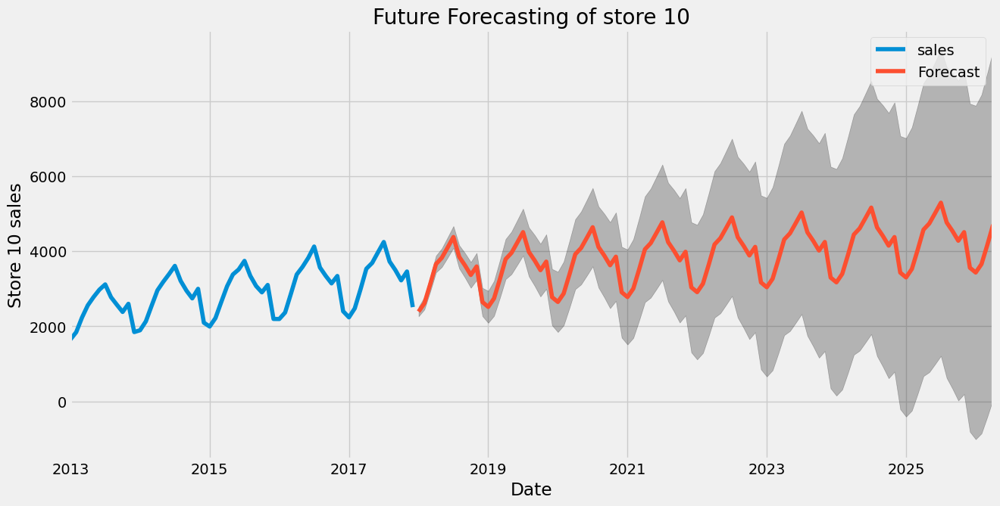

In [153]:
pred10_uc = results.get_forecast(steps=100)
pred10_ci = pred10_uc.conf_int()

ax = store10_monthly.plot(label='observed', figsize=(14, 7))
pred10_uc.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred10_ci.index,
                pred10_ci.iloc[:, 0],
                pred10_ci.iloc[:, 1],
                color='k',
                alpha=.25)

plt.title("Future Forecasting of store 10")
ax.set_xlabel('Date')
ax.set_ylabel('Store 10 sales')
plt.legend()
plt.show()

**Time Series Modelling with Prophet**

In [154]:
!pip install Prophet

Defaulting to user installation because normal site-packages is not writeable


In [155]:
store1_sales=df[df['store']==1]
store1_daily=store1_sales.groupby("date").agg({"sales":"sum"})
store1_monthly=store1_daily.resample(rule='MS').mean()
store1_monthly.head()

,sales
date,
2013-01-01,1325.064516
2013-02-01,1475.214286
2013-03-01,1800.870968
2013-04-01,2050.766667
2013-05-01,2234.580645


In [156]:
store1 = store1_monthly[:'2016']
store1.tail()

,sales
date,
2016-08-01,2858.903226
2016-09-01,2714.800000
2016-10-01,2530.193548
2016-11-01,2685.933333
2016-12-01,1943.419355


18:27:10 - cmdstanpy - INFO - Chain [1] start processing
18:27:11 - cmdstanpy - INFO - Chain [1] done processing


<Figure size 1600x700 with 0 Axes>

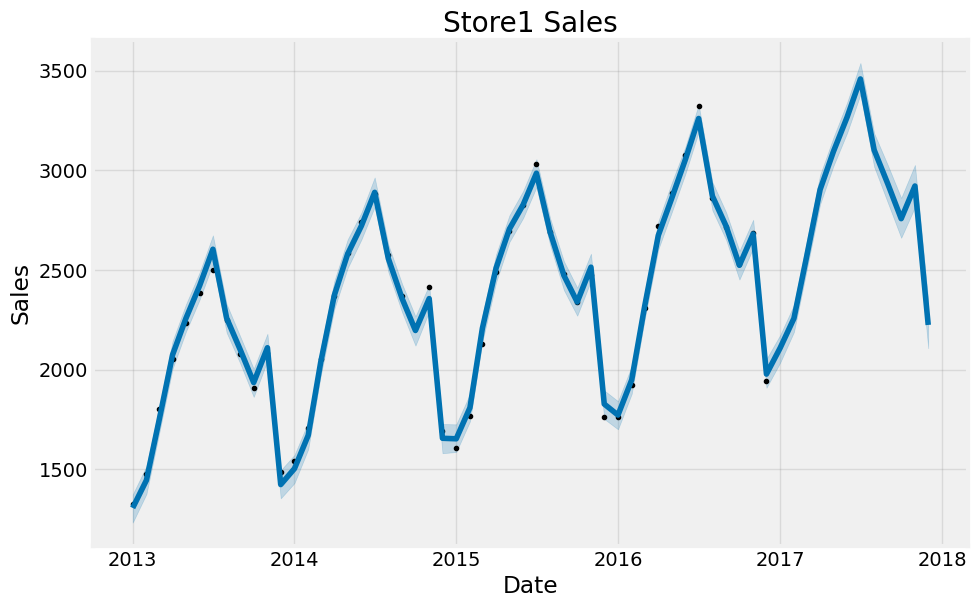

In [157]:
from prophet import Prophet

store1 = store1.reset_index()
store1 = store1.rename(columns={'date': 'ds', 'sales': 'y'})
store1_model = Prophet(interval_width=0.95)
store1_model.fit(store1)

store1_forecast = store1_model.make_future_dataframe(periods=12, freq='MS')
store1_forecast = store1_model.predict(store1_forecast)

plt.figure(figsize=(16, 7))
store1_model.plot(store1_forecast, xlabel='Date', ylabel='Sales')
plt.title('Store1 Sales')
plt.show()

18:27:12 - cmdstanpy - INFO - Chain [1] start processing
18:27:12 - cmdstanpy - INFO - Chain [1] done processing


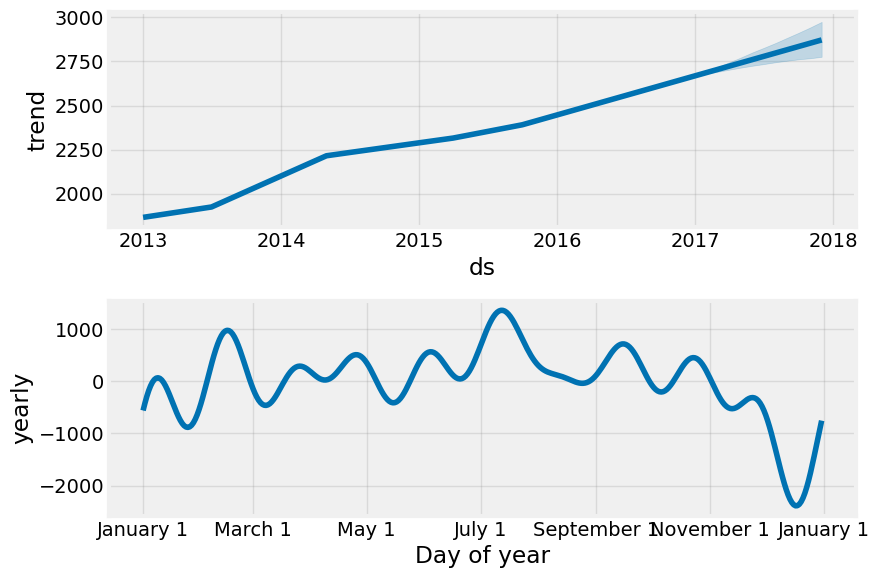

In [158]:
store1 = store1.reset_index()
store1 = store1.rename(columns={'date': 'ds', 'sales': 'y'})
store1_model = Prophet(interval_width=0.95)
store1_model.fit(store1)

store1_forecast = store1_model.make_future_dataframe(periods=12, freq='MS')
store1_forecast = store1_model.predict(store1_forecast)

fig = store1_model.plot_components(store1_forecast)
plt.show()

In [159]:
store1_forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2013-01-01,1865.739207,1236.700975,1375.359791,1865.739207,1865.739207,-559.726096,-559.726096,-559.726096,-559.726096,-559.726096,-559.726096,0.0,0.0,0.0,1306.013112
1,2013-02-01,1875.815392,1372.687020,1516.467279,1875.815392,1875.815392,-430.662536,-430.662536,-430.662536,-430.662536,-430.662536,-430.662536,0.0,0.0,0.0,1445.152856
2,2013-03-01,1884.916462,1676.908065,1808.625358,1884.916462,1884.916462,-145.327349,-145.327349,-145.327349,-145.327349,-145.327349,-145.327349,0.0,0.0,0.0,1739.589113
3,2013-04-01,1894.992647,2006.310163,2144.244540,1894.992647,1894.992647,179.385534,179.385534,179.385534,179.385534,179.385534,179.385534,0.0,0.0,0.0,2074.378181
4,2013-05-01,1904.743794,2191.142195,2324.838698,1904.743794,1904.743794,351.817922,351.817922,351.817922,351.817922,351.817922,351.817922,0.0,0.0,0.0,2256.561716
5,2013-06-01,1914.837504,2352.700988,2491.212261,1914.837504,1914.837504,506.287584,506.287584,506.287584,506.287584,506.287584,506.287584,0.0,0.0,0.0,2421.125088
6,2013-07-01,1924.605611,2534.611233,2673.814172,1924.605611,1924.605611,679.463559,679.463559,679.463559,679.463559,679.463559,679.463559,0.0,0.0,0.0,2604.069170
7,2013-08-01,1954.227909,2188.352278,2324.942219,1954.227909,1954.227909,304.060078,304.060078,304.060078,304.060078,304.060078,304.060078,0.0,0.0,0.0,2258.287988
8,2013-09-01,1983.869306,2024.300728,2161.834363,1983.869306,1983.869306,114.167834,114.167834,114.167834,114.167834,114.167834,114.167834,0.0,0.0,0.0,2098.037141
9,2013-10-01,2012.554529,1870.635986,2004.712866,2012.554529,2012.554529,-77.391464,-77.391464,-77.391464,-77.391464,-77.391464,-77.391464,0.0,0.0,0.0,1935.163065


In [160]:
store1_forecast[['ds','yhat']]

,ds,yhat
0,2013-01-01,1306.013112
1,2013-02-01,1445.152856
2,2013-03-01,1739.589113
3,2013-04-01,2074.378181
4,2013-05-01,2256.561716
5,2013-06-01,2421.125088
6,2013-07-01,2604.069170
7,2013-08-01,2258.287988
8,2013-09-01,2098.037141
9,2013-10-01,1935.163065


In [161]:
y_pred_pro = store1_forecast.set_index('ds')[['yhat']]
y_pred_pro = y_pred_pro['2017':]
y_pred_pro

,yhat
ds,
2017-01-01,2109.242390
2017-02-01,2257.144088
2017-03-01,2559.494369
2017-04-01,2903.045391
2017-05-01,3093.708236
2017-06-01,3267.016036
2017-07-01,3458.422469
2017-08-01,3101.857127
2017-09-01,2930.803022


In [162]:
forecasted_sales = y_pred_pro['yhat']
true_sales = store1_monthly['2017-01-01':]

mse = mean_squared_error(true_sales, forecasted_sales)
print('The Mean Squared Error of forecasts is {}'.format(round(mse, 2)))
print('The Root Mean Squared Error of forecasts is {}'.format(round(np.sqrt(mse), 2)))

The Mean Squared Error of forecasts is 25181.42
The Root Mean Squared Error of forecasts is 158.69


In [163]:
Store1_RMSE['Prophet_RMSE'] = round(np.sqrt(mse), 2)
comp['Prophet_Prediction'] = y_pred_pro['yhat']

18:27:13 - cmdstanpy - INFO - Chain [1] start processing
18:27:14 - cmdstanpy - INFO - Chain [1] done processing


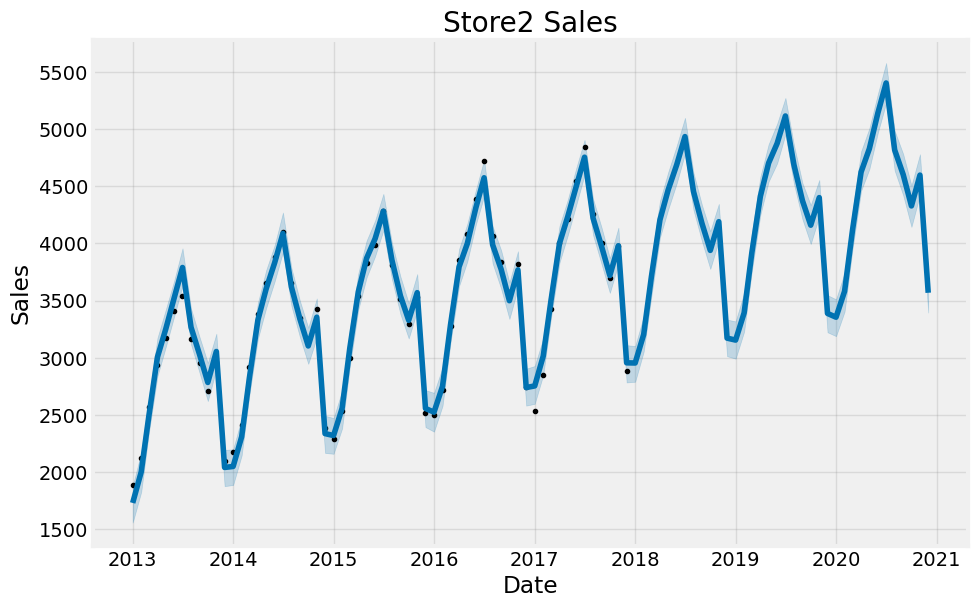

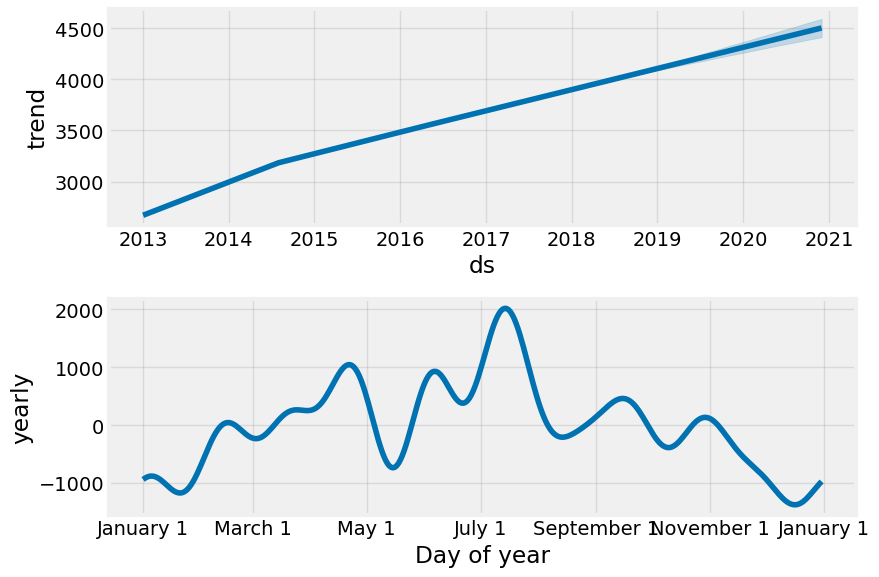

In [164]:
store2_sales = df[df['store'] == 2]
store2_daily = store2_sales.groupby("date").agg({"sales": "sum"})
store2_monthly = store2_daily.resample(rule='MS').mean()

store2 = store2_monthly.reset_index()
store2 = store2.rename(columns={'date': 'ds', 'sales': 'y'})
store2_model = Prophet(interval_width=0.95)
store2_model.fit(store2)

store2_forecast = store2_model.make_future_dataframe(periods=36, freq='MS')
store2_forecast = store2_model.predict(store2_forecast)

fig = store2_model.plot(store2_forecast, xlabel='Date', ylabel='Sales')
plt.title('Store2 Sales')

fig_comp = store2_model.plot_components(store2_forecast)
plt.show()

**Model building and Forecasting future sales using Prophet for all 10 stores**

18:27:15 - cmdstanpy - INFO - Chain [1] start processing
18:27:16 - cmdstanpy - INFO - Chain [1] done processing


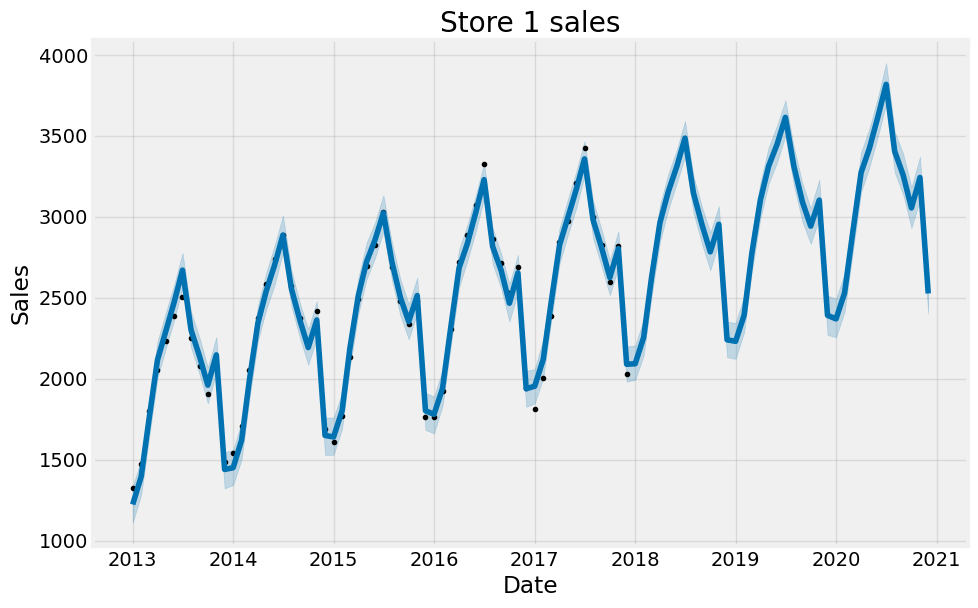

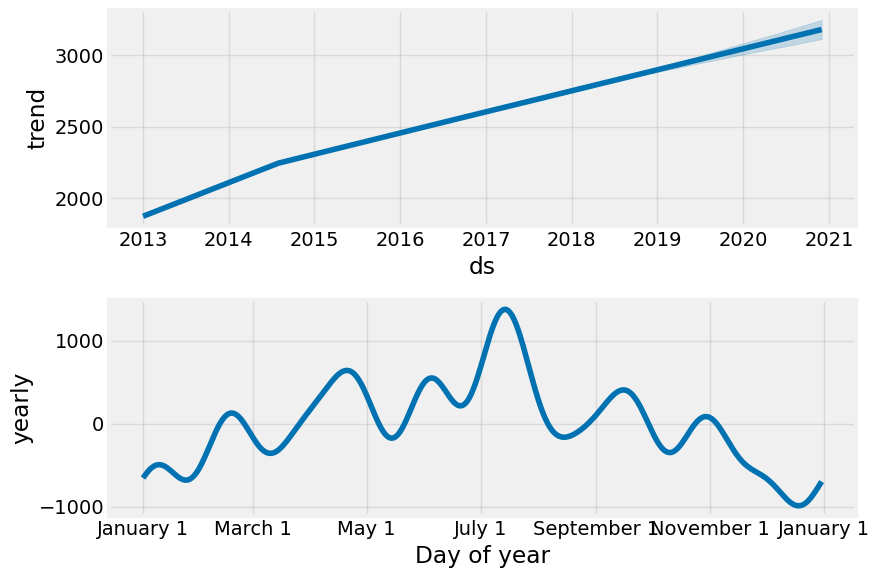

18:27:17 - cmdstanpy - INFO - Chain [1] start processing
18:27:18 - cmdstanpy - INFO - Chain [1] done processing


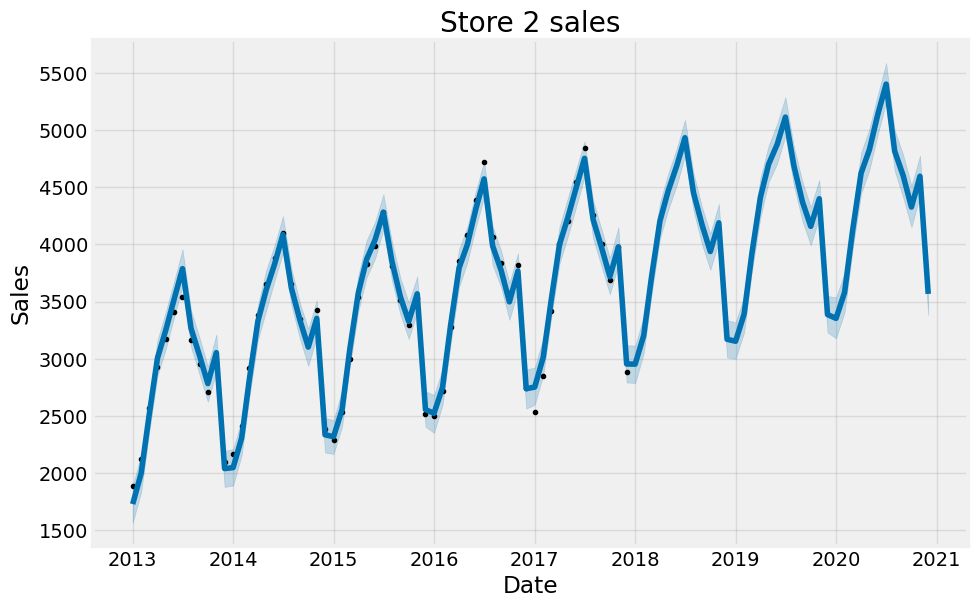

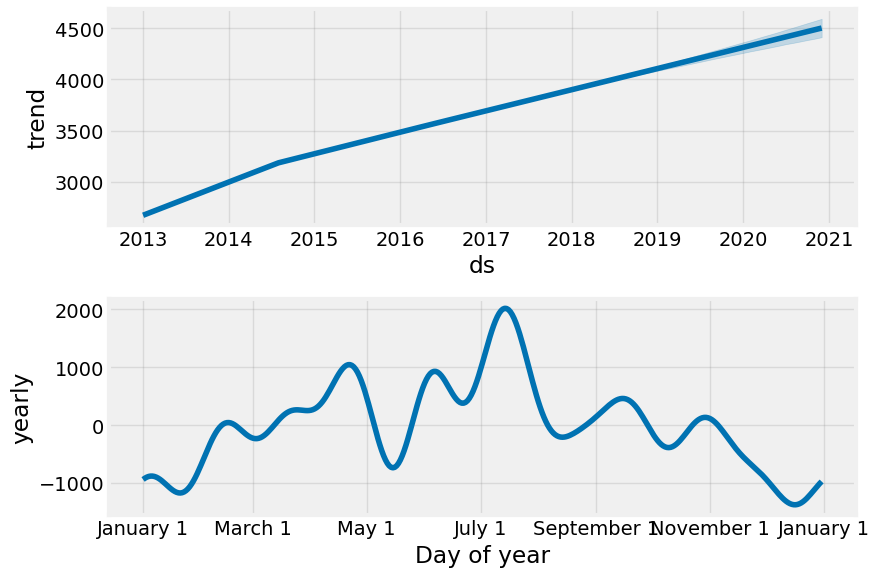

18:27:19 - cmdstanpy - INFO - Chain [1] start processing
18:27:20 - cmdstanpy - INFO - Chain [1] done processing


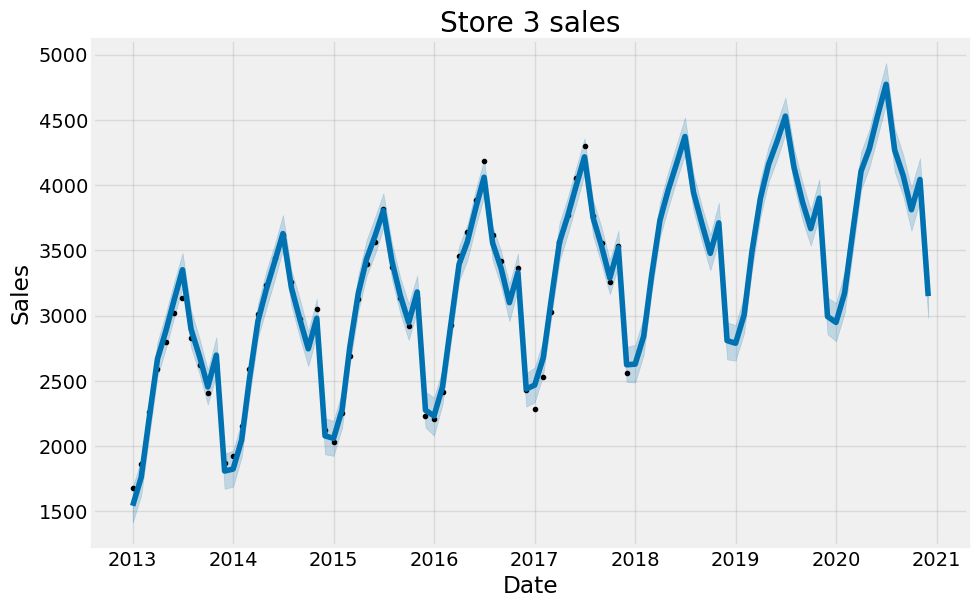

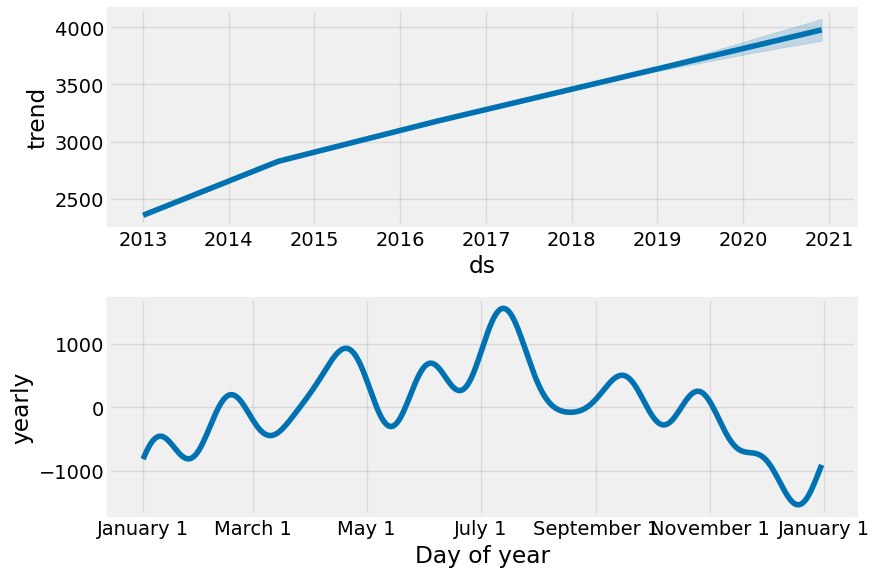

18:27:21 - cmdstanpy - INFO - Chain [1] start processing
18:27:22 - cmdstanpy - INFO - Chain [1] done processing


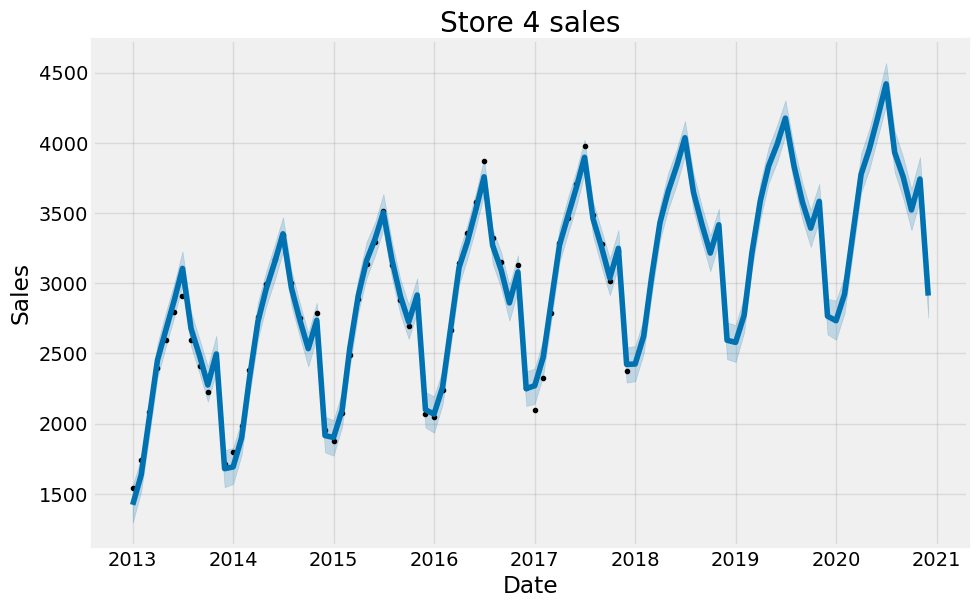

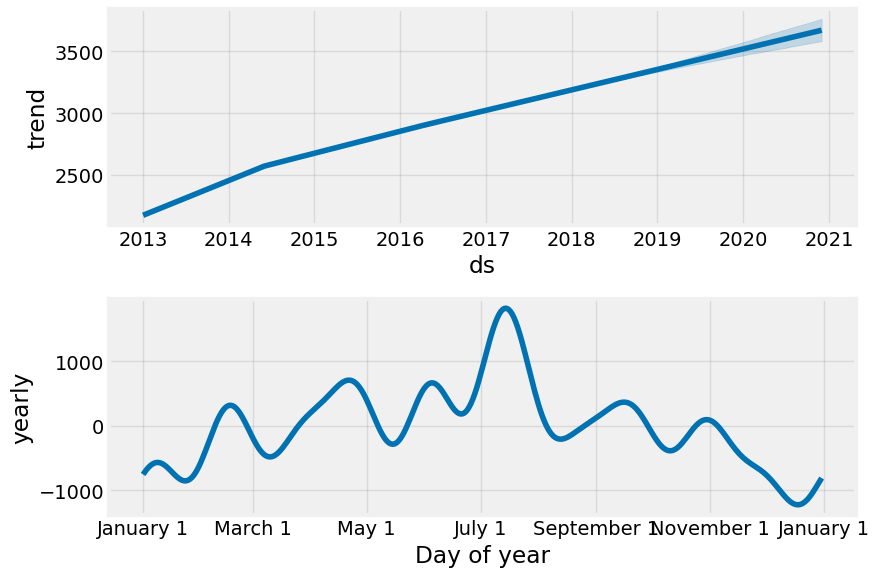

18:27:23 - cmdstanpy - INFO - Chain [1] start processing
18:27:23 - cmdstanpy - INFO - Chain [1] done processing


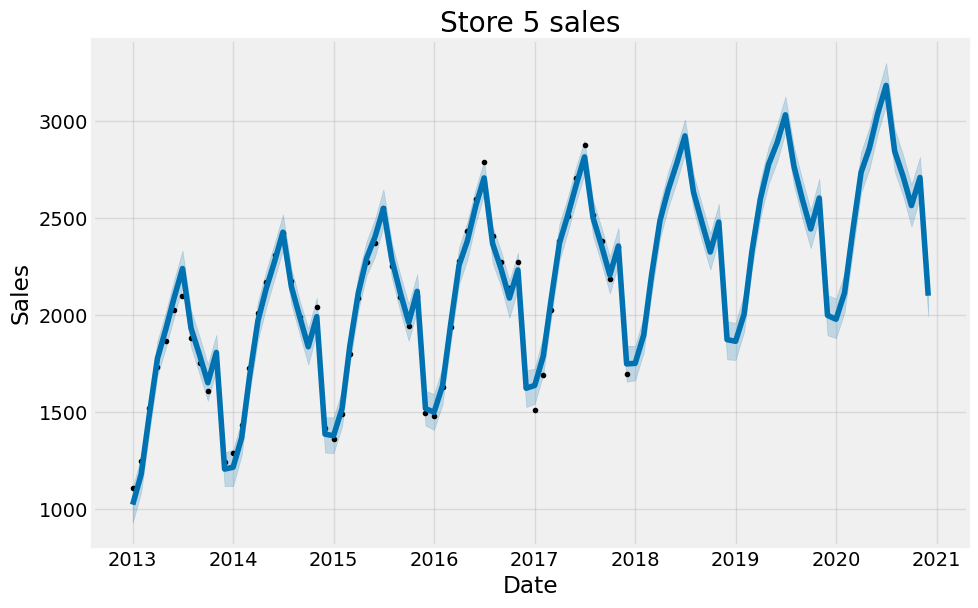

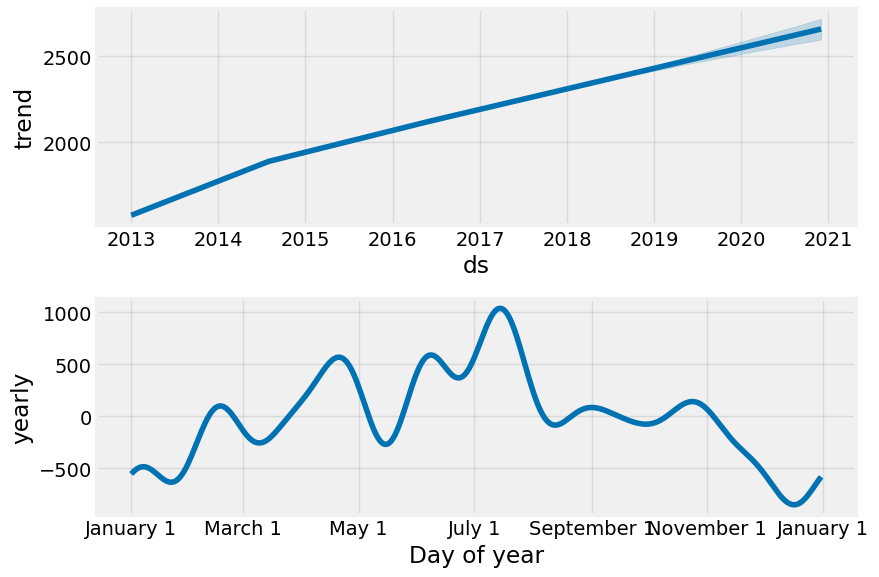

18:27:25 - cmdstanpy - INFO - Chain [1] start processing
18:27:25 - cmdstanpy - INFO - Chain [1] done processing


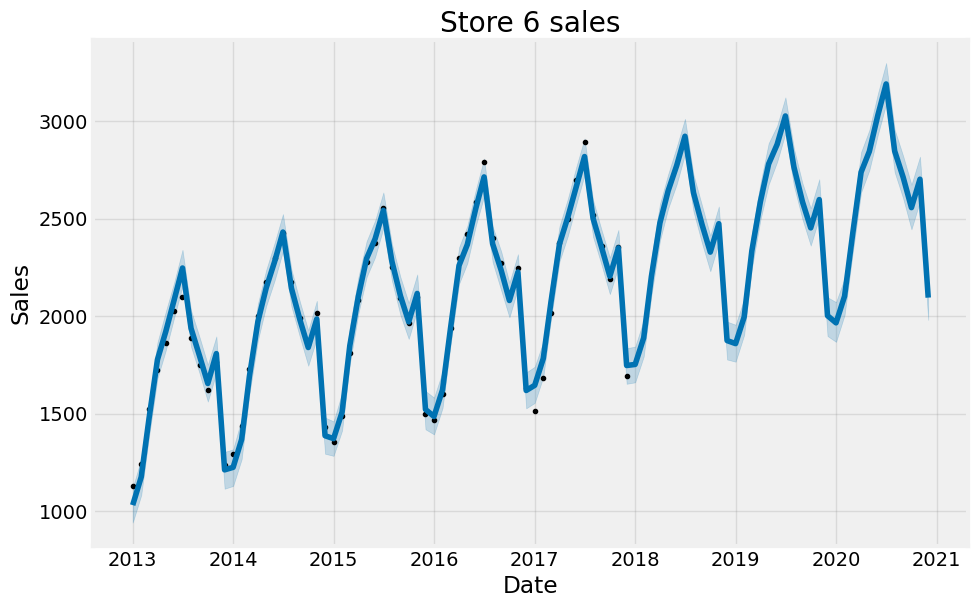

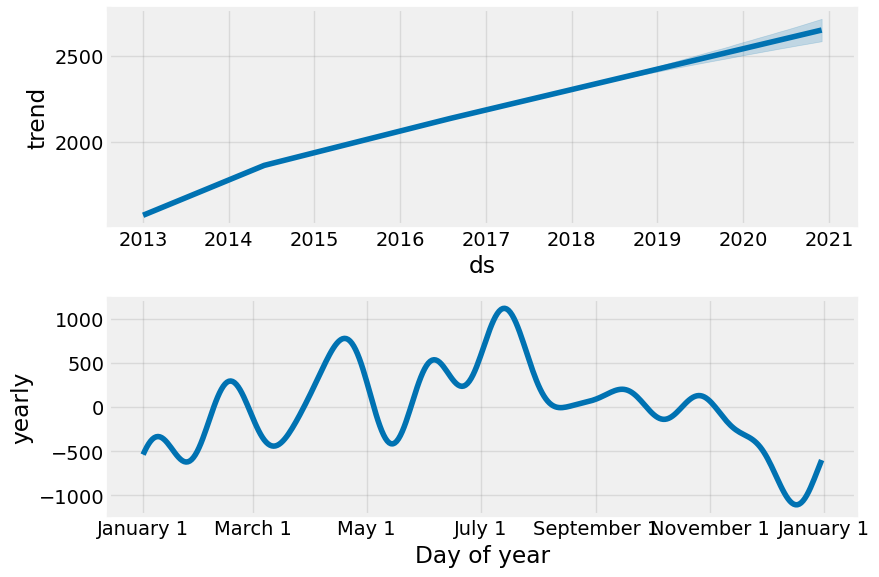

18:27:26 - cmdstanpy - INFO - Chain [1] start processing
18:27:27 - cmdstanpy - INFO - Chain [1] done processing


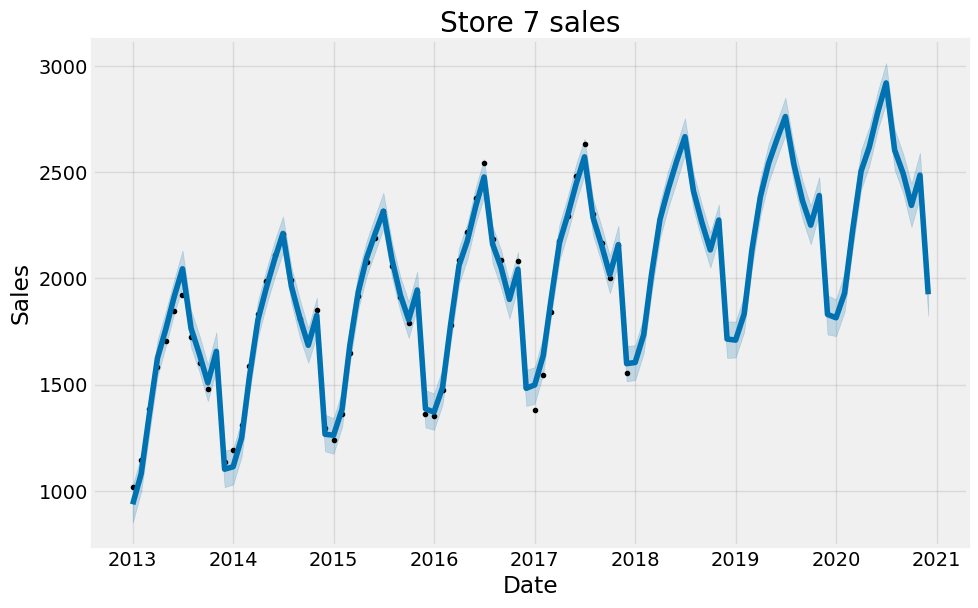

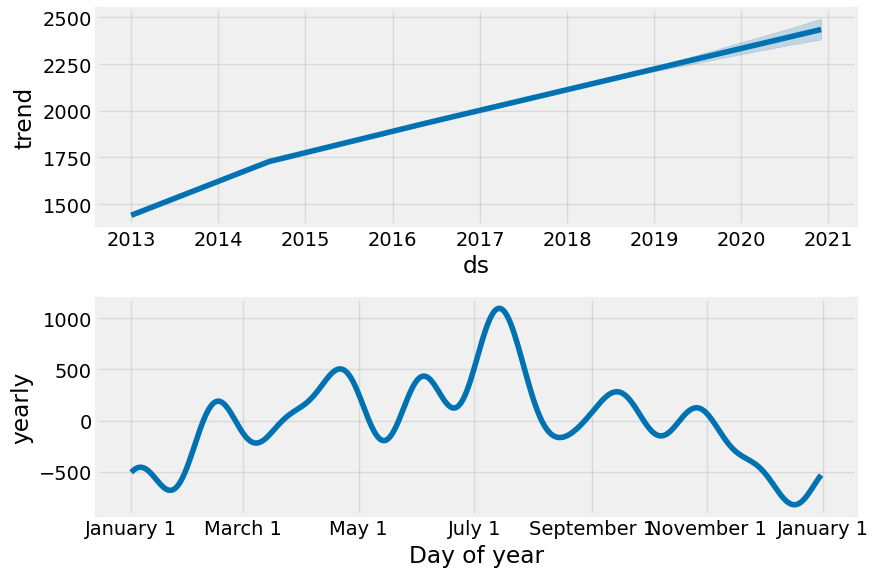

18:27:28 - cmdstanpy - INFO - Chain [1] start processing
18:27:29 - cmdstanpy - INFO - Chain [1] done processing


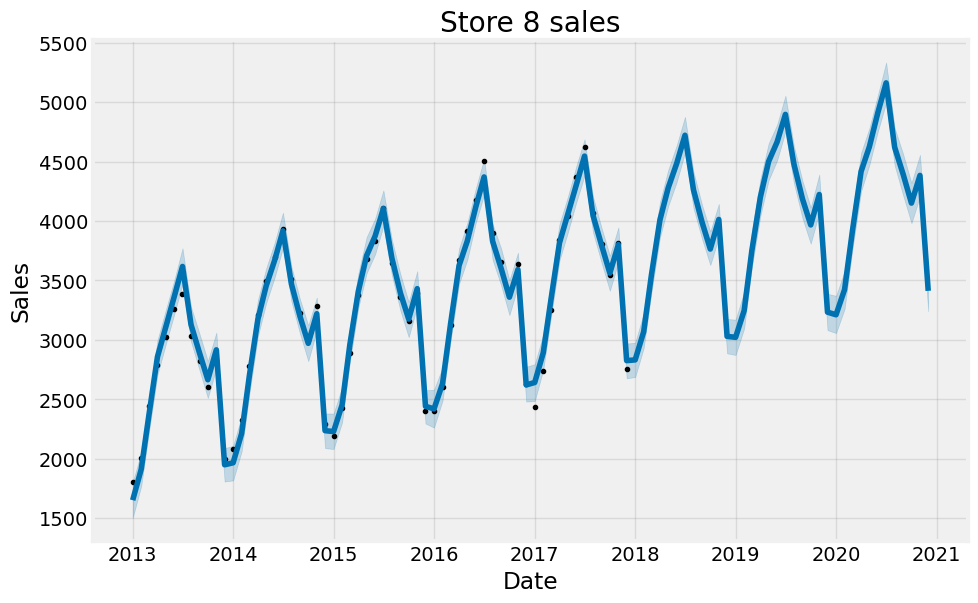

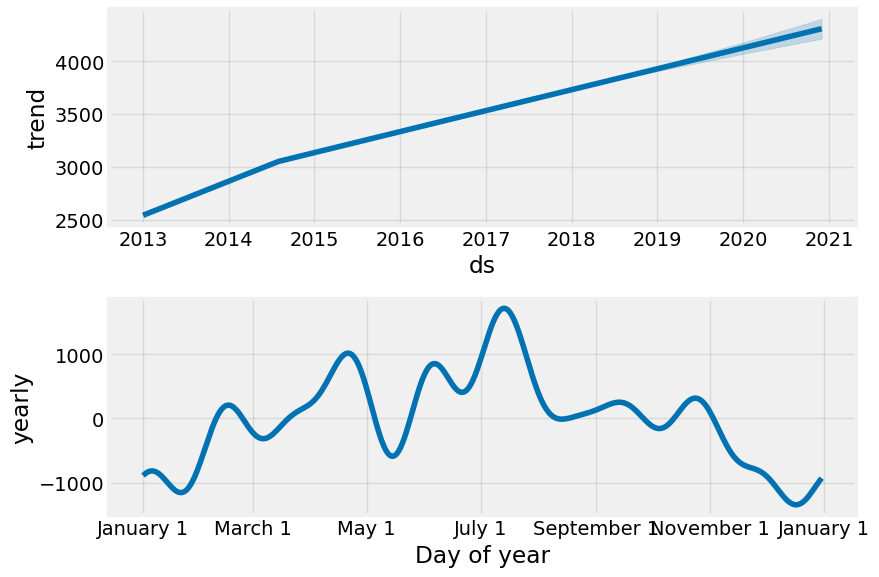

18:27:30 - cmdstanpy - INFO - Chain [1] start processing
18:27:30 - cmdstanpy - INFO - Chain [1] done processing


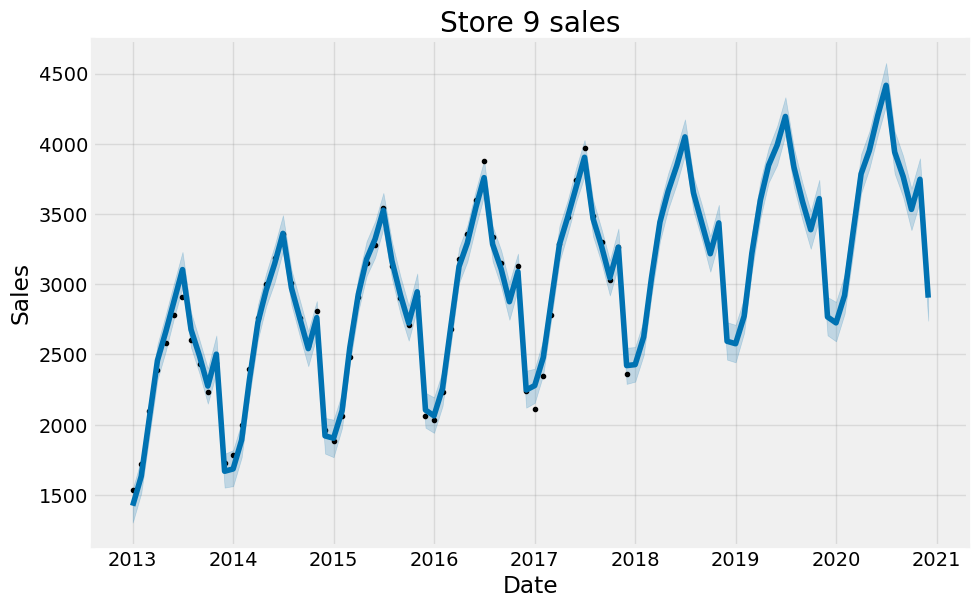

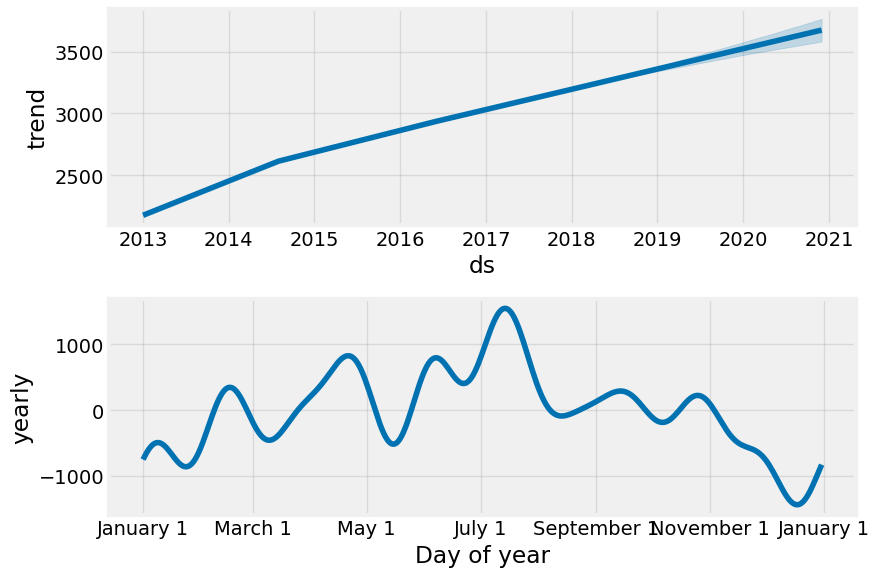

18:27:32 - cmdstanpy - INFO - Chain [1] start processing
18:27:32 - cmdstanpy - INFO - Chain [1] done processing


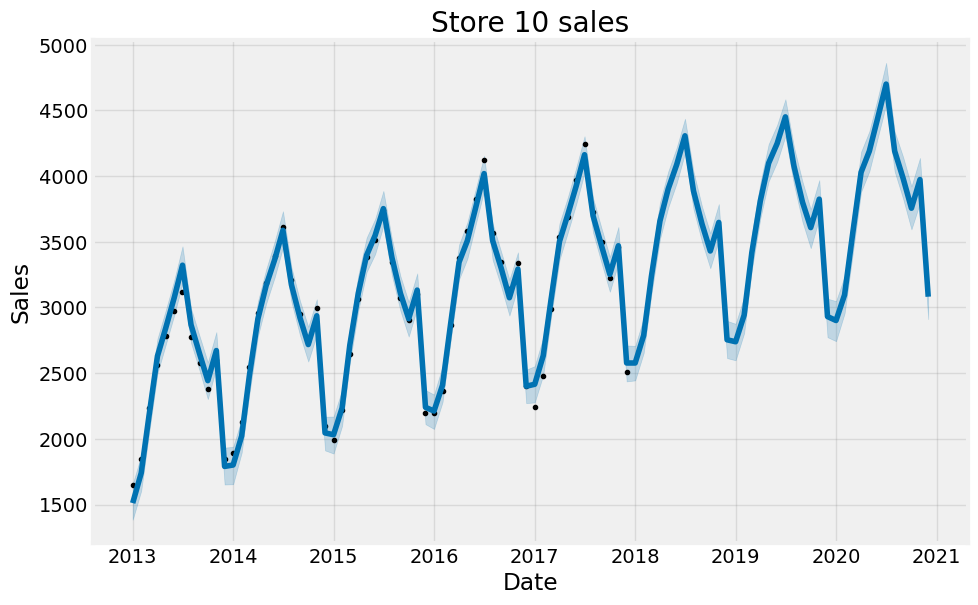

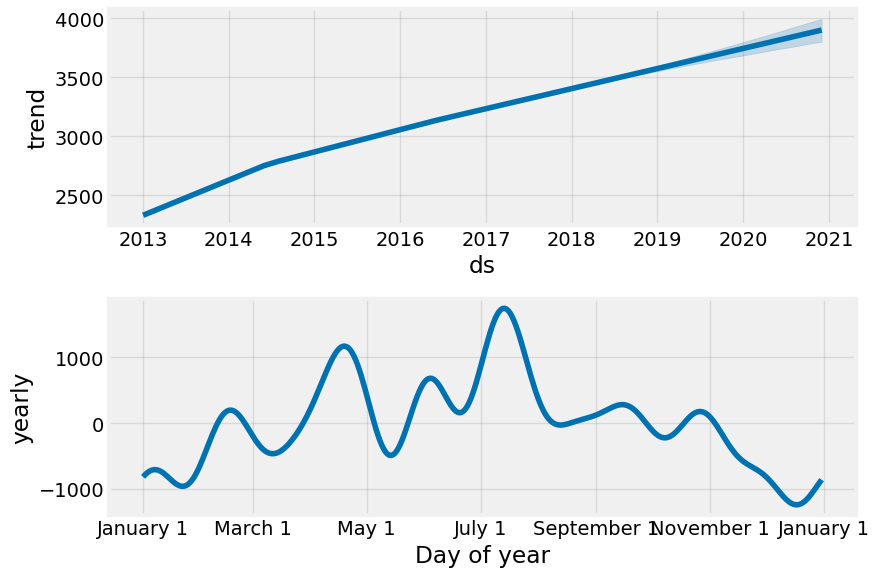

In [165]:
for i in df['store'].unique():
    store_sales=df[df['store']==i]
    store_daily=store_sales.groupby("date").agg({"sales":"sum"})
    store_monthly=store_daily.resample(rule='MS').mean()
    store = store_monthly.reset_index()
    store = store.rename(columns={'date': 'ds', 'sales': 'y'})
    store_model = Prophet(interval_width = 0.95)
    store_model.fit(store)
    store_forecast = store_model.make_future_dataframe(periods = 36, freq = 'MS')
    store_forecast = store_model.predict(store_forecast)
    store_model.plot(store_forecast, xlabel = 'Date', ylabel = 'Sales')
    plt.title('Store '+str(i)+' sales')
    store_model.plot_components(store_forecast)
    plt.show()

**Prediction of store 1 using differenet models**

In [166]:
comp

,Store1 Sales,ARIMA_Prediction,SARIMA_Prediction,Prophet_Prediction
date,,,,
2017-01-01,1809.225806,1953.337452,1932.203587,2109.242390
2017-02-01,2003.500000,2066.853920,1984.614559,2257.144088
2017-03-01,2388.290323,2407.550044,2383.556606,2559.494369
2017-04-01,2844.600000,2722.963436,2791.721769,2903.045391
2017-05-01,2975.741935,2840.037790,3011.586155,3093.708236
2017-06-01,3206.266667,3207.873386,3160.620970,3267.016036
2017-07-01,3425.387097,3464.151782,3444.014539,3458.422469
2017-08-01,2995.354839,2889.029940,2979.636785,3101.857127
2017-09-01,2825.300000,2829.383213,2840.419708,2930.803022


In [167]:
Store1_RMSE

,ARIMA_RMSE,SARIMA_RMSE,Prophet_RMSE
Store1,82.32,50.23,158.69


SARIMA works better because RMSE value for SARIMA is better.  